# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- [MNIST](http://yann.lecun.com/exdb/mnist/)
- [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html)

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

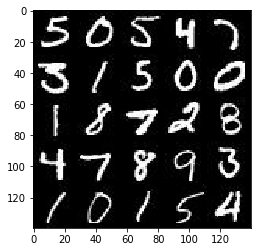

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

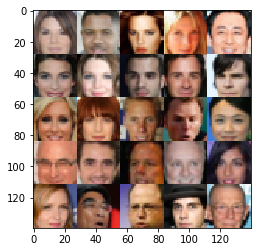

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    input_images = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels), name="real_image_input")
    z_data = tf.placeholder(tf.float32, (None, z_dim), name="z_input")
    learning_rate = tf.placeholder(tf.float32, None, name="learning_rate")

    return input_images, z_data, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [7]:
def leakyrelu(x, alpha=0.2):
    """
    Calculates a leakyrelu function
    :param x: input tensor
    :param alpha: defines the leakyness, values below 0 will get multiplied with this
    :return: output tensor
    """
    return tf.maximum(alpha * x, x)

In [14]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    
    def convo2d(inputs,  filters, batch_norm=True):
        outputs = tf.layers.conv2d(inputs, filters, 5, 2, padding="same")
        if batch_norm:
            outputs = tf.layers.batch_normalization(outputs, training=True)
        return leakyrelu(outputs)
        
    
    with tf.variable_scope("discriminator", reuse=reuse):
        # input 28*28*1 for mnist, 28*28*3 for celebA
        h1 = convo2d(images, 64, batch_norm=False)
        # 14*14*64
        h2 = convo2d(h1, 128)
        # 7*7*128
        h3 = convo2d(h2, 256)
        # 4*4*256
        
        flat = tf.reshape(h3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [30]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    
    with tf.variable_scope("generator", reuse=not is_train):
        g1 = tf.layers.dense(z, 7*7*512)
        g1 = tf.reshape(g1, (-1, 7, 7, 512))
        g1 = tf.layers.batch_normalization(g1, training=is_train)
        g1 = leakyrelu(g1)
        # 7*7*512
        
        g2 = tf.layers.conv2d_transpose(g1, 256, 5, strides=2, padding="same", activation=None)
        g2 = tf.layers.batch_normalization(g2, training=is_train)
        g2 = leakyrelu(g2)
        # 14*14*256
        
        g3 = tf.layers.conv2d_transpose(g2, 128, 5, strides=2, padding="same", activation=None)
        g3 = tf.layers.batch_normalization(g3, training=is_train)
        g3 = leakyrelu(g3)
        # 28*28*128
        
        # output layer
        logits = tf.layers.conv2d_transpose(g3, out_channel_dim, 5, strides=1, padding="same", activation=None)
        # 28*28*out_channel_dim now
        
        output = tf.tanh(logits)
    return output


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [32]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    smooth = 0.1
    
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_real, 
            labels=tf.ones_like(d_model_real) * (1- smooth))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_fake, 
            labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(
            logits=d_logits_fake, 
            labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [33]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [34]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [53]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    
    _, image_width, image_height, image_channels = data_shape
    
    input_real, input_z, lr = model_inputs(image_width, image_height, image_channels, z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, image_channels)
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    
    samples, losses = [], []
    steps = 0
    
    saver = tf.train.Saver()
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps += 1
                
                # So the values of the MNIST and CelebA dataset are in a range of -0.5 to 0.5
                batch_images *= 2
                
                # Sample ramdom noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z, input_real: batch_images})
                
                if steps % 10 == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})
                
                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                            "Generator Loss: {:.4f}".format(train_loss_g),
                            "Discriminator Loss: {:.4f}...".format(train_loss_d))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))
                
                if steps % 100 == 0:
                    show_generator_output(sess, 16, input_z, image_channels, data_image_mode)
                    
        saver.save(sess, "./checkpoints/generator.ckpt")
        show_generator_output(sess, 16, input_z, image_channels, data_image_mode)
    return losses

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Generator Loss: 8.4189 Discriminator Loss: 0.0002...
Epoch 1/2... Generator Loss: 34.0672 Discriminator Loss: 26.7649...
Epoch 1/2... Generator Loss: 1.8874 Discriminator Loss: 0.7783...
Epoch 1/2... Generator Loss: 3.0788 Discriminator Loss: 0.1050...
Epoch 1/2... Generator Loss: 13.2902 Discriminator Loss: 0.0000...
Epoch 1/2... Generator Loss: 0.0221 Discriminator Loss: 5.6617...
Epoch 1/2... Generator Loss: 0.0455 Discriminator Loss: 3.4776...
Epoch 1/2... Generator Loss: 0.5191 Discriminator Loss: 1.5037...
Epoch 1/2... Generator Loss: 2.2375 Discriminator Loss: 1.0835...
Epoch 1/2... Generator Loss: 2.5368 Discriminator Loss: 2.2419...


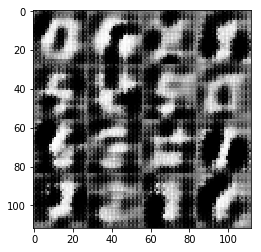

Epoch 1/2... Generator Loss: 2.3626 Discriminator Loss: 1.3683...
Epoch 1/2... Generator Loss: 0.6348 Discriminator Loss: 1.2755...
Epoch 1/2... Generator Loss: 1.4086 Discriminator Loss: 1.3453...
Epoch 1/2... Generator Loss: 1.5408 Discriminator Loss: 1.3265...
Epoch 1/2... Generator Loss: 0.3233 Discriminator Loss: 1.8487...
Epoch 1/2... Generator Loss: 0.3974 Discriminator Loss: 1.4304...
Epoch 1/2... Generator Loss: 0.2931 Discriminator Loss: 1.8154...
Epoch 1/2... Generator Loss: 0.3246 Discriminator Loss: 1.7533...
Epoch 1/2... Generator Loss: 0.1993 Discriminator Loss: 2.3122...
Epoch 1/2... Generator Loss: 1.0487 Discriminator Loss: 0.8973...


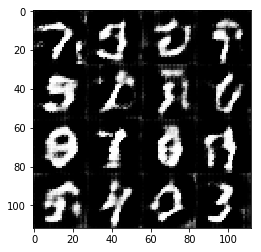

Epoch 1/2... Generator Loss: 0.6349 Discriminator Loss: 1.2397...
Epoch 1/2... Generator Loss: 0.7515 Discriminator Loss: 1.3567...
Epoch 1/2... Generator Loss: 1.5964 Discriminator Loss: 0.9120...
Epoch 1/2... Generator Loss: 1.0198 Discriminator Loss: 1.3847...
Epoch 1/2... Generator Loss: 1.2110 Discriminator Loss: 1.4368...
Epoch 1/2... Generator Loss: 2.0029 Discriminator Loss: 1.7390...
Epoch 1/2... Generator Loss: 0.9399 Discriminator Loss: 0.9973...
Epoch 1/2... Generator Loss: 0.9428 Discriminator Loss: 1.2365...
Epoch 1/2... Generator Loss: 0.8569 Discriminator Loss: 1.4328...
Epoch 1/2... Generator Loss: 1.1449 Discriminator Loss: 1.1145...


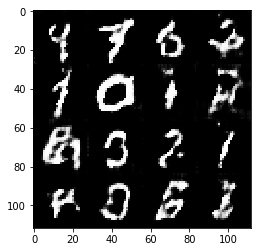

Epoch 1/2... Generator Loss: 1.3425 Discriminator Loss: 1.2889...
Epoch 1/2... Generator Loss: 1.3215 Discriminator Loss: 0.7460...
Epoch 1/2... Generator Loss: 2.7454 Discriminator Loss: 1.7720...
Epoch 1/2... Generator Loss: 0.7479 Discriminator Loss: 1.1274...
Epoch 1/2... Generator Loss: 2.1786 Discriminator Loss: 1.4116...
Epoch 1/2... Generator Loss: 1.0023 Discriminator Loss: 1.1273...
Epoch 1/2... Generator Loss: 1.0994 Discriminator Loss: 0.7767...
Epoch 1/2... Generator Loss: 0.7258 Discriminator Loss: 0.9810...
Epoch 1/2... Generator Loss: 0.4012 Discriminator Loss: 1.4105...
Epoch 1/2... Generator Loss: 1.9732 Discriminator Loss: 1.2703...


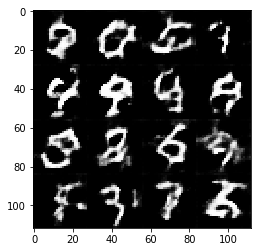

Epoch 1/2... Generator Loss: 0.9620 Discriminator Loss: 1.1219...
Epoch 1/2... Generator Loss: 1.3158 Discriminator Loss: 1.4413...
Epoch 1/2... Generator Loss: 0.6028 Discriminator Loss: 1.3138...
Epoch 1/2... Generator Loss: 0.6654 Discriminator Loss: 1.2422...
Epoch 1/2... Generator Loss: 1.1996 Discriminator Loss: 1.1975...
Epoch 1/2... Generator Loss: 1.5394 Discriminator Loss: 1.5190...
Epoch 1/2... Generator Loss: 1.2292 Discriminator Loss: 1.2181...
Epoch 1/2... Generator Loss: 0.4387 Discriminator Loss: 1.4722...
Epoch 1/2... Generator Loss: 0.3956 Discriminator Loss: 1.4617...
Epoch 1/2... Generator Loss: 0.7161 Discriminator Loss: 1.0738...


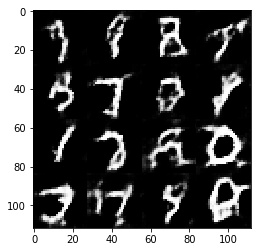

Epoch 1/2... Generator Loss: 0.4437 Discriminator Loss: 1.3610...
Epoch 1/2... Generator Loss: 1.7087 Discriminator Loss: 1.1750...
Epoch 1/2... Generator Loss: 1.8764 Discriminator Loss: 1.7596...
Epoch 1/2... Generator Loss: 0.2951 Discriminator Loss: 1.6321...
Epoch 1/2... Generator Loss: 0.3848 Discriminator Loss: 1.3107...
Epoch 1/2... Generator Loss: 0.6061 Discriminator Loss: 1.1342...
Epoch 1/2... Generator Loss: 0.3348 Discriminator Loss: 1.5231...
Epoch 1/2... Generator Loss: 0.3262 Discriminator Loss: 1.5860...
Epoch 1/2... Generator Loss: 0.4169 Discriminator Loss: 1.4366...
Epoch 1/2... Generator Loss: 1.4419 Discriminator Loss: 1.3192...


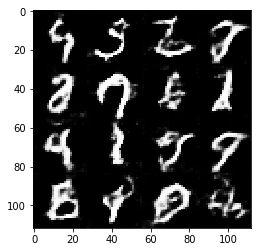

Epoch 1/2... Generator Loss: 1.5858 Discriminator Loss: 1.2761...
Epoch 1/2... Generator Loss: 0.9813 Discriminator Loss: 1.2583...
Epoch 1/2... Generator Loss: 0.8364 Discriminator Loss: 1.2879...
Epoch 1/2... Generator Loss: 0.5970 Discriminator Loss: 1.4720...
Epoch 1/2... Generator Loss: 0.3678 Discriminator Loss: 1.4858...
Epoch 1/2... Generator Loss: 0.3523 Discriminator Loss: 1.5320...
Epoch 1/2... Generator Loss: 0.6846 Discriminator Loss: 1.2270...
Epoch 1/2... Generator Loss: 0.3327 Discriminator Loss: 1.5357...
Epoch 1/2... Generator Loss: 1.3103 Discriminator Loss: 1.3033...
Epoch 1/2... Generator Loss: 1.3071 Discriminator Loss: 1.0294...


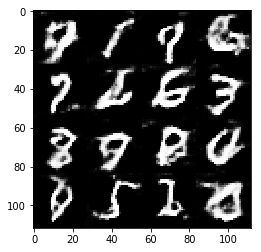

Epoch 1/2... Generator Loss: 1.7543 Discriminator Loss: 1.5483...
Epoch 1/2... Generator Loss: 0.4061 Discriminator Loss: 1.4108...
Epoch 1/2... Generator Loss: 0.4230 Discriminator Loss: 1.3750...
Epoch 1/2... Generator Loss: 0.3760 Discriminator Loss: 1.6958...
Epoch 1/2... Generator Loss: 0.5216 Discriminator Loss: 1.2816...
Epoch 1/2... Generator Loss: 0.2337 Discriminator Loss: 1.8031...
Epoch 1/2... Generator Loss: 0.4099 Discriminator Loss: 1.3740...
Epoch 1/2... Generator Loss: 0.4379 Discriminator Loss: 1.4788...
Epoch 1/2... Generator Loss: 0.8225 Discriminator Loss: 1.1815...
Epoch 1/2... Generator Loss: 0.5213 Discriminator Loss: 1.2721...


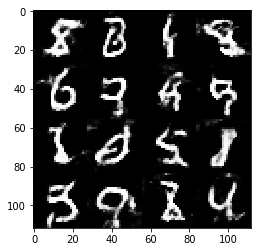

Epoch 1/2... Generator Loss: 0.8042 Discriminator Loss: 1.0850...
Epoch 1/2... Generator Loss: 0.2646 Discriminator Loss: 1.7187...
Epoch 1/2... Generator Loss: 0.8613 Discriminator Loss: 1.0886...
Epoch 1/2... Generator Loss: 0.4625 Discriminator Loss: 1.2435...
Epoch 1/2... Generator Loss: 0.3742 Discriminator Loss: 1.4663...
Epoch 1/2... Generator Loss: 0.2949 Discriminator Loss: 1.6960...
Epoch 1/2... Generator Loss: 0.6771 Discriminator Loss: 1.2003...
Epoch 1/2... Generator Loss: 1.2135 Discriminator Loss: 1.2294...
Epoch 1/2... Generator Loss: 1.3250 Discriminator Loss: 1.2524...
Epoch 1/2... Generator Loss: 0.3821 Discriminator Loss: 1.4537...


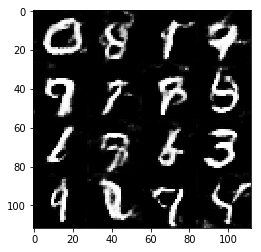

Epoch 1/2... Generator Loss: 0.3188 Discriminator Loss: 1.6171...
Epoch 1/2... Generator Loss: 0.5766 Discriminator Loss: 1.2858...
Epoch 1/2... Generator Loss: 0.3240 Discriminator Loss: 1.5558...
Epoch 2/2... Generator Loss: 0.3743 Discriminator Loss: 1.5357...
Epoch 2/2... Generator Loss: 0.3206 Discriminator Loss: 1.6309...
Epoch 2/2... Generator Loss: 0.8788 Discriminator Loss: 1.1338...
Epoch 2/2... Generator Loss: 1.6242 Discriminator Loss: 1.3935...
Epoch 2/2... Generator Loss: 0.6451 Discriminator Loss: 1.2038...
Epoch 2/2... Generator Loss: 0.3424 Discriminator Loss: 1.5902...
Epoch 2/2... Generator Loss: 0.5576 Discriminator Loss: 1.2945...


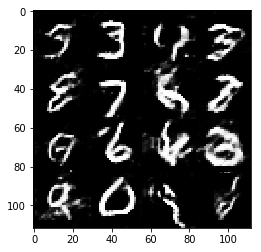

Epoch 2/2... Generator Loss: 0.3506 Discriminator Loss: 1.3918...
Epoch 2/2... Generator Loss: 0.6760 Discriminator Loss: 1.2514...
Epoch 2/2... Generator Loss: 0.5191 Discriminator Loss: 1.2686...
Epoch 2/2... Generator Loss: 0.2294 Discriminator Loss: 1.8862...
Epoch 2/2... Generator Loss: 0.6632 Discriminator Loss: 1.1961...
Epoch 2/2... Generator Loss: 0.6430 Discriminator Loss: 1.2236...
Epoch 2/2... Generator Loss: 1.0937 Discriminator Loss: 1.3924...
Epoch 2/2... Generator Loss: 0.8917 Discriminator Loss: 1.2230...
Epoch 2/2... Generator Loss: 1.3079 Discriminator Loss: 1.0545...
Epoch 2/2... Generator Loss: 0.7883 Discriminator Loss: 1.2029...


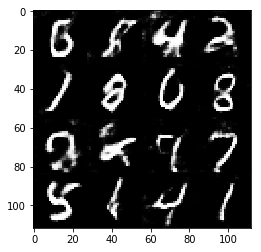

Epoch 2/2... Generator Loss: 0.5271 Discriminator Loss: 1.3457...
Epoch 2/2... Generator Loss: 0.7246 Discriminator Loss: 1.0439...
Epoch 2/2... Generator Loss: 1.4751 Discriminator Loss: 1.6925...
Epoch 2/2... Generator Loss: 0.5888 Discriminator Loss: 1.2098...
Epoch 2/2... Generator Loss: 1.6727 Discriminator Loss: 1.5533...
Epoch 2/2... Generator Loss: 0.6312 Discriminator Loss: 1.2729...
Epoch 2/2... Generator Loss: 0.3741 Discriminator Loss: 1.4371...
Epoch 2/2... Generator Loss: 1.3963 Discriminator Loss: 0.9487...
Epoch 2/2... Generator Loss: 0.8845 Discriminator Loss: 1.1340...
Epoch 2/2... Generator Loss: 0.2888 Discriminator Loss: 1.6861...


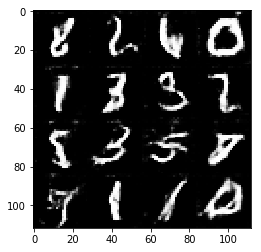

Epoch 2/2... Generator Loss: 0.4076 Discriminator Loss: 1.4603...
Epoch 2/2... Generator Loss: 0.5530 Discriminator Loss: 1.3251...
Epoch 2/2... Generator Loss: 0.6307 Discriminator Loss: 1.1669...
Epoch 2/2... Generator Loss: 0.1666 Discriminator Loss: 2.1765...
Epoch 2/2... Generator Loss: 0.3374 Discriminator Loss: 1.5561...
Epoch 2/2... Generator Loss: 0.5741 Discriminator Loss: 1.3358...
Epoch 2/2... Generator Loss: 1.7784 Discriminator Loss: 1.3642...
Epoch 2/2... Generator Loss: 1.1890 Discriminator Loss: 1.0593...
Epoch 2/2... Generator Loss: 1.3497 Discriminator Loss: 0.9479...
Epoch 2/2... Generator Loss: 1.7179 Discriminator Loss: 1.3756...


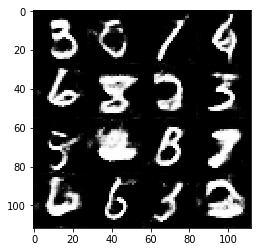

Epoch 2/2... Generator Loss: 0.7587 Discriminator Loss: 1.1073...
Epoch 2/2... Generator Loss: 0.3406 Discriminator Loss: 1.5853...
Epoch 2/2... Generator Loss: 0.5995 Discriminator Loss: 1.1117...
Epoch 2/2... Generator Loss: 0.3333 Discriminator Loss: 1.5431...
Epoch 2/2... Generator Loss: 0.6541 Discriminator Loss: 1.1380...
Epoch 2/2... Generator Loss: 1.2459 Discriminator Loss: 0.9448...
Epoch 2/2... Generator Loss: 0.9874 Discriminator Loss: 0.8229...
Epoch 2/2... Generator Loss: 0.3187 Discriminator Loss: 1.6446...
Epoch 2/2... Generator Loss: 0.6126 Discriminator Loss: 1.1663...
Epoch 2/2... Generator Loss: 0.3017 Discriminator Loss: 1.6722...


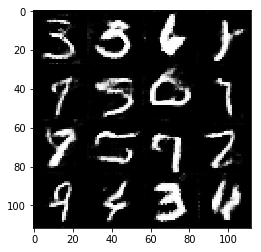

Epoch 2/2... Generator Loss: 0.4020 Discriminator Loss: 1.4229...
Epoch 2/2... Generator Loss: 0.3372 Discriminator Loss: 1.6936...
Epoch 2/2... Generator Loss: 0.4204 Discriminator Loss: 1.3869...
Epoch 2/2... Generator Loss: 0.1798 Discriminator Loss: 2.0638...
Epoch 2/2... Generator Loss: 0.4176 Discriminator Loss: 1.4807...
Epoch 2/2... Generator Loss: 0.4473 Discriminator Loss: 1.3753...
Epoch 2/2... Generator Loss: 0.6958 Discriminator Loss: 1.1305...
Epoch 2/2... Generator Loss: 1.1369 Discriminator Loss: 0.8668...
Epoch 2/2... Generator Loss: 0.7718 Discriminator Loss: 1.1500...
Epoch 2/2... Generator Loss: 1.0691 Discriminator Loss: 1.4196...


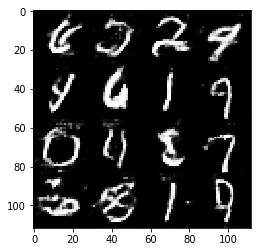

Epoch 2/2... Generator Loss: 1.3953 Discriminator Loss: 1.0069...
Epoch 2/2... Generator Loss: 1.4848 Discriminator Loss: 1.5084...
Epoch 2/2... Generator Loss: 0.8822 Discriminator Loss: 0.9708...
Epoch 2/2... Generator Loss: 1.4476 Discriminator Loss: 1.1911...
Epoch 2/2... Generator Loss: 0.7054 Discriminator Loss: 1.0221...
Epoch 2/2... Generator Loss: 1.3526 Discriminator Loss: 1.3526...
Epoch 2/2... Generator Loss: 0.6469 Discriminator Loss: 1.0758...
Epoch 2/2... Generator Loss: 0.5991 Discriminator Loss: 1.1423...
Epoch 2/2... Generator Loss: 1.7063 Discriminator Loss: 1.0469...
Epoch 2/2... Generator Loss: 0.9112 Discriminator Loss: 1.1303...


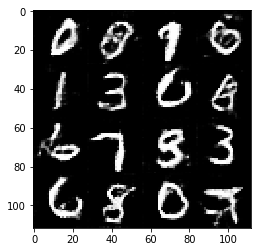

Epoch 2/2... Generator Loss: 1.9366 Discriminator Loss: 1.2275...
Epoch 2/2... Generator Loss: 1.3995 Discriminator Loss: 1.1922...
Epoch 2/2... Generator Loss: 0.4840 Discriminator Loss: 1.3074...
Epoch 2/2... Generator Loss: 0.5027 Discriminator Loss: 1.1987...
Epoch 2/2... Generator Loss: 0.3742 Discriminator Loss: 1.5308...
Epoch 2/2... Generator Loss: 0.1920 Discriminator Loss: 2.0924...
Epoch 2/2... Generator Loss: 0.4878 Discriminator Loss: 1.3759...
Epoch 2/2... Generator Loss: 1.1803 Discriminator Loss: 0.8780...
Epoch 2/2... Generator Loss: 1.2216 Discriminator Loss: 1.0239...
Epoch 2/2... Generator Loss: 1.1694 Discriminator Loss: 1.1861...


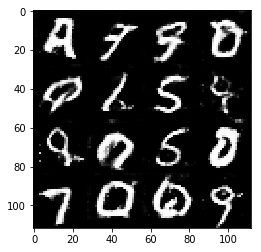

Epoch 2/2... Generator Loss: 0.6939 Discriminator Loss: 1.3645...
Epoch 2/2... Generator Loss: 0.6205 Discriminator Loss: 1.1692...
Epoch 2/2... Generator Loss: 0.3817 Discriminator Loss: 1.4872...
Epoch 2/2... Generator Loss: 0.5874 Discriminator Loss: 1.2083...
Epoch 2/2... Generator Loss: 3.2163 Discriminator Loss: 2.1996...
Epoch 2/2... Generator Loss: 1.0906 Discriminator Loss: 1.0795...
Epoch 2/2... Generator Loss: 0.4708 Discriminator Loss: 1.3320...
Epoch 2/2... Generator Loss: 0.5004 Discriminator Loss: 1.3128...
Epoch 2/2... Generator Loss: 1.4441 Discriminator Loss: 0.8869...
Epoch 2/2... Generator Loss: 2.1674 Discriminator Loss: 1.5837...


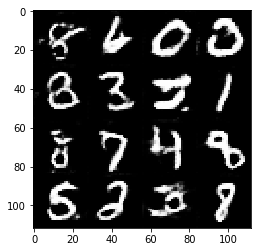

Epoch 2/2... Generator Loss: 0.5858 Discriminator Loss: 1.0679...
Epoch 2/2... Generator Loss: 0.4979 Discriminator Loss: 1.3539...
Epoch 2/2... Generator Loss: 0.5715 Discriminator Loss: 1.1315...
Epoch 2/2... Generator Loss: 1.1365 Discriminator Loss: 1.0821...
Epoch 2/2... Generator Loss: 1.0612 Discriminator Loss: 0.8774...
Epoch 2/2... Generator Loss: 0.4306 Discriminator Loss: 1.3865...
Epoch 2/2... Generator Loss: 0.5520 Discriminator Loss: 1.1843...


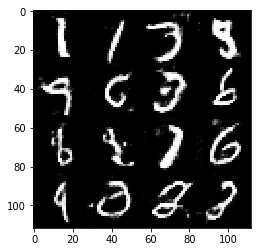

In [54]:
batch_size = 64
z_dim = 100
learning_rate = 0.002
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/10... Generator Loss: 0.0905 Discriminator Loss: 2.8175...
Epoch 1/10... Generator Loss: 0.0754 Discriminator Loss: 3.1378...
Epoch 1/10... Generator Loss: 0.0538 Discriminator Loss: 3.1585...
Epoch 1/10... Generator Loss: 0.0956 Discriminator Loss: 2.5719...
Epoch 1/10... Generator Loss: 0.3951 Discriminator Loss: 1.4971...
Epoch 1/10... Generator Loss: 0.5764 Discriminator Loss: 1.0111...
Epoch 1/10... Generator Loss: 1.0342 Discriminator Loss: 0.6930...
Epoch 1/10... Generator Loss: 0.1771 Discriminator Loss: 2.0053...
Epoch 1/10... Generator Loss: 0.5298 Discriminator Loss: 1.1509...
Epoch 1/10... Generator Loss: 0.7096 Discriminator Loss: 0.9096...


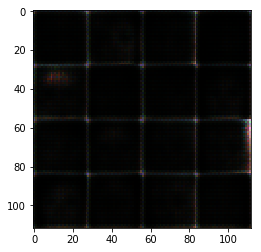

Epoch 1/10... Generator Loss: 0.0633 Discriminator Loss: 2.9477...
Epoch 1/10... Generator Loss: 0.2847 Discriminator Loss: 1.6244...
Epoch 1/10... Generator Loss: 0.2065 Discriminator Loss: 1.9470...
Epoch 1/10... Generator Loss: 0.4071 Discriminator Loss: 1.3801...
Epoch 1/10... Generator Loss: 0.1130 Discriminator Loss: 2.4618...
Epoch 1/10... Generator Loss: 0.2243 Discriminator Loss: 1.8234...
Epoch 1/10... Generator Loss: 0.6158 Discriminator Loss: 1.0438...
Epoch 1/10... Generator Loss: 3.1200 Discriminator Loss: 0.6438...
Epoch 1/10... Generator Loss: 2.5220 Discriminator Loss: 1.2450...
Epoch 1/10... Generator Loss: 0.1643 Discriminator Loss: 2.3212...


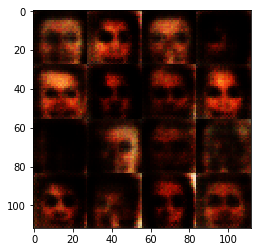

Epoch 1/10... Generator Loss: 3.2471 Discriminator Loss: 0.5123...
Epoch 1/10... Generator Loss: 1.9086 Discriminator Loss: 0.7507...
Epoch 1/10... Generator Loss: 0.0821 Discriminator Loss: 2.7828...
Epoch 1/10... Generator Loss: 0.3585 Discriminator Loss: 1.4677...
Epoch 1/10... Generator Loss: 0.2076 Discriminator Loss: 1.8545...
Epoch 1/10... Generator Loss: 0.4370 Discriminator Loss: 1.2541...
Epoch 1/10... Generator Loss: 0.2735 Discriminator Loss: 1.7157...
Epoch 1/10... Generator Loss: 0.2229 Discriminator Loss: 1.8847...
Epoch 1/10... Generator Loss: 1.8142 Discriminator Loss: 0.8588...
Epoch 1/10... Generator Loss: 1.6968 Discriminator Loss: 1.0322...


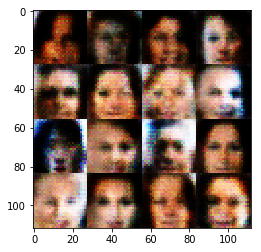

Epoch 1/10... Generator Loss: 1.6631 Discriminator Loss: 2.0886...
Epoch 1/10... Generator Loss: 3.9167 Discriminator Loss: 0.6981...
Epoch 1/10... Generator Loss: 0.5995 Discriminator Loss: 1.0116...
Epoch 1/10... Generator Loss: 0.2324 Discriminator Loss: 1.7714...
Epoch 1/10... Generator Loss: 0.2685 Discriminator Loss: 1.6828...
Epoch 1/10... Generator Loss: 0.5887 Discriminator Loss: 0.9701...
Epoch 1/10... Generator Loss: 2.9641 Discriminator Loss: 0.6527...
Epoch 1/10... Generator Loss: 2.3673 Discriminator Loss: 0.2858...
Epoch 1/10... Generator Loss: 0.2284 Discriminator Loss: 1.7888...
Epoch 1/10... Generator Loss: 3.3070 Discriminator Loss: 0.5689...


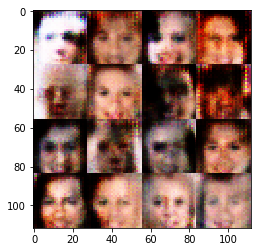

Epoch 1/10... Generator Loss: 0.1943 Discriminator Loss: 1.9411...
Epoch 1/10... Generator Loss: 0.6317 Discriminator Loss: 1.3583...
Epoch 1/10... Generator Loss: 4.7766 Discriminator Loss: 1.1457...
Epoch 1/10... Generator Loss: 3.2757 Discriminator Loss: 0.2267...
Epoch 1/10... Generator Loss: 3.8751 Discriminator Loss: 0.7483...
Epoch 1/10... Generator Loss: 1.6657 Discriminator Loss: 0.4461...
Epoch 1/10... Generator Loss: 2.5501 Discriminator Loss: 3.1606...
Epoch 1/10... Generator Loss: 1.7617 Discriminator Loss: 0.3993...
Epoch 1/10... Generator Loss: 1.6335 Discriminator Loss: 0.4663...
Epoch 1/10... Generator Loss: 0.8056 Discriminator Loss: 0.9487...


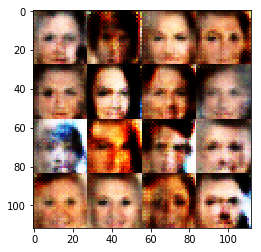

Epoch 1/10... Generator Loss: 0.8462 Discriminator Loss: 1.8311...
Epoch 1/10... Generator Loss: 2.6283 Discriminator Loss: 0.9064...
Epoch 1/10... Generator Loss: 2.0357 Discriminator Loss: 1.0606...
Epoch 1/10... Generator Loss: 0.8354 Discriminator Loss: 1.0690...
Epoch 1/10... Generator Loss: 2.5830 Discriminator Loss: 0.8270...
Epoch 1/10... Generator Loss: 1.0728 Discriminator Loss: 0.6448...
Epoch 1/10... Generator Loss: 1.1613 Discriminator Loss: 0.7259...
Epoch 1/10... Generator Loss: 0.4272 Discriminator Loss: 1.2481...
Epoch 1/10... Generator Loss: 0.7480 Discriminator Loss: 1.2353...
Epoch 1/10... Generator Loss: 0.9142 Discriminator Loss: 0.8230...


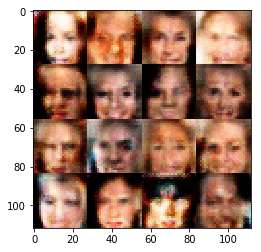

Epoch 1/10... Generator Loss: 1.6918 Discriminator Loss: 0.3787...
Epoch 1/10... Generator Loss: 1.6055 Discriminator Loss: 0.4696...
Epoch 1/10... Generator Loss: 1.1057 Discriminator Loss: 0.6439...
Epoch 1/10... Generator Loss: 2.9065 Discriminator Loss: 0.2758...
Epoch 1/10... Generator Loss: 0.8985 Discriminator Loss: 1.9248...
Epoch 1/10... Generator Loss: 0.4762 Discriminator Loss: 1.4877...
Epoch 1/10... Generator Loss: 0.5251 Discriminator Loss: 1.2103...
Epoch 1/10... Generator Loss: 0.4586 Discriminator Loss: 1.1997...
Epoch 1/10... Generator Loss: 0.9886 Discriminator Loss: 0.9923...
Epoch 1/10... Generator Loss: 2.0115 Discriminator Loss: 0.8776...


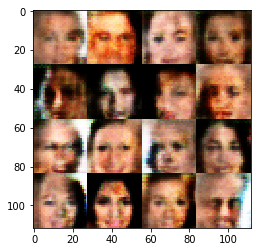

Epoch 1/10... Generator Loss: 1.6427 Discriminator Loss: 0.6676...
Epoch 1/10... Generator Loss: 0.8724 Discriminator Loss: 0.7769...
Epoch 1/10... Generator Loss: 1.7830 Discriminator Loss: 0.5226...
Epoch 1/10... Generator Loss: 2.6673 Discriminator Loss: 1.5352...
Epoch 1/10... Generator Loss: 1.5780 Discriminator Loss: 1.3724...
Epoch 1/10... Generator Loss: 1.9567 Discriminator Loss: 0.5973...
Epoch 1/10... Generator Loss: 0.5101 Discriminator Loss: 1.0826...
Epoch 1/10... Generator Loss: 1.4987 Discriminator Loss: 0.7464...
Epoch 1/10... Generator Loss: 0.4968 Discriminator Loss: 1.0991...
Epoch 1/10... Generator Loss: 0.8498 Discriminator Loss: 0.8096...


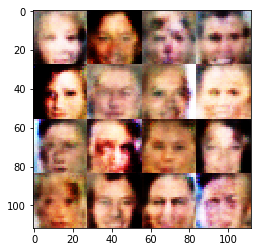

Epoch 1/10... Generator Loss: 3.0063 Discriminator Loss: 1.2510...
Epoch 1/10... Generator Loss: 3.0448 Discriminator Loss: 1.1804...
Epoch 1/10... Generator Loss: 3.5192 Discriminator Loss: 2.4012...
Epoch 1/10... Generator Loss: 1.7595 Discriminator Loss: 1.3114...
Epoch 1/10... Generator Loss: 1.6361 Discriminator Loss: 0.8126...
Epoch 1/10... Generator Loss: 1.9036 Discriminator Loss: 1.4999...
Epoch 1/10... Generator Loss: 0.9977 Discriminator Loss: 0.7851...
Epoch 1/10... Generator Loss: 0.5433 Discriminator Loss: 1.4005...
Epoch 1/10... Generator Loss: 0.4890 Discriminator Loss: 1.1589...
Epoch 1/10... Generator Loss: 0.2404 Discriminator Loss: 1.7234...


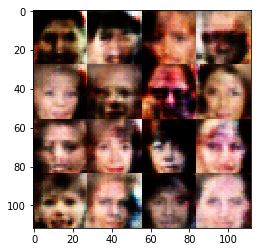

Epoch 1/10... Generator Loss: 0.1273 Discriminator Loss: 2.3453...
Epoch 1/10... Generator Loss: 0.8799 Discriminator Loss: 0.8954...
Epoch 1/10... Generator Loss: 0.4762 Discriminator Loss: 1.1700...
Epoch 1/10... Generator Loss: 0.4491 Discriminator Loss: 1.2321...
Epoch 1/10... Generator Loss: 0.5097 Discriminator Loss: 1.1084...
Epoch 1/10... Generator Loss: 0.9225 Discriminator Loss: 0.9852...
Epoch 1/10... Generator Loss: 2.4463 Discriminator Loss: 0.2251...
Epoch 1/10... Generator Loss: 1.3642 Discriminator Loss: 1.0487...
Epoch 1/10... Generator Loss: 2.3961 Discriminator Loss: 1.6950...
Epoch 1/10... Generator Loss: 1.1432 Discriminator Loss: 0.5795...


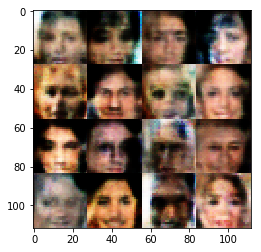

Epoch 1/10... Generator Loss: 2.2794 Discriminator Loss: 1.5328...
Epoch 1/10... Generator Loss: 2.0134 Discriminator Loss: 1.2680...
Epoch 1/10... Generator Loss: 0.9749 Discriminator Loss: 0.6038...
Epoch 1/10... Generator Loss: 0.3563 Discriminator Loss: 1.5277...
Epoch 1/10... Generator Loss: 1.1188 Discriminator Loss: 0.5963...
Epoch 1/10... Generator Loss: 1.3915 Discriminator Loss: 1.4468...
Epoch 1/10... Generator Loss: 1.8173 Discriminator Loss: 0.4962...
Epoch 1/10... Generator Loss: 0.6823 Discriminator Loss: 1.2430...
Epoch 1/10... Generator Loss: 1.1587 Discriminator Loss: 0.9347...
Epoch 1/10... Generator Loss: 1.0110 Discriminator Loss: 0.6402...


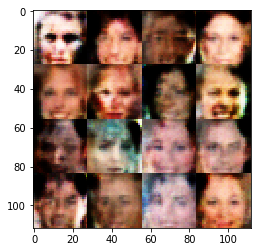

Epoch 1/10... Generator Loss: 0.5463 Discriminator Loss: 1.0615...
Epoch 1/10... Generator Loss: 1.0709 Discriminator Loss: 1.0409...
Epoch 1/10... Generator Loss: 0.4564 Discriminator Loss: 1.2368...
Epoch 1/10... Generator Loss: 2.2836 Discriminator Loss: 1.7876...
Epoch 1/10... Generator Loss: 1.7864 Discriminator Loss: 0.5877...
Epoch 1/10... Generator Loss: 1.3650 Discriminator Loss: 1.1881...
Epoch 1/10... Generator Loss: 1.6902 Discriminator Loss: 0.4043...
Epoch 1/10... Generator Loss: 0.7952 Discriminator Loss: 1.1726...
Epoch 1/10... Generator Loss: 1.5679 Discriminator Loss: 0.8214...
Epoch 1/10... Generator Loss: 1.7489 Discriminator Loss: 0.6709...


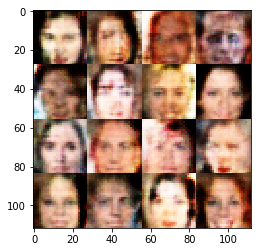

Epoch 1/10... Generator Loss: 0.7237 Discriminator Loss: 0.9701...
Epoch 1/10... Generator Loss: 0.5960 Discriminator Loss: 1.1801...
Epoch 1/10... Generator Loss: 2.2145 Discriminator Loss: 1.2281...
Epoch 1/10... Generator Loss: 0.3758 Discriminator Loss: 1.3940...
Epoch 1/10... Generator Loss: 0.2830 Discriminator Loss: 1.5977...
Epoch 1/10... Generator Loss: 3.9397 Discriminator Loss: 1.3197...
Epoch 1/10... Generator Loss: 0.6524 Discriminator Loss: 0.9266...
Epoch 1/10... Generator Loss: 0.7041 Discriminator Loss: 1.2736...
Epoch 1/10... Generator Loss: 0.7531 Discriminator Loss: 0.9558...
Epoch 1/10... Generator Loss: 2.1887 Discriminator Loss: 0.9350...


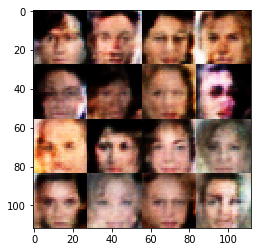

Epoch 1/10... Generator Loss: 2.3170 Discriminator Loss: 0.6769...
Epoch 1/10... Generator Loss: 0.4069 Discriminator Loss: 1.2785...
Epoch 1/10... Generator Loss: 0.4474 Discriminator Loss: 1.1685...
Epoch 1/10... Generator Loss: 0.4166 Discriminator Loss: 1.2656...
Epoch 1/10... Generator Loss: 3.3465 Discriminator Loss: 1.8472...
Epoch 1/10... Generator Loss: 0.9265 Discriminator Loss: 0.6849...
Epoch 1/10... Generator Loss: 0.6940 Discriminator Loss: 0.8858...
Epoch 1/10... Generator Loss: 3.7776 Discriminator Loss: 1.3230...
Epoch 1/10... Generator Loss: 0.9313 Discriminator Loss: 0.7680...
Epoch 1/10... Generator Loss: 1.3932 Discriminator Loss: 1.2630...


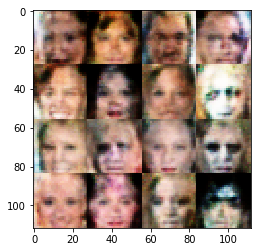

Epoch 1/10... Generator Loss: 2.3314 Discriminator Loss: 0.4740...
Epoch 1/10... Generator Loss: 1.0512 Discriminator Loss: 0.6005...
Epoch 1/10... Generator Loss: 0.4818 Discriminator Loss: 1.5665...
Epoch 1/10... Generator Loss: 1.1365 Discriminator Loss: 0.5680...
Epoch 1/10... Generator Loss: 1.0310 Discriminator Loss: 0.7963...
Epoch 1/10... Generator Loss: 1.9464 Discriminator Loss: 0.3861...
Epoch 1/10... Generator Loss: 1.3774 Discriminator Loss: 1.1436...
Epoch 1/10... Generator Loss: 1.1992 Discriminator Loss: 0.5471...
Epoch 1/10... Generator Loss: 0.3695 Discriminator Loss: 1.3658...
Epoch 1/10... Generator Loss: 0.3858 Discriminator Loss: 1.4048...


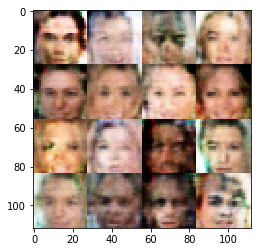

Epoch 1/10... Generator Loss: 1.6037 Discriminator Loss: 0.7935...
Epoch 1/10... Generator Loss: 0.6327 Discriminator Loss: 1.4261...
Epoch 1/10... Generator Loss: 0.7071 Discriminator Loss: 1.3566...
Epoch 1/10... Generator Loss: 1.8793 Discriminator Loss: 1.2576...
Epoch 1/10... Generator Loss: 1.6126 Discriminator Loss: 1.3657...
Epoch 1/10... Generator Loss: 0.8128 Discriminator Loss: 0.7788...
Epoch 1/10... Generator Loss: 0.3021 Discriminator Loss: 1.5362...
Epoch 1/10... Generator Loss: 1.5444 Discriminator Loss: 0.4208...
Epoch 1/10... Generator Loss: 1.0151 Discriminator Loss: 0.6507...
Epoch 1/10... Generator Loss: 1.2635 Discriminator Loss: 1.2029...


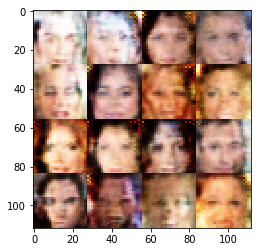

Epoch 1/10... Generator Loss: 0.5736 Discriminator Loss: 0.9847...
Epoch 1/10... Generator Loss: 0.8268 Discriminator Loss: 1.3245...
Epoch 1/10... Generator Loss: 0.5734 Discriminator Loss: 1.1238...
Epoch 1/10... Generator Loss: 1.9744 Discriminator Loss: 0.3590...
Epoch 1/10... Generator Loss: 2.2099 Discriminator Loss: 1.5348...
Epoch 1/10... Generator Loss: 0.7131 Discriminator Loss: 0.8889...
Epoch 1/10... Generator Loss: 1.9479 Discriminator Loss: 0.9043...
Epoch 1/10... Generator Loss: 0.9241 Discriminator Loss: 0.7052...
Epoch 1/10... Generator Loss: 2.3902 Discriminator Loss: 1.2961...
Epoch 1/10... Generator Loss: 2.3308 Discriminator Loss: 2.5482...


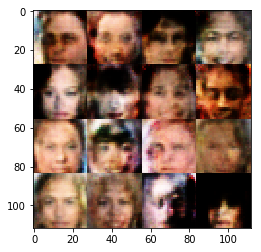

Epoch 1/10... Generator Loss: 1.5727 Discriminator Loss: 1.0975...
Epoch 1/10... Generator Loss: 2.4566 Discriminator Loss: 0.4639...
Epoch 1/10... Generator Loss: 1.4751 Discriminator Loss: 0.6888...
Epoch 1/10... Generator Loss: 2.5118 Discriminator Loss: 1.2315...
Epoch 1/10... Generator Loss: 2.2990 Discriminator Loss: 0.8874...
Epoch 1/10... Generator Loss: 2.3238 Discriminator Loss: 0.5356...
Epoch 1/10... Generator Loss: 1.4583 Discriminator Loss: 0.5709...
Epoch 1/10... Generator Loss: 2.6150 Discriminator Loss: 0.7240...
Epoch 1/10... Generator Loss: 1.6610 Discriminator Loss: 0.3772...
Epoch 1/10... Generator Loss: 2.1003 Discriminator Loss: 0.3839...


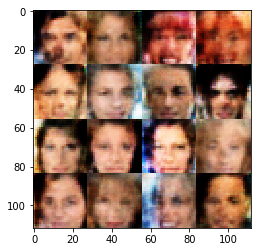

Epoch 1/10... Generator Loss: 2.9450 Discriminator Loss: 0.3665...
Epoch 1/10... Generator Loss: 0.3004 Discriminator Loss: 1.4928...
Epoch 1/10... Generator Loss: 1.1547 Discriminator Loss: 1.1437...
Epoch 1/10... Generator Loss: 0.7215 Discriminator Loss: 0.9006...
Epoch 1/10... Generator Loss: 2.1642 Discriminator Loss: 1.3598...
Epoch 1/10... Generator Loss: 0.9504 Discriminator Loss: 0.6446...
Epoch 1/10... Generator Loss: 0.8712 Discriminator Loss: 0.6980...
Epoch 1/10... Generator Loss: 3.9544 Discriminator Loss: 0.4689...
Epoch 1/10... Generator Loss: 0.7455 Discriminator Loss: 0.7687...
Epoch 1/10... Generator Loss: 0.8111 Discriminator Loss: 0.7228...


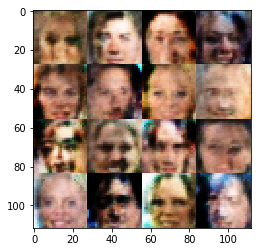

Epoch 1/10... Generator Loss: 3.2139 Discriminator Loss: 1.1735...
Epoch 1/10... Generator Loss: 0.9372 Discriminator Loss: 0.9804...
Epoch 1/10... Generator Loss: 0.7166 Discriminator Loss: 0.9459...
Epoch 1/10... Generator Loss: 1.3386 Discriminator Loss: 1.2395...
Epoch 1/10... Generator Loss: 0.6370 Discriminator Loss: 1.4898...
Epoch 1/10... Generator Loss: 0.6648 Discriminator Loss: 1.2974...
Epoch 1/10... Generator Loss: 1.2163 Discriminator Loss: 0.4692...
Epoch 1/10... Generator Loss: 1.3118 Discriminator Loss: 0.9823...
Epoch 1/10... Generator Loss: 2.5212 Discriminator Loss: 0.6449...
Epoch 1/10... Generator Loss: 2.0393 Discriminator Loss: 1.0169...


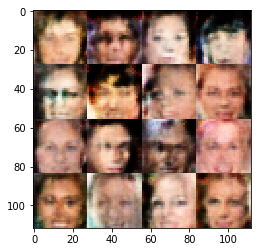

Epoch 1/10... Generator Loss: 1.6797 Discriminator Loss: 0.4252...
Epoch 1/10... Generator Loss: 0.5527 Discriminator Loss: 1.4477...
Epoch 1/10... Generator Loss: 2.2548 Discriminator Loss: 0.6330...
Epoch 1/10... Generator Loss: 1.6714 Discriminator Loss: 0.5228...
Epoch 1/10... Generator Loss: 0.8603 Discriminator Loss: 0.8030...
Epoch 1/10... Generator Loss: 0.3391 Discriminator Loss: 1.4413...
Epoch 1/10... Generator Loss: 0.8106 Discriminator Loss: 1.2525...
Epoch 1/10... Generator Loss: 2.9418 Discriminator Loss: 0.2329...
Epoch 1/10... Generator Loss: 3.4182 Discriminator Loss: 0.2355...
Epoch 1/10... Generator Loss: 2.4165 Discriminator Loss: 0.9414...


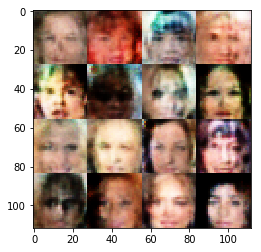

Epoch 1/10... Generator Loss: 0.8828 Discriminator Loss: 0.8827...
Epoch 1/10... Generator Loss: 1.5216 Discriminator Loss: 1.4070...
Epoch 1/10... Generator Loss: 0.5765 Discriminator Loss: 1.0711...
Epoch 1/10... Generator Loss: 0.8116 Discriminator Loss: 1.3697...
Epoch 1/10... Generator Loss: 2.6981 Discriminator Loss: 0.3180...
Epoch 1/10... Generator Loss: 0.4584 Discriminator Loss: 1.1820...
Epoch 1/10... Generator Loss: 2.4278 Discriminator Loss: 0.4058...
Epoch 1/10... Generator Loss: 2.4686 Discriminator Loss: 0.2759...
Epoch 1/10... Generator Loss: 1.5363 Discriminator Loss: 1.3383...
Epoch 1/10... Generator Loss: 1.9724 Discriminator Loss: 0.6718...


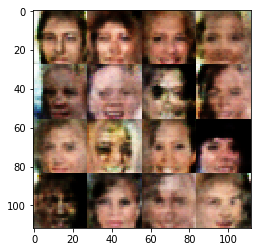

Epoch 1/10... Generator Loss: 0.5734 Discriminator Loss: 1.0185...
Epoch 1/10... Generator Loss: 2.7879 Discriminator Loss: 0.3780...
Epoch 1/10... Generator Loss: 1.1832 Discriminator Loss: 0.5841...
Epoch 1/10... Generator Loss: 2.3750 Discriminator Loss: 0.4366...
Epoch 1/10... Generator Loss: 1.0483 Discriminator Loss: 0.6118...
Epoch 1/10... Generator Loss: 0.7753 Discriminator Loss: 1.2304...
Epoch 1/10... Generator Loss: 2.9492 Discriminator Loss: 0.3360...
Epoch 1/10... Generator Loss: 0.2210 Discriminator Loss: 1.7577...
Epoch 1/10... Generator Loss: 1.4718 Discriminator Loss: 0.3741...
Epoch 1/10... Generator Loss: 0.8005 Discriminator Loss: 1.0411...


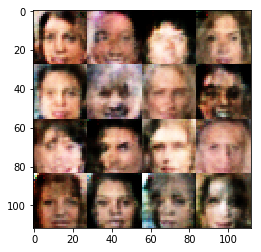

Epoch 1/10... Generator Loss: 0.4785 Discriminator Loss: 1.2571...
Epoch 1/10... Generator Loss: 0.3997 Discriminator Loss: 1.3761...
Epoch 1/10... Generator Loss: 0.4624 Discriminator Loss: 1.2830...
Epoch 1/10... Generator Loss: 0.7052 Discriminator Loss: 0.9040...
Epoch 1/10... Generator Loss: 0.4308 Discriminator Loss: 1.3882...
Epoch 1/10... Generator Loss: 0.3712 Discriminator Loss: 1.3251...
Epoch 1/10... Generator Loss: 0.2118 Discriminator Loss: 1.8352...
Epoch 1/10... Generator Loss: 0.7750 Discriminator Loss: 1.1044...
Epoch 1/10... Generator Loss: 0.8845 Discriminator Loss: 0.9577...
Epoch 1/10... Generator Loss: 2.8320 Discriminator Loss: 0.2943...


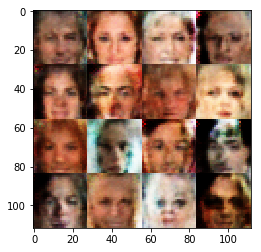

Epoch 1/10... Generator Loss: 0.6047 Discriminator Loss: 1.1068...
Epoch 1/10... Generator Loss: 1.4231 Discriminator Loss: 0.9444...
Epoch 1/10... Generator Loss: 1.0054 Discriminator Loss: 0.7566...
Epoch 1/10... Generator Loss: 0.6525 Discriminator Loss: 0.8849...
Epoch 1/10... Generator Loss: 0.3614 Discriminator Loss: 1.4859...
Epoch 1/10... Generator Loss: 0.8185 Discriminator Loss: 0.9842...
Epoch 1/10... Generator Loss: 1.0758 Discriminator Loss: 0.7321...
Epoch 1/10... Generator Loss: 0.7129 Discriminator Loss: 1.2028...
Epoch 1/10... Generator Loss: 1.0060 Discriminator Loss: 0.6554...
Epoch 1/10... Generator Loss: 1.9263 Discriminator Loss: 0.5755...


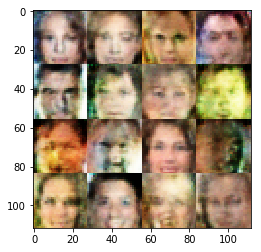

Epoch 1/10... Generator Loss: 0.4377 Discriminator Loss: 1.2194...
Epoch 1/10... Generator Loss: 2.9098 Discriminator Loss: 0.2402...
Epoch 1/10... Generator Loss: 2.4979 Discriminator Loss: 0.2211...
Epoch 1/10... Generator Loss: 2.9260 Discriminator Loss: 1.1363...
Epoch 1/10... Generator Loss: 2.6159 Discriminator Loss: 0.3532...
Epoch 1/10... Generator Loss: 0.4898 Discriminator Loss: 1.1794...
Epoch 1/10... Generator Loss: 2.5755 Discriminator Loss: 0.7624...
Epoch 1/10... Generator Loss: 1.4114 Discriminator Loss: 0.4505...
Epoch 1/10... Generator Loss: 0.9973 Discriminator Loss: 0.7039...
Epoch 1/10... Generator Loss: 3.5198 Discriminator Loss: 2.8785...


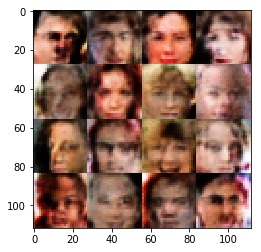

Epoch 1/10... Generator Loss: 2.8033 Discriminator Loss: 1.2507...
Epoch 1/10... Generator Loss: 1.7652 Discriminator Loss: 0.4481...
Epoch 1/10... Generator Loss: 0.4458 Discriminator Loss: 1.2230...
Epoch 1/10... Generator Loss: 1.5220 Discriminator Loss: 0.6594...
Epoch 1/10... Generator Loss: 0.6204 Discriminator Loss: 0.9575...
Epoch 1/10... Generator Loss: 0.5959 Discriminator Loss: 1.0302...
Epoch 1/10... Generator Loss: 1.7890 Discriminator Loss: 1.1348...
Epoch 1/10... Generator Loss: 1.6629 Discriminator Loss: 1.8091...
Epoch 1/10... Generator Loss: 0.9696 Discriminator Loss: 0.6630...
Epoch 1/10... Generator Loss: 2.1153 Discriminator Loss: 0.5964...


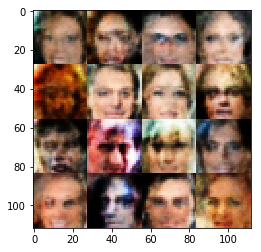

Epoch 1/10... Generator Loss: 2.3948 Discriminator Loss: 0.2270...
Epoch 1/10... Generator Loss: 1.5153 Discriminator Loss: 0.7589...
Epoch 1/10... Generator Loss: 0.6987 Discriminator Loss: 1.2105...
Epoch 1/10... Generator Loss: 0.7400 Discriminator Loss: 1.1064...
Epoch 1/10... Generator Loss: 2.0246 Discriminator Loss: 1.2402...
Epoch 1/10... Generator Loss: 2.5880 Discriminator Loss: 2.1809...
Epoch 1/10... Generator Loss: 1.0841 Discriminator Loss: 0.5988...
Epoch 1/10... Generator Loss: 1.2389 Discriminator Loss: 1.1862...
Epoch 1/10... Generator Loss: 0.2996 Discriminator Loss: 1.5092...
Epoch 1/10... Generator Loss: 0.3955 Discriminator Loss: 1.3471...


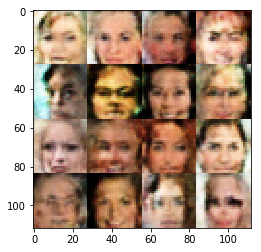

Epoch 1/10... Generator Loss: 1.6247 Discriminator Loss: 0.5538...
Epoch 1/10... Generator Loss: 4.2405 Discriminator Loss: 0.6054...
Epoch 1/10... Generator Loss: 0.6615 Discriminator Loss: 0.8643...
Epoch 1/10... Generator Loss: 2.3324 Discriminator Loss: 0.6775...
Epoch 1/10... Generator Loss: 2.0909 Discriminator Loss: 0.9797...
Epoch 1/10... Generator Loss: 2.7347 Discriminator Loss: 0.8655...
Epoch 1/10... Generator Loss: 3.1566 Discriminator Loss: 0.9503...
Epoch 1/10... Generator Loss: 1.9639 Discriminator Loss: 0.3015...
Epoch 1/10... Generator Loss: 1.8408 Discriminator Loss: 1.5390...
Epoch 1/10... Generator Loss: 2.0995 Discriminator Loss: 0.6998...


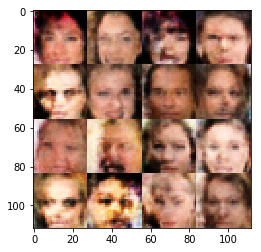

Epoch 1/10... Generator Loss: 0.5639 Discriminator Loss: 0.9636...
Epoch 1/10... Generator Loss: 2.7268 Discriminator Loss: 0.6149...
Epoch 1/10... Generator Loss: 2.2381 Discriminator Loss: 1.0854...
Epoch 1/10... Generator Loss: 1.8733 Discriminator Loss: 1.4024...
Epoch 1/10... Generator Loss: 1.4929 Discriminator Loss: 0.5651...
Epoch 1/10... Generator Loss: 0.9725 Discriminator Loss: 0.8160...
Epoch 1/10... Generator Loss: 1.8151 Discriminator Loss: 1.5128...
Epoch 1/10... Generator Loss: 0.9605 Discriminator Loss: 0.8161...
Epoch 1/10... Generator Loss: 1.4224 Discriminator Loss: 0.7642...
Epoch 1/10... Generator Loss: 2.9636 Discriminator Loss: 0.6044...


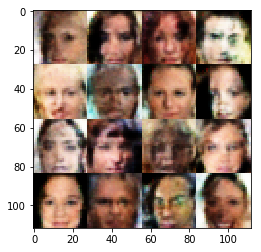

Epoch 1/10... Generator Loss: 0.3536 Discriminator Loss: 1.4645...
Epoch 1/10... Generator Loss: 0.6119 Discriminator Loss: 1.0912...
Epoch 1/10... Generator Loss: 0.8234 Discriminator Loss: 0.7931...
Epoch 1/10... Generator Loss: 2.4572 Discriminator Loss: 0.2421...
Epoch 1/10... Generator Loss: 0.4064 Discriminator Loss: 1.3779...
Epoch 1/10... Generator Loss: 1.8764 Discriminator Loss: 0.3389...
Epoch 1/10... Generator Loss: 2.0703 Discriminator Loss: 1.4932...
Epoch 1/10... Generator Loss: 2.8108 Discriminator Loss: 0.4732...
Epoch 1/10... Generator Loss: 1.0302 Discriminator Loss: 1.3125...
Epoch 1/10... Generator Loss: 1.1091 Discriminator Loss: 1.0775...


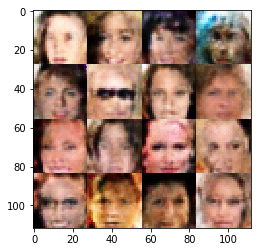

Epoch 1/10... Generator Loss: 1.9599 Discriminator Loss: 1.0263...
Epoch 1/10... Generator Loss: 0.4459 Discriminator Loss: 1.2661...
Epoch 1/10... Generator Loss: 2.2573 Discriminator Loss: 0.4924...
Epoch 1/10... Generator Loss: 1.2589 Discriminator Loss: 0.9784...
Epoch 1/10... Generator Loss: 0.8017 Discriminator Loss: 1.0046...
Epoch 1/10... Generator Loss: 0.1702 Discriminator Loss: 2.0244...
Epoch 2/10... Generator Loss: 0.8025 Discriminator Loss: 0.8135...
Epoch 2/10... Generator Loss: 0.8834 Discriminator Loss: 0.8167...
Epoch 2/10... Generator Loss: 0.4173 Discriminator Loss: 1.4651...
Epoch 2/10... Generator Loss: 0.1840 Discriminator Loss: 1.9723...


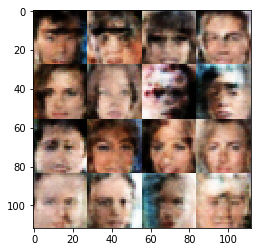

Epoch 2/10... Generator Loss: 1.8593 Discriminator Loss: 0.4458...
Epoch 2/10... Generator Loss: 1.5348 Discriminator Loss: 1.5712...
Epoch 2/10... Generator Loss: 1.2435 Discriminator Loss: 0.5051...
Epoch 2/10... Generator Loss: 0.7234 Discriminator Loss: 0.8068...
Epoch 2/10... Generator Loss: 1.4804 Discriminator Loss: 0.5491...
Epoch 2/10... Generator Loss: 2.7238 Discriminator Loss: 1.1091...
Epoch 2/10... Generator Loss: 0.3415 Discriminator Loss: 1.4616...
Epoch 2/10... Generator Loss: 0.5464 Discriminator Loss: 1.1781...
Epoch 2/10... Generator Loss: 2.3928 Discriminator Loss: 0.2844...
Epoch 2/10... Generator Loss: 0.4476 Discriminator Loss: 1.5940...


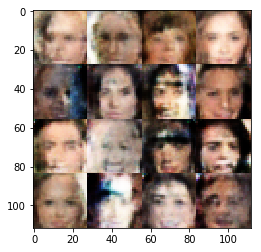

Epoch 2/10... Generator Loss: 0.9888 Discriminator Loss: 0.6269...
Epoch 2/10... Generator Loss: 0.5783 Discriminator Loss: 1.2034...
Epoch 2/10... Generator Loss: 0.8974 Discriminator Loss: 1.0033...
Epoch 2/10... Generator Loss: 0.6081 Discriminator Loss: 0.9659...
Epoch 2/10... Generator Loss: 1.7201 Discriminator Loss: 1.2385...
Epoch 2/10... Generator Loss: 1.1585 Discriminator Loss: 0.9618...
Epoch 2/10... Generator Loss: 0.9101 Discriminator Loss: 0.9953...
Epoch 2/10... Generator Loss: 0.6299 Discriminator Loss: 0.9358...
Epoch 2/10... Generator Loss: 0.2070 Discriminator Loss: 1.8536...
Epoch 2/10... Generator Loss: 0.8012 Discriminator Loss: 0.8459...


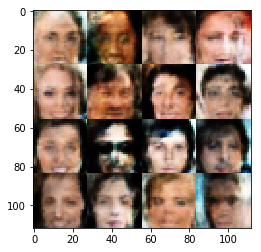

Epoch 2/10... Generator Loss: 0.2988 Discriminator Loss: 1.5561...
Epoch 2/10... Generator Loss: 0.2371 Discriminator Loss: 1.7320...
Epoch 2/10... Generator Loss: 0.7499 Discriminator Loss: 0.9825...
Epoch 2/10... Generator Loss: 0.8133 Discriminator Loss: 0.8454...
Epoch 2/10... Generator Loss: 0.4182 Discriminator Loss: 1.3762...
Epoch 2/10... Generator Loss: 0.3554 Discriminator Loss: 1.3840...
Epoch 2/10... Generator Loss: 0.4829 Discriminator Loss: 1.1661...
Epoch 2/10... Generator Loss: 0.8055 Discriminator Loss: 0.8470...
Epoch 2/10... Generator Loss: 1.8202 Discriminator Loss: 1.4486...
Epoch 2/10... Generator Loss: 1.9994 Discriminator Loss: 0.7009...


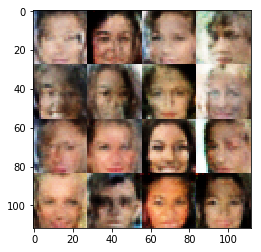

Epoch 2/10... Generator Loss: 0.9355 Discriminator Loss: 0.7088...
Epoch 2/10... Generator Loss: 2.4219 Discriminator Loss: 0.1859...
Epoch 2/10... Generator Loss: 1.0548 Discriminator Loss: 0.6297...
Epoch 2/10... Generator Loss: 0.6304 Discriminator Loss: 1.0335...
Epoch 2/10... Generator Loss: 0.9465 Discriminator Loss: 0.9574...
Epoch 2/10... Generator Loss: 2.7279 Discriminator Loss: 0.7506...
Epoch 2/10... Generator Loss: 2.5680 Discriminator Loss: 1.1845...
Epoch 2/10... Generator Loss: 1.0523 Discriminator Loss: 0.5752...
Epoch 2/10... Generator Loss: 1.2179 Discriminator Loss: 0.4723...
Epoch 2/10... Generator Loss: 0.7887 Discriminator Loss: 0.8897...


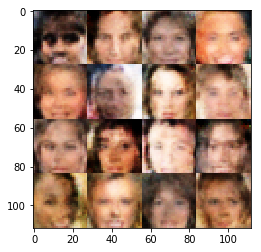

Epoch 2/10... Generator Loss: 1.2060 Discriminator Loss: 0.7493...
Epoch 2/10... Generator Loss: 0.3811 Discriminator Loss: 1.4259...
Epoch 2/10... Generator Loss: 0.7046 Discriminator Loss: 0.9036...
Epoch 2/10... Generator Loss: 0.5833 Discriminator Loss: 1.1653...
Epoch 2/10... Generator Loss: 0.7266 Discriminator Loss: 1.1658...
Epoch 2/10... Generator Loss: 2.3304 Discriminator Loss: 2.0121...
Epoch 2/10... Generator Loss: 0.3377 Discriminator Loss: 1.4733...
Epoch 2/10... Generator Loss: 0.8627 Discriminator Loss: 0.7432...
Epoch 2/10... Generator Loss: 2.2789 Discriminator Loss: 0.4124...
Epoch 2/10... Generator Loss: 1.0475 Discriminator Loss: 0.5890...


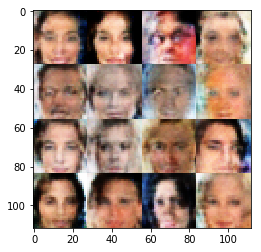

Epoch 2/10... Generator Loss: 2.0918 Discriminator Loss: 1.1508...
Epoch 2/10... Generator Loss: 2.0306 Discriminator Loss: 1.6759...
Epoch 2/10... Generator Loss: 1.2197 Discriminator Loss: 0.5162...
Epoch 2/10... Generator Loss: 0.7874 Discriminator Loss: 1.2018...
Epoch 2/10... Generator Loss: 0.6650 Discriminator Loss: 1.3158...
Epoch 2/10... Generator Loss: 1.4373 Discriminator Loss: 0.4964...
Epoch 2/10... Generator Loss: 0.3218 Discriminator Loss: 1.5772...
Epoch 2/10... Generator Loss: 1.1096 Discriminator Loss: 1.2918...
Epoch 2/10... Generator Loss: 1.8255 Discriminator Loss: 0.9940...
Epoch 2/10... Generator Loss: 3.0107 Discriminator Loss: 0.3917...


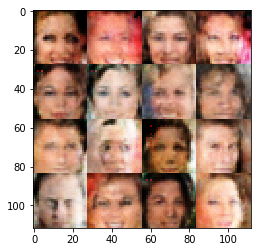

Epoch 2/10... Generator Loss: 0.7383 Discriminator Loss: 0.8453...
Epoch 2/10... Generator Loss: 1.1741 Discriminator Loss: 0.9908...
Epoch 2/10... Generator Loss: 2.3746 Discriminator Loss: 1.9171...
Epoch 2/10... Generator Loss: 2.0724 Discriminator Loss: 0.5118...
Epoch 2/10... Generator Loss: 1.3010 Discriminator Loss: 1.4263...
Epoch 2/10... Generator Loss: 3.3365 Discriminator Loss: 0.6358...
Epoch 2/10... Generator Loss: 0.4663 Discriminator Loss: 1.2722...
Epoch 2/10... Generator Loss: 2.1091 Discriminator Loss: 0.3906...
Epoch 2/10... Generator Loss: 1.6604 Discriminator Loss: 1.3139...
Epoch 2/10... Generator Loss: 0.4160 Discriminator Loss: 1.3842...


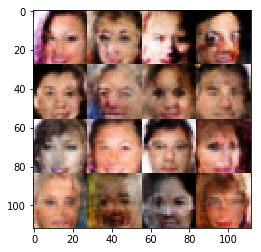

Epoch 2/10... Generator Loss: 0.2497 Discriminator Loss: 1.6650...
Epoch 2/10... Generator Loss: 0.9393 Discriminator Loss: 0.7331...
Epoch 2/10... Generator Loss: 1.5464 Discriminator Loss: 0.5522...
Epoch 2/10... Generator Loss: 1.9382 Discriminator Loss: 0.9946...
Epoch 2/10... Generator Loss: 2.0714 Discriminator Loss: 1.8998...
Epoch 2/10... Generator Loss: 0.8167 Discriminator Loss: 1.1679...
Epoch 2/10... Generator Loss: 2.6217 Discriminator Loss: 2.7175...
Epoch 2/10... Generator Loss: 3.9127 Discriminator Loss: 0.1807...
Epoch 2/10... Generator Loss: 2.5765 Discriminator Loss: 1.0138...
Epoch 2/10... Generator Loss: 1.3585 Discriminator Loss: 1.4164...


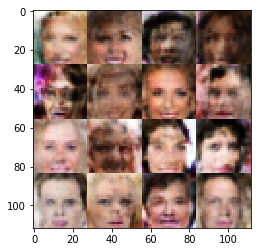

Epoch 2/10... Generator Loss: 0.3366 Discriminator Loss: 1.4093...
Epoch 2/10... Generator Loss: 3.0881 Discriminator Loss: 1.3453...
Epoch 2/10... Generator Loss: 0.2719 Discriminator Loss: 1.6209...
Epoch 2/10... Generator Loss: 1.7694 Discriminator Loss: 0.5185...
Epoch 2/10... Generator Loss: 0.3438 Discriminator Loss: 1.5116...
Epoch 2/10... Generator Loss: 1.4604 Discriminator Loss: 0.5878...
Epoch 2/10... Generator Loss: 1.4445 Discriminator Loss: 1.0061...
Epoch 2/10... Generator Loss: 2.8075 Discriminator Loss: 0.6377...
Epoch 2/10... Generator Loss: 1.0877 Discriminator Loss: 0.6626...
Epoch 2/10... Generator Loss: 1.4696 Discriminator Loss: 0.3766...


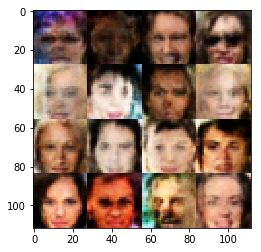

Epoch 2/10... Generator Loss: 0.4634 Discriminator Loss: 1.3331...
Epoch 2/10... Generator Loss: 3.7222 Discriminator Loss: 0.2926...
Epoch 2/10... Generator Loss: 0.9615 Discriminator Loss: 0.7100...
Epoch 2/10... Generator Loss: 0.7777 Discriminator Loss: 1.1497...
Epoch 2/10... Generator Loss: 1.5442 Discriminator Loss: 0.4274...
Epoch 2/10... Generator Loss: 0.3896 Discriminator Loss: 1.3448...
Epoch 2/10... Generator Loss: 0.4289 Discriminator Loss: 1.2563...
Epoch 2/10... Generator Loss: 0.3547 Discriminator Loss: 1.5559...
Epoch 2/10... Generator Loss: 3.4438 Discriminator Loss: 0.2019...
Epoch 2/10... Generator Loss: 0.7440 Discriminator Loss: 1.1025...


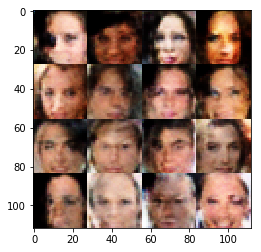

Epoch 2/10... Generator Loss: 1.1632 Discriminator Loss: 0.9325...
Epoch 2/10... Generator Loss: 0.4620 Discriminator Loss: 1.4008...
Epoch 2/10... Generator Loss: 0.9270 Discriminator Loss: 0.9646...
Epoch 2/10... Generator Loss: 1.6224 Discriminator Loss: 1.1844...
Epoch 2/10... Generator Loss: 0.7906 Discriminator Loss: 0.8562...
Epoch 2/10... Generator Loss: 1.3434 Discriminator Loss: 0.7359...
Epoch 2/10... Generator Loss: 0.4892 Discriminator Loss: 1.1752...
Epoch 2/10... Generator Loss: 1.3649 Discriminator Loss: 0.7459...
Epoch 2/10... Generator Loss: 0.7959 Discriminator Loss: 0.9448...
Epoch 2/10... Generator Loss: 2.9880 Discriminator Loss: 1.2823...


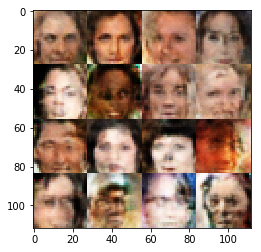

Epoch 2/10... Generator Loss: 1.1294 Discriminator Loss: 0.5888...
Epoch 2/10... Generator Loss: 0.5926 Discriminator Loss: 1.0891...
Epoch 2/10... Generator Loss: 0.4726 Discriminator Loss: 1.3991...
Epoch 2/10... Generator Loss: 1.0497 Discriminator Loss: 0.8959...
Epoch 2/10... Generator Loss: 1.7685 Discriminator Loss: 0.8089...
Epoch 2/10... Generator Loss: 1.1512 Discriminator Loss: 0.6268...
Epoch 2/10... Generator Loss: 0.9131 Discriminator Loss: 0.8013...
Epoch 2/10... Generator Loss: 1.6269 Discriminator Loss: 1.0188...
Epoch 2/10... Generator Loss: 2.1314 Discriminator Loss: 0.5455...
Epoch 2/10... Generator Loss: 2.9829 Discriminator Loss: 0.2794...


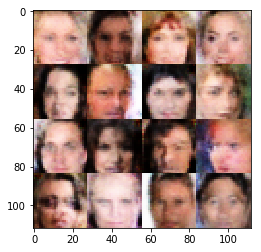

Epoch 2/10... Generator Loss: 1.7805 Discriminator Loss: 0.2934...
Epoch 2/10... Generator Loss: 1.1414 Discriminator Loss: 0.5101...
Epoch 2/10... Generator Loss: 1.7955 Discriminator Loss: 2.1332...
Epoch 2/10... Generator Loss: 1.3812 Discriminator Loss: 0.7002...
Epoch 2/10... Generator Loss: 2.5655 Discriminator Loss: 2.2856...
Epoch 2/10... Generator Loss: 0.9616 Discriminator Loss: 0.7100...
Epoch 2/10... Generator Loss: 0.8011 Discriminator Loss: 0.8772...
Epoch 2/10... Generator Loss: 2.2640 Discriminator Loss: 0.5278...
Epoch 2/10... Generator Loss: 1.0944 Discriminator Loss: 0.6515...
Epoch 2/10... Generator Loss: 2.2085 Discriminator Loss: 0.2490...


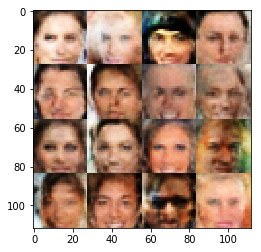

Epoch 2/10... Generator Loss: 1.5050 Discriminator Loss: 0.5117...
Epoch 2/10... Generator Loss: 0.5597 Discriminator Loss: 1.0066...
Epoch 2/10... Generator Loss: 0.6417 Discriminator Loss: 1.0017...
Epoch 2/10... Generator Loss: 0.5910 Discriminator Loss: 1.0727...
Epoch 2/10... Generator Loss: 2.4165 Discriminator Loss: 1.6467...
Epoch 2/10... Generator Loss: 1.9543 Discriminator Loss: 0.9300...
Epoch 2/10... Generator Loss: 1.7985 Discriminator Loss: 1.1243...
Epoch 2/10... Generator Loss: 0.9248 Discriminator Loss: 0.9617...
Epoch 2/10... Generator Loss: 0.5774 Discriminator Loss: 1.3732...
Epoch 2/10... Generator Loss: 1.8708 Discriminator Loss: 1.7507...


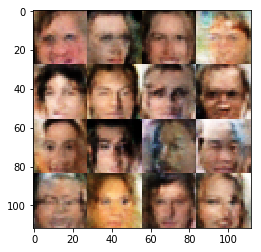

Epoch 2/10... Generator Loss: 2.2070 Discriminator Loss: 0.5268...
Epoch 2/10... Generator Loss: 0.4994 Discriminator Loss: 1.2256...
Epoch 2/10... Generator Loss: 1.3123 Discriminator Loss: 0.6720...
Epoch 2/10... Generator Loss: 2.0298 Discriminator Loss: 0.5064...
Epoch 2/10... Generator Loss: 0.2466 Discriminator Loss: 1.7529...
Epoch 2/10... Generator Loss: 1.1880 Discriminator Loss: 0.8247...
Epoch 2/10... Generator Loss: 1.6808 Discriminator Loss: 0.8540...
Epoch 2/10... Generator Loss: 3.2564 Discriminator Loss: 0.5513...
Epoch 2/10... Generator Loss: 1.7365 Discriminator Loss: 1.6897...
Epoch 2/10... Generator Loss: 1.1365 Discriminator Loss: 1.1656...


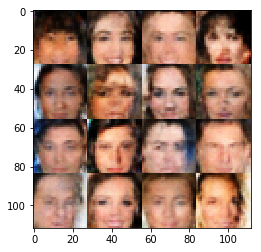

Epoch 2/10... Generator Loss: 1.2518 Discriminator Loss: 0.7820...
Epoch 2/10... Generator Loss: 1.0389 Discriminator Loss: 0.8256...
Epoch 2/10... Generator Loss: 1.7498 Discriminator Loss: 0.6645...
Epoch 2/10... Generator Loss: 0.5714 Discriminator Loss: 1.0012...
Epoch 2/10... Generator Loss: 0.6952 Discriminator Loss: 0.8960...
Epoch 2/10... Generator Loss: 1.4665 Discriminator Loss: 0.5059...
Epoch 2/10... Generator Loss: 1.6345 Discriminator Loss: 1.0138...
Epoch 2/10... Generator Loss: 0.9417 Discriminator Loss: 1.0216...
Epoch 2/10... Generator Loss: 0.3657 Discriminator Loss: 1.4380...
Epoch 2/10... Generator Loss: 1.6048 Discriminator Loss: 0.5741...


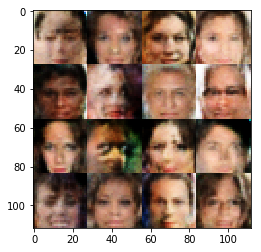

Epoch 2/10... Generator Loss: 2.1657 Discriminator Loss: 0.9875...
Epoch 2/10... Generator Loss: 0.7479 Discriminator Loss: 0.9906...
Epoch 2/10... Generator Loss: 1.9773 Discriminator Loss: 1.3769...
Epoch 2/10... Generator Loss: 0.4706 Discriminator Loss: 1.4721...
Epoch 2/10... Generator Loss: 1.2541 Discriminator Loss: 0.5542...
Epoch 2/10... Generator Loss: 0.9755 Discriminator Loss: 0.9223...
Epoch 2/10... Generator Loss: 2.1073 Discriminator Loss: 0.3449...
Epoch 2/10... Generator Loss: 2.9705 Discriminator Loss: 0.9314...
Epoch 2/10... Generator Loss: 0.3407 Discriminator Loss: 1.4549...
Epoch 2/10... Generator Loss: 1.6560 Discriminator Loss: 0.7042...


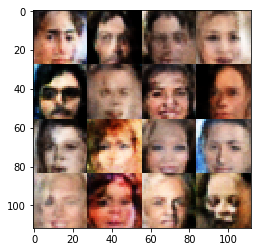

Epoch 2/10... Generator Loss: 0.7823 Discriminator Loss: 1.3315...
Epoch 2/10... Generator Loss: 1.6027 Discriminator Loss: 1.1411...
Epoch 2/10... Generator Loss: 2.3145 Discriminator Loss: 0.9512...
Epoch 2/10... Generator Loss: 0.5336 Discriminator Loss: 1.2245...
Epoch 2/10... Generator Loss: 0.5314 Discriminator Loss: 1.1878...
Epoch 2/10... Generator Loss: 1.3966 Discriminator Loss: 0.5188...
Epoch 2/10... Generator Loss: 0.9826 Discriminator Loss: 1.0259...
Epoch 2/10... Generator Loss: 2.2038 Discriminator Loss: 1.7607...
Epoch 2/10... Generator Loss: 1.6926 Discriminator Loss: 0.6513...
Epoch 2/10... Generator Loss: 1.3232 Discriminator Loss: 0.7601...


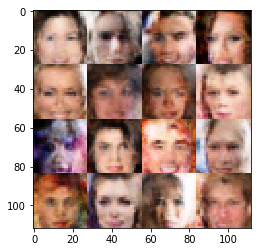

Epoch 2/10... Generator Loss: 1.0254 Discriminator Loss: 1.1895...
Epoch 2/10... Generator Loss: 0.6992 Discriminator Loss: 1.4372...
Epoch 2/10... Generator Loss: 1.5585 Discriminator Loss: 0.7432...
Epoch 2/10... Generator Loss: 0.7906 Discriminator Loss: 0.9349...
Epoch 2/10... Generator Loss: 2.2943 Discriminator Loss: 0.4236...
Epoch 2/10... Generator Loss: 1.6840 Discriminator Loss: 1.3924...
Epoch 2/10... Generator Loss: 0.8431 Discriminator Loss: 0.8531...
Epoch 2/10... Generator Loss: 0.4408 Discriminator Loss: 1.3848...
Epoch 2/10... Generator Loss: 1.8076 Discriminator Loss: 0.4655...
Epoch 2/10... Generator Loss: 3.2078 Discriminator Loss: 0.4215...


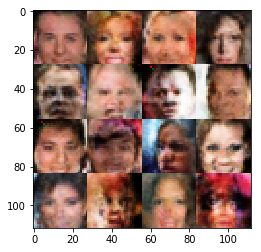

Epoch 2/10... Generator Loss: 0.1113 Discriminator Loss: 2.4063...
Epoch 2/10... Generator Loss: 0.6340 Discriminator Loss: 1.2753...
Epoch 2/10... Generator Loss: 0.6314 Discriminator Loss: 1.2898...
Epoch 2/10... Generator Loss: 1.7507 Discriminator Loss: 0.9758...
Epoch 2/10... Generator Loss: 0.6173 Discriminator Loss: 1.1179...
Epoch 2/10... Generator Loss: 1.9681 Discriminator Loss: 1.4105...
Epoch 2/10... Generator Loss: 1.1717 Discriminator Loss: 0.7909...
Epoch 2/10... Generator Loss: 1.8698 Discriminator Loss: 1.6160...
Epoch 2/10... Generator Loss: 2.7145 Discriminator Loss: 0.7420...
Epoch 2/10... Generator Loss: 2.1233 Discriminator Loss: 0.3976...


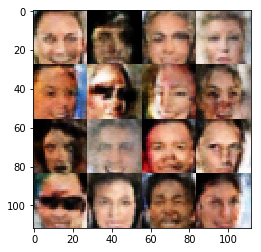

Epoch 2/10... Generator Loss: 1.0665 Discriminator Loss: 1.3396...
Epoch 2/10... Generator Loss: 0.9819 Discriminator Loss: 0.7772...
Epoch 2/10... Generator Loss: 2.0858 Discriminator Loss: 0.3900...
Epoch 2/10... Generator Loss: 3.0274 Discriminator Loss: 0.6351...
Epoch 2/10... Generator Loss: 1.7022 Discriminator Loss: 1.5378...
Epoch 2/10... Generator Loss: 0.8223 Discriminator Loss: 1.2914...
Epoch 2/10... Generator Loss: 0.5549 Discriminator Loss: 1.0891...
Epoch 2/10... Generator Loss: 1.6665 Discriminator Loss: 0.9022...
Epoch 2/10... Generator Loss: 1.3711 Discriminator Loss: 1.4198...
Epoch 2/10... Generator Loss: 2.2679 Discriminator Loss: 1.9873...


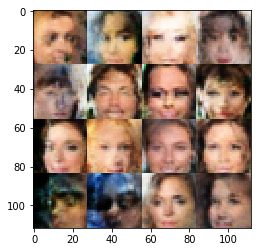

Epoch 2/10... Generator Loss: 2.5393 Discriminator Loss: 0.2990...
Epoch 2/10... Generator Loss: 0.3470 Discriminator Loss: 1.4447...
Epoch 2/10... Generator Loss: 0.4988 Discriminator Loss: 1.2508...
Epoch 2/10... Generator Loss: 1.2521 Discriminator Loss: 1.1250...
Epoch 2/10... Generator Loss: 0.3729 Discriminator Loss: 1.3434...
Epoch 2/10... Generator Loss: 0.8025 Discriminator Loss: 0.9584...
Epoch 2/10... Generator Loss: 0.4305 Discriminator Loss: 1.2494...
Epoch 2/10... Generator Loss: 2.7195 Discriminator Loss: 0.7925...
Epoch 2/10... Generator Loss: 1.9614 Discriminator Loss: 0.7162...
Epoch 2/10... Generator Loss: 1.0848 Discriminator Loss: 0.7717...


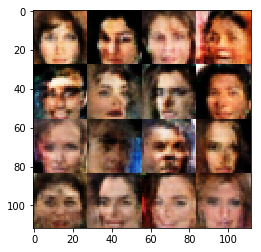

Epoch 2/10... Generator Loss: 1.6020 Discriminator Loss: 0.6184...
Epoch 2/10... Generator Loss: 0.9960 Discriminator Loss: 1.3831...
Epoch 2/10... Generator Loss: 1.6808 Discriminator Loss: 1.0606...
Epoch 2/10... Generator Loss: 1.2890 Discriminator Loss: 1.0358...
Epoch 2/10... Generator Loss: 0.2116 Discriminator Loss: 1.8367...
Epoch 2/10... Generator Loss: 1.2031 Discriminator Loss: 0.7581...
Epoch 2/10... Generator Loss: 1.3076 Discriminator Loss: 1.4473...
Epoch 2/10... Generator Loss: 1.1694 Discriminator Loss: 0.8154...
Epoch 2/10... Generator Loss: 0.6958 Discriminator Loss: 0.8818...
Epoch 2/10... Generator Loss: 1.0678 Discriminator Loss: 0.8808...


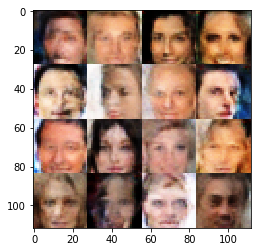

Epoch 2/10... Generator Loss: 2.5820 Discriminator Loss: 1.0897...
Epoch 2/10... Generator Loss: 1.0340 Discriminator Loss: 0.9111...
Epoch 2/10... Generator Loss: 0.1914 Discriminator Loss: 1.9478...
Epoch 2/10... Generator Loss: 0.9999 Discriminator Loss: 0.9787...
Epoch 2/10... Generator Loss: 1.4007 Discriminator Loss: 0.7717...
Epoch 2/10... Generator Loss: 0.6102 Discriminator Loss: 0.9488...
Epoch 2/10... Generator Loss: 0.4210 Discriminator Loss: 1.3095...
Epoch 2/10... Generator Loss: 1.3509 Discriminator Loss: 0.4939...
Epoch 2/10... Generator Loss: 0.5401 Discriminator Loss: 1.1781...
Epoch 2/10... Generator Loss: 0.6379 Discriminator Loss: 1.2401...


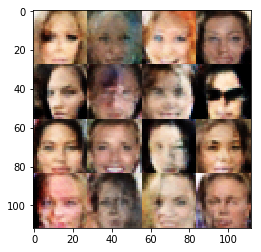

Epoch 2/10... Generator Loss: 1.9144 Discriminator Loss: 0.4997...
Epoch 2/10... Generator Loss: 1.9362 Discriminator Loss: 0.3171...
Epoch 2/10... Generator Loss: 0.6016 Discriminator Loss: 1.0694...
Epoch 2/10... Generator Loss: 0.3967 Discriminator Loss: 1.3107...
Epoch 2/10... Generator Loss: 1.1538 Discriminator Loss: 0.7050...
Epoch 2/10... Generator Loss: 0.6844 Discriminator Loss: 0.8833...
Epoch 2/10... Generator Loss: 1.1699 Discriminator Loss: 0.5454...
Epoch 2/10... Generator Loss: 0.2235 Discriminator Loss: 1.8176...
Epoch 2/10... Generator Loss: 0.4309 Discriminator Loss: 1.3517...
Epoch 2/10... Generator Loss: 3.0496 Discriminator Loss: 0.4385...


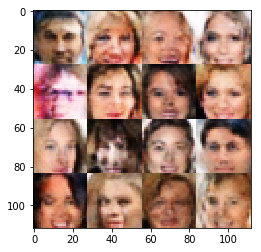

Epoch 2/10... Generator Loss: 1.9743 Discriminator Loss: 1.6078...
Epoch 2/10... Generator Loss: 1.4351 Discriminator Loss: 0.5945...
Epoch 2/10... Generator Loss: 0.8665 Discriminator Loss: 1.0723...
Epoch 2/10... Generator Loss: 0.6767 Discriminator Loss: 1.0653...
Epoch 2/10... Generator Loss: 0.6016 Discriminator Loss: 1.0960...
Epoch 2/10... Generator Loss: 0.2761 Discriminator Loss: 1.5904...
Epoch 2/10... Generator Loss: 0.5332 Discriminator Loss: 1.5074...
Epoch 2/10... Generator Loss: 2.3049 Discriminator Loss: 1.0002...
Epoch 2/10... Generator Loss: 1.4496 Discriminator Loss: 1.0330...
Epoch 2/10... Generator Loss: 1.2729 Discriminator Loss: 1.3178...


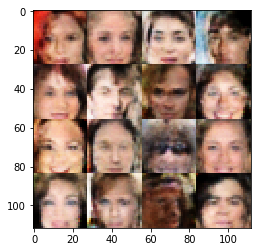

Epoch 2/10... Generator Loss: 0.8112 Discriminator Loss: 0.8124...
Epoch 2/10... Generator Loss: 0.2715 Discriminator Loss: 1.6631...
Epoch 2/10... Generator Loss: 1.0996 Discriminator Loss: 0.8095...
Epoch 2/10... Generator Loss: 0.3145 Discriminator Loss: 1.4989...
Epoch 2/10... Generator Loss: 1.0672 Discriminator Loss: 0.7262...
Epoch 2/10... Generator Loss: 1.0329 Discriminator Loss: 1.0138...
Epoch 2/10... Generator Loss: 0.4081 Discriminator Loss: 1.2936...
Epoch 2/10... Generator Loss: 0.8983 Discriminator Loss: 1.5154...
Epoch 2/10... Generator Loss: 0.3294 Discriminator Loss: 1.6501...
Epoch 2/10... Generator Loss: 1.2645 Discriminator Loss: 1.4670...


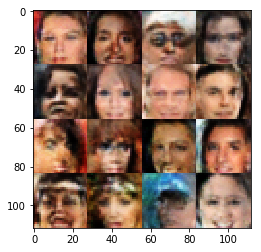

Epoch 2/10... Generator Loss: 0.8103 Discriminator Loss: 0.9189...
Epoch 2/10... Generator Loss: 0.7555 Discriminator Loss: 0.8754...
Epoch 2/10... Generator Loss: 0.8366 Discriminator Loss: 0.9223...
Epoch 2/10... Generator Loss: 0.6061 Discriminator Loss: 1.2098...
Epoch 2/10... Generator Loss: 1.1036 Discriminator Loss: 1.0220...
Epoch 2/10... Generator Loss: 0.4221 Discriminator Loss: 1.3506...
Epoch 2/10... Generator Loss: 0.5958 Discriminator Loss: 1.1107...
Epoch 2/10... Generator Loss: 0.4056 Discriminator Loss: 1.5071...
Epoch 2/10... Generator Loss: 2.5283 Discriminator Loss: 0.7327...
Epoch 2/10... Generator Loss: 0.3586 Discriminator Loss: 1.5160...


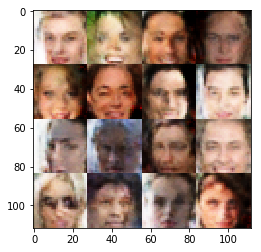

Epoch 2/10... Generator Loss: 0.6441 Discriminator Loss: 1.0331...
Epoch 2/10... Generator Loss: 0.6786 Discriminator Loss: 1.0666...
Epoch 2/10... Generator Loss: 0.7863 Discriminator Loss: 0.9171...
Epoch 2/10... Generator Loss: 1.9388 Discriminator Loss: 0.6486...
Epoch 2/10... Generator Loss: 1.7803 Discriminator Loss: 0.9851...
Epoch 2/10... Generator Loss: 1.6148 Discriminator Loss: 1.9875...
Epoch 2/10... Generator Loss: 0.8272 Discriminator Loss: 0.8776...
Epoch 2/10... Generator Loss: 0.2291 Discriminator Loss: 1.7603...
Epoch 2/10... Generator Loss: 1.0427 Discriminator Loss: 0.6677...
Epoch 2/10... Generator Loss: 0.7413 Discriminator Loss: 0.9720...


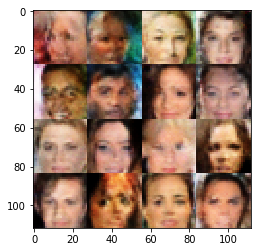

Epoch 2/10... Generator Loss: 0.3330 Discriminator Loss: 1.4867...
Epoch 2/10... Generator Loss: 2.3311 Discriminator Loss: 0.2670...
Epoch 2/10... Generator Loss: 0.7577 Discriminator Loss: 1.0459...
Epoch 2/10... Generator Loss: 0.5916 Discriminator Loss: 1.0116...
Epoch 2/10... Generator Loss: 0.3900 Discriminator Loss: 1.3940...
Epoch 2/10... Generator Loss: 0.2444 Discriminator Loss: 1.7714...
Epoch 2/10... Generator Loss: 0.3544 Discriminator Loss: 1.4693...
Epoch 2/10... Generator Loss: 0.9454 Discriminator Loss: 0.7290...
Epoch 2/10... Generator Loss: 0.7629 Discriminator Loss: 0.8851...
Epoch 2/10... Generator Loss: 1.5090 Discriminator Loss: 1.5563...


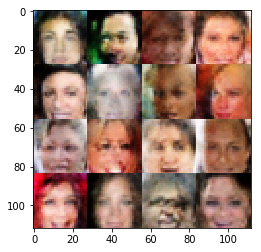

Epoch 2/10... Generator Loss: 0.3542 Discriminator Loss: 1.4731...
Epoch 2/10... Generator Loss: 0.9331 Discriminator Loss: 0.9526...
Epoch 2/10... Generator Loss: 0.3820 Discriminator Loss: 1.3737...
Epoch 2/10... Generator Loss: 1.5024 Discriminator Loss: 1.5073...
Epoch 2/10... Generator Loss: 0.4861 Discriminator Loss: 1.2221...
Epoch 2/10... Generator Loss: 1.1888 Discriminator Loss: 0.9632...
Epoch 2/10... Generator Loss: 0.9115 Discriminator Loss: 1.0102...
Epoch 2/10... Generator Loss: 0.3840 Discriminator Loss: 1.3270...
Epoch 2/10... Generator Loss: 0.6767 Discriminator Loss: 1.0740...
Epoch 2/10... Generator Loss: 0.7441 Discriminator Loss: 0.9566...


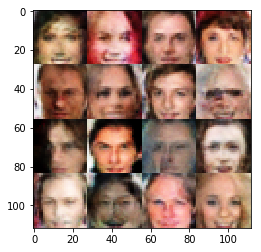

Epoch 2/10... Generator Loss: 1.2686 Discriminator Loss: 1.3280...
Epoch 2/10... Generator Loss: 0.5035 Discriminator Loss: 1.1234...
Epoch 2/10... Generator Loss: 1.0346 Discriminator Loss: 0.5760...
Epoch 3/10... Generator Loss: 1.0885 Discriminator Loss: 0.7565...
Epoch 3/10... Generator Loss: 0.5318 Discriminator Loss: 1.2798...
Epoch 3/10... Generator Loss: 0.5203 Discriminator Loss: 1.1555...
Epoch 3/10... Generator Loss: 0.2247 Discriminator Loss: 1.8912...
Epoch 3/10... Generator Loss: 0.8073 Discriminator Loss: 0.8627...
Epoch 3/10... Generator Loss: 1.3852 Discriminator Loss: 1.3546...
Epoch 3/10... Generator Loss: 0.2882 Discriminator Loss: 1.5862...


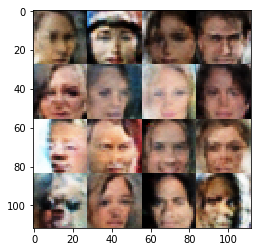

Epoch 3/10... Generator Loss: 0.6993 Discriminator Loss: 0.8341...
Epoch 3/10... Generator Loss: 0.5226 Discriminator Loss: 1.2783...
Epoch 3/10... Generator Loss: 0.7391 Discriminator Loss: 0.9086...
Epoch 3/10... Generator Loss: 2.4116 Discriminator Loss: 0.6280...
Epoch 3/10... Generator Loss: 1.6239 Discriminator Loss: 0.8657...
Epoch 3/10... Generator Loss: 0.5318 Discriminator Loss: 1.2050...
Epoch 3/10... Generator Loss: 1.8839 Discriminator Loss: 0.2612...
Epoch 3/10... Generator Loss: 2.9520 Discriminator Loss: 0.4092...
Epoch 3/10... Generator Loss: 3.2879 Discriminator Loss: 0.2001...
Epoch 3/10... Generator Loss: 2.7607 Discriminator Loss: 0.4906...


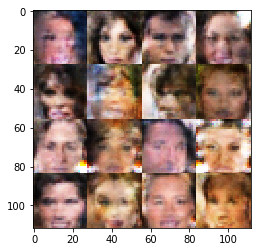

Epoch 3/10... Generator Loss: 1.0744 Discriminator Loss: 1.0553...
Epoch 3/10... Generator Loss: 1.0643 Discriminator Loss: 1.0243...
Epoch 3/10... Generator Loss: 1.5724 Discriminator Loss: 1.3839...
Epoch 3/10... Generator Loss: 2.0367 Discriminator Loss: 1.2472...
Epoch 3/10... Generator Loss: 1.2819 Discriminator Loss: 1.1300...
Epoch 3/10... Generator Loss: 1.4211 Discriminator Loss: 0.8324...
Epoch 3/10... Generator Loss: 0.7405 Discriminator Loss: 0.9520...
Epoch 3/10... Generator Loss: 0.9488 Discriminator Loss: 0.6280...
Epoch 3/10... Generator Loss: 0.5169 Discriminator Loss: 1.2240...
Epoch 3/10... Generator Loss: 0.3190 Discriminator Loss: 1.5587...


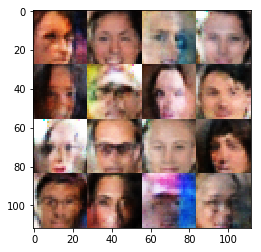

Epoch 3/10... Generator Loss: 0.4286 Discriminator Loss: 1.3064...
Epoch 3/10... Generator Loss: 0.8000 Discriminator Loss: 0.7620...
Epoch 3/10... Generator Loss: 0.3556 Discriminator Loss: 1.4001...
Epoch 3/10... Generator Loss: 1.8191 Discriminator Loss: 0.3122...
Epoch 3/10... Generator Loss: 2.1177 Discriminator Loss: 1.0445...
Epoch 3/10... Generator Loss: 1.0490 Discriminator Loss: 0.9657...
Epoch 3/10... Generator Loss: 0.6751 Discriminator Loss: 0.9399...
Epoch 3/10... Generator Loss: 3.9989 Discriminator Loss: 0.2822...
Epoch 3/10... Generator Loss: 1.0361 Discriminator Loss: 0.6926...
Epoch 3/10... Generator Loss: 1.6220 Discriminator Loss: 0.4467...


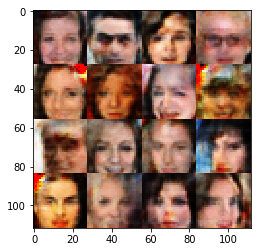

Epoch 3/10... Generator Loss: 3.1780 Discriminator Loss: 0.1100...
Epoch 3/10... Generator Loss: 1.1131 Discriminator Loss: 0.8274...
Epoch 3/10... Generator Loss: 2.4338 Discriminator Loss: 0.3784...
Epoch 3/10... Generator Loss: 2.4107 Discriminator Loss: 0.2584...
Epoch 3/10... Generator Loss: 1.7184 Discriminator Loss: 1.3255...
Epoch 3/10... Generator Loss: 0.9713 Discriminator Loss: 1.0340...
Epoch 3/10... Generator Loss: 2.6012 Discriminator Loss: 0.4201...
Epoch 3/10... Generator Loss: 1.7835 Discriminator Loss: 0.8844...
Epoch 3/10... Generator Loss: 1.8415 Discriminator Loss: 0.3537...
Epoch 3/10... Generator Loss: 3.0711 Discriminator Loss: 0.1522...


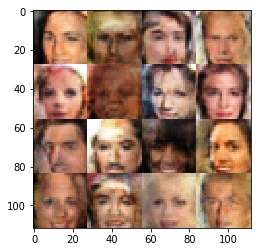

Epoch 3/10... Generator Loss: 1.5749 Discriminator Loss: 0.3710...
Epoch 3/10... Generator Loss: 0.6216 Discriminator Loss: 1.2265...
Epoch 3/10... Generator Loss: 1.5534 Discriminator Loss: 1.1493...
Epoch 3/10... Generator Loss: 0.4416 Discriminator Loss: 1.2022...
Epoch 3/10... Generator Loss: 1.3282 Discriminator Loss: 1.5758...
Epoch 3/10... Generator Loss: 0.5190 Discriminator Loss: 1.1105...
Epoch 3/10... Generator Loss: 2.1882 Discriminator Loss: 0.5386...
Epoch 3/10... Generator Loss: 1.6920 Discriminator Loss: 0.4156...
Epoch 3/10... Generator Loss: 0.9972 Discriminator Loss: 1.0557...
Epoch 3/10... Generator Loss: 1.0973 Discriminator Loss: 1.3735...


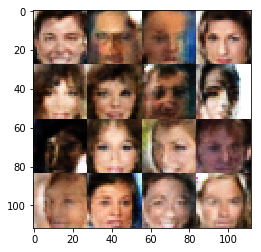

Epoch 3/10... Generator Loss: 1.0560 Discriminator Loss: 0.9766...
Epoch 3/10... Generator Loss: 1.1687 Discriminator Loss: 0.6468...
Epoch 3/10... Generator Loss: 0.9250 Discriminator Loss: 0.8844...
Epoch 3/10... Generator Loss: 0.5449 Discriminator Loss: 1.0019...
Epoch 3/10... Generator Loss: 0.7369 Discriminator Loss: 0.8790...
Epoch 3/10... Generator Loss: 1.5831 Discriminator Loss: 0.2866...
Epoch 3/10... Generator Loss: 0.5509 Discriminator Loss: 1.2367...
Epoch 3/10... Generator Loss: 1.8905 Discriminator Loss: 0.4022...
Epoch 3/10... Generator Loss: 2.6529 Discriminator Loss: 0.1952...
Epoch 3/10... Generator Loss: 0.4280 Discriminator Loss: 1.3093...


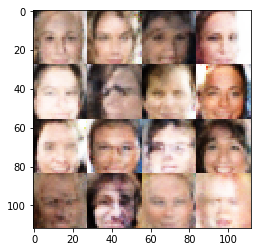

Epoch 3/10... Generator Loss: 2.1228 Discriminator Loss: 1.0174...
Epoch 3/10... Generator Loss: 2.6071 Discriminator Loss: 0.3686...
Epoch 3/10... Generator Loss: 1.3007 Discriminator Loss: 0.4187...
Epoch 3/10... Generator Loss: 2.4503 Discriminator Loss: 0.1352...
Epoch 3/10... Generator Loss: 1.4190 Discriminator Loss: 1.2427...
Epoch 3/10... Generator Loss: 3.0277 Discriminator Loss: 0.3774...
Epoch 3/10... Generator Loss: 1.8468 Discriminator Loss: 0.3579...
Epoch 3/10... Generator Loss: 2.3252 Discriminator Loss: 0.3360...
Epoch 3/10... Generator Loss: 1.8972 Discriminator Loss: 0.2244...
Epoch 3/10... Generator Loss: 0.9569 Discriminator Loss: 0.9749...


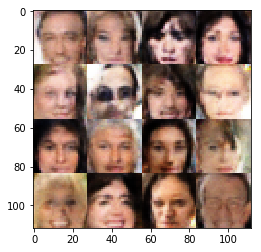

Epoch 3/10... Generator Loss: 0.4943 Discriminator Loss: 1.2430...
Epoch 3/10... Generator Loss: 1.8823 Discriminator Loss: 0.4312...
Epoch 3/10... Generator Loss: 1.6231 Discriminator Loss: 0.4247...
Epoch 3/10... Generator Loss: 1.5510 Discriminator Loss: 1.0258...
Epoch 3/10... Generator Loss: 0.4394 Discriminator Loss: 1.4405...
Epoch 3/10... Generator Loss: 1.1524 Discriminator Loss: 1.1920...
Epoch 3/10... Generator Loss: 0.7662 Discriminator Loss: 0.8780...
Epoch 3/10... Generator Loss: 3.1747 Discriminator Loss: 0.6164...
Epoch 3/10... Generator Loss: 1.5393 Discriminator Loss: 0.3853...
Epoch 3/10... Generator Loss: 0.3437 Discriminator Loss: 1.4353...


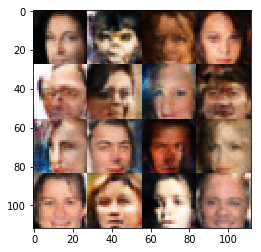

Epoch 3/10... Generator Loss: 0.5999 Discriminator Loss: 1.3284...
Epoch 3/10... Generator Loss: 1.6362 Discriminator Loss: 0.4749...
Epoch 3/10... Generator Loss: 0.9588 Discriminator Loss: 0.6732...
Epoch 3/10... Generator Loss: 2.3915 Discriminator Loss: 0.2367...
Epoch 3/10... Generator Loss: 4.1484 Discriminator Loss: 1.6635...
Epoch 3/10... Generator Loss: 0.6259 Discriminator Loss: 1.0466...
Epoch 3/10... Generator Loss: 1.9516 Discriminator Loss: 0.3064...
Epoch 3/10... Generator Loss: 0.3909 Discriminator Loss: 1.2831...
Epoch 3/10... Generator Loss: 1.5269 Discriminator Loss: 0.5889...
Epoch 3/10... Generator Loss: 1.2424 Discriminator Loss: 0.6184...


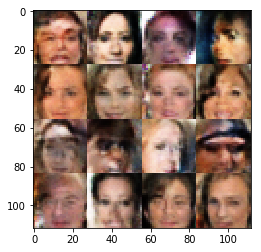

Epoch 3/10... Generator Loss: 2.2546 Discriminator Loss: 0.6087...
Epoch 3/10... Generator Loss: 2.1737 Discriminator Loss: 1.2322...
Epoch 3/10... Generator Loss: 1.4155 Discriminator Loss: 0.4947...
Epoch 3/10... Generator Loss: 1.8932 Discriminator Loss: 0.8082...
Epoch 3/10... Generator Loss: 1.5812 Discriminator Loss: 0.4154...
Epoch 3/10... Generator Loss: 2.4285 Discriminator Loss: 1.4166...
Epoch 3/10... Generator Loss: 1.4166 Discriminator Loss: 0.4573...
Epoch 3/10... Generator Loss: 0.7531 Discriminator Loss: 1.1360...
Epoch 3/10... Generator Loss: 1.3092 Discriminator Loss: 0.4828...
Epoch 3/10... Generator Loss: 2.8295 Discriminator Loss: 0.1503...


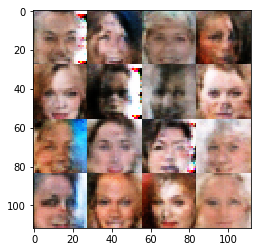

Epoch 3/10... Generator Loss: 1.0212 Discriminator Loss: 0.6458...
Epoch 3/10... Generator Loss: 2.3043 Discriminator Loss: 0.2051...
Epoch 3/10... Generator Loss: 2.0602 Discriminator Loss: 0.2397...
Epoch 3/10... Generator Loss: 3.0817 Discriminator Loss: 0.1386...
Epoch 3/10... Generator Loss: 2.5616 Discriminator Loss: 0.1574...
Epoch 3/10... Generator Loss: 2.8988 Discriminator Loss: 0.1484...
Epoch 3/10... Generator Loss: 1.6832 Discriminator Loss: 0.2868...
Epoch 3/10... Generator Loss: 0.2540 Discriminator Loss: 1.7429...
Epoch 3/10... Generator Loss: 2.0964 Discriminator Loss: 0.2996...
Epoch 3/10... Generator Loss: 1.5981 Discriminator Loss: 0.3873...


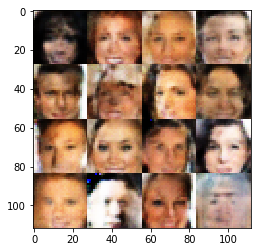

Epoch 3/10... Generator Loss: 2.4318 Discriminator Loss: 0.1541...
Epoch 3/10... Generator Loss: 0.6839 Discriminator Loss: 1.2753...
Epoch 3/10... Generator Loss: 0.7947 Discriminator Loss: 0.7165...
Epoch 3/10... Generator Loss: 0.9261 Discriminator Loss: 0.9603...
Epoch 3/10... Generator Loss: 0.9887 Discriminator Loss: 0.6428...
Epoch 3/10... Generator Loss: 1.5291 Discriminator Loss: 0.3849...
Epoch 3/10... Generator Loss: 1.0901 Discriminator Loss: 1.0730...
Epoch 3/10... Generator Loss: 1.0585 Discriminator Loss: 0.7913...
Epoch 3/10... Generator Loss: 0.3603 Discriminator Loss: 1.4250...
Epoch 3/10... Generator Loss: 0.2564 Discriminator Loss: 1.7072...


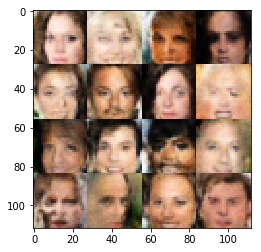

Epoch 3/10... Generator Loss: 2.3095 Discriminator Loss: 0.5002...
Epoch 3/10... Generator Loss: 0.3368 Discriminator Loss: 1.5254...
Epoch 3/10... Generator Loss: 1.1365 Discriminator Loss: 1.0875...
Epoch 3/10... Generator Loss: 1.8742 Discriminator Loss: 1.5477...
Epoch 3/10... Generator Loss: 0.0951 Discriminator Loss: 2.7974...
Epoch 3/10... Generator Loss: 1.2776 Discriminator Loss: 1.0176...
Epoch 3/10... Generator Loss: 0.3906 Discriminator Loss: 1.4050...
Epoch 3/10... Generator Loss: 1.2752 Discriminator Loss: 1.2829...
Epoch 3/10... Generator Loss: 0.7442 Discriminator Loss: 1.0755...
Epoch 3/10... Generator Loss: 2.9099 Discriminator Loss: 0.4548...


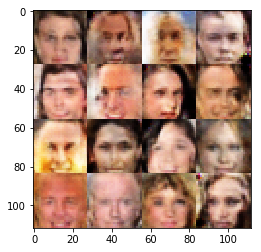

Epoch 3/10... Generator Loss: 1.0717 Discriminator Loss: 1.0541...
Epoch 3/10... Generator Loss: 0.6014 Discriminator Loss: 1.1923...
Epoch 3/10... Generator Loss: 1.5257 Discriminator Loss: 0.5840...
Epoch 3/10... Generator Loss: 1.0064 Discriminator Loss: 1.2167...
Epoch 3/10... Generator Loss: 0.4857 Discriminator Loss: 1.2599...
Epoch 3/10... Generator Loss: 2.0775 Discriminator Loss: 0.4842...
Epoch 3/10... Generator Loss: 0.3901 Discriminator Loss: 1.3505...
Epoch 3/10... Generator Loss: 1.8726 Discriminator Loss: 1.3910...
Epoch 3/10... Generator Loss: 0.5040 Discriminator Loss: 1.1471...
Epoch 3/10... Generator Loss: 2.1133 Discriminator Loss: 0.6889...


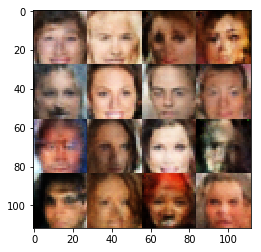

Epoch 3/10... Generator Loss: 0.4223 Discriminator Loss: 1.3422...
Epoch 3/10... Generator Loss: 1.5619 Discriminator Loss: 0.8844...
Epoch 3/10... Generator Loss: 0.6657 Discriminator Loss: 1.2317...
Epoch 3/10... Generator Loss: 0.5710 Discriminator Loss: 1.1534...
Epoch 3/10... Generator Loss: 0.6168 Discriminator Loss: 1.1307...
Epoch 3/10... Generator Loss: 0.7595 Discriminator Loss: 1.0106...
Epoch 3/10... Generator Loss: 0.9636 Discriminator Loss: 1.1972...
Epoch 3/10... Generator Loss: 0.6167 Discriminator Loss: 1.0976...
Epoch 3/10... Generator Loss: 0.7783 Discriminator Loss: 0.8501...
Epoch 3/10... Generator Loss: 0.5320 Discriminator Loss: 1.2776...


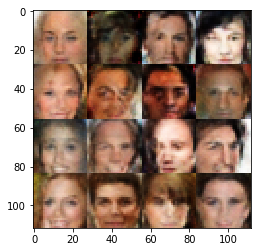

Epoch 3/10... Generator Loss: 0.6205 Discriminator Loss: 1.1451...
Epoch 3/10... Generator Loss: 0.3478 Discriminator Loss: 1.4830...
Epoch 3/10... Generator Loss: 0.7256 Discriminator Loss: 0.9962...
Epoch 3/10... Generator Loss: 1.7585 Discriminator Loss: 1.0821...
Epoch 3/10... Generator Loss: 1.0022 Discriminator Loss: 0.9242...
Epoch 3/10... Generator Loss: 0.5389 Discriminator Loss: 1.2593...
Epoch 3/10... Generator Loss: 1.2169 Discriminator Loss: 0.8203...
Epoch 3/10... Generator Loss: 0.3075 Discriminator Loss: 1.5507...
Epoch 3/10... Generator Loss: 0.3288 Discriminator Loss: 1.5452...
Epoch 3/10... Generator Loss: 1.2204 Discriminator Loss: 0.7049...


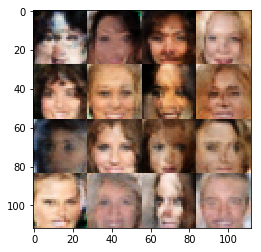

Epoch 3/10... Generator Loss: 0.3883 Discriminator Loss: 1.3823...
Epoch 3/10... Generator Loss: 0.4596 Discriminator Loss: 1.2620...
Epoch 3/10... Generator Loss: 0.8482 Discriminator Loss: 1.0836...
Epoch 3/10... Generator Loss: 0.7279 Discriminator Loss: 1.0729...
Epoch 3/10... Generator Loss: 0.9027 Discriminator Loss: 1.1427...
Epoch 3/10... Generator Loss: 0.7087 Discriminator Loss: 1.3484...
Epoch 3/10... Generator Loss: 0.4963 Discriminator Loss: 1.2051...
Epoch 3/10... Generator Loss: 0.4832 Discriminator Loss: 1.4089...
Epoch 3/10... Generator Loss: 1.4467 Discriminator Loss: 1.4274...
Epoch 3/10... Generator Loss: 1.0314 Discriminator Loss: 0.9033...


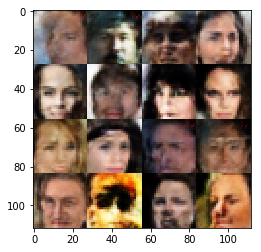

Epoch 3/10... Generator Loss: 0.5574 Discriminator Loss: 1.2913...
Epoch 3/10... Generator Loss: 1.0705 Discriminator Loss: 1.2339...
Epoch 3/10... Generator Loss: 0.7640 Discriminator Loss: 0.9626...
Epoch 3/10... Generator Loss: 0.6090 Discriminator Loss: 1.1587...
Epoch 3/10... Generator Loss: 0.5185 Discriminator Loss: 1.1769...
Epoch 3/10... Generator Loss: 0.7209 Discriminator Loss: 1.0558...
Epoch 3/10... Generator Loss: 0.8131 Discriminator Loss: 1.2653...
Epoch 3/10... Generator Loss: 1.0284 Discriminator Loss: 1.0321...
Epoch 3/10... Generator Loss: 1.2170 Discriminator Loss: 0.5490...
Epoch 3/10... Generator Loss: 0.6992 Discriminator Loss: 1.0526...


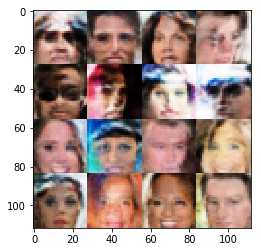

Epoch 3/10... Generator Loss: 1.0699 Discriminator Loss: 1.0291...
Epoch 3/10... Generator Loss: 0.6758 Discriminator Loss: 1.3614...
Epoch 3/10... Generator Loss: 0.3779 Discriminator Loss: 1.4059...
Epoch 3/10... Generator Loss: 0.7347 Discriminator Loss: 1.0260...
Epoch 3/10... Generator Loss: 0.8838 Discriminator Loss: 1.2519...
Epoch 3/10... Generator Loss: 1.3675 Discriminator Loss: 1.4327...
Epoch 3/10... Generator Loss: 0.5366 Discriminator Loss: 1.1841...
Epoch 3/10... Generator Loss: 0.7006 Discriminator Loss: 0.9005...
Epoch 3/10... Generator Loss: 0.3555 Discriminator Loss: 1.5339...
Epoch 3/10... Generator Loss: 2.5410 Discriminator Loss: 1.0029...


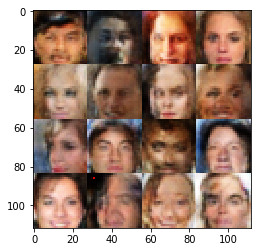

Epoch 3/10... Generator Loss: 0.3848 Discriminator Loss: 1.3475...
Epoch 3/10... Generator Loss: 0.4289 Discriminator Loss: 1.3110...
Epoch 3/10... Generator Loss: 0.2826 Discriminator Loss: 1.6372...
Epoch 3/10... Generator Loss: 0.5490 Discriminator Loss: 1.1162...
Epoch 3/10... Generator Loss: 0.5607 Discriminator Loss: 1.1383...
Epoch 3/10... Generator Loss: 0.4039 Discriminator Loss: 1.4034...
Epoch 3/10... Generator Loss: 0.8508 Discriminator Loss: 1.0044...
Epoch 3/10... Generator Loss: 1.2619 Discriminator Loss: 0.8589...
Epoch 3/10... Generator Loss: 1.2670 Discriminator Loss: 1.1229...
Epoch 3/10... Generator Loss: 0.4781 Discriminator Loss: 1.4775...


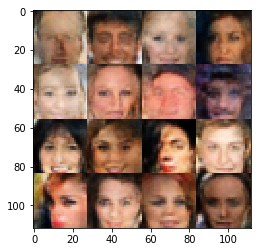

Epoch 3/10... Generator Loss: 0.9952 Discriminator Loss: 0.9703...
Epoch 3/10... Generator Loss: 0.6797 Discriminator Loss: 1.0033...
Epoch 3/10... Generator Loss: 0.5646 Discriminator Loss: 1.1484...
Epoch 3/10... Generator Loss: 0.8002 Discriminator Loss: 1.0604...
Epoch 3/10... Generator Loss: 0.3132 Discriminator Loss: 1.5288...
Epoch 3/10... Generator Loss: 0.3665 Discriminator Loss: 1.5082...
Epoch 3/10... Generator Loss: 1.5017 Discriminator Loss: 1.3197...
Epoch 3/10... Generator Loss: 1.7584 Discriminator Loss: 1.0037...
Epoch 3/10... Generator Loss: 0.5899 Discriminator Loss: 1.2261...
Epoch 3/10... Generator Loss: 0.5709 Discriminator Loss: 1.0579...


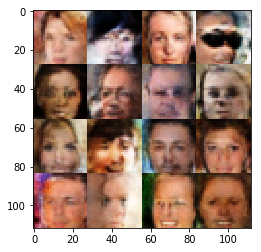

Epoch 3/10... Generator Loss: 0.3008 Discriminator Loss: 1.6467...
Epoch 3/10... Generator Loss: 0.6330 Discriminator Loss: 1.0809...
Epoch 3/10... Generator Loss: 0.3079 Discriminator Loss: 1.5684...
Epoch 3/10... Generator Loss: 0.3300 Discriminator Loss: 1.5182...
Epoch 3/10... Generator Loss: 1.0354 Discriminator Loss: 1.0098...
Epoch 3/10... Generator Loss: 0.5304 Discriminator Loss: 1.2114...
Epoch 3/10... Generator Loss: 0.7064 Discriminator Loss: 1.0752...
Epoch 3/10... Generator Loss: 0.7776 Discriminator Loss: 0.9736...
Epoch 3/10... Generator Loss: 1.0975 Discriminator Loss: 0.9967...
Epoch 3/10... Generator Loss: 1.7447 Discriminator Loss: 0.6892...


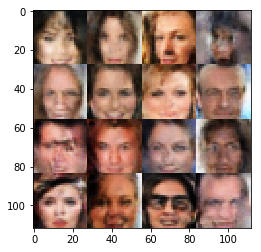

Epoch 3/10... Generator Loss: 0.4925 Discriminator Loss: 1.1892...
Epoch 3/10... Generator Loss: 0.8595 Discriminator Loss: 1.0806...
Epoch 3/10... Generator Loss: 1.8046 Discriminator Loss: 0.7100...
Epoch 3/10... Generator Loss: 1.3326 Discriminator Loss: 0.7968...
Epoch 3/10... Generator Loss: 0.8070 Discriminator Loss: 1.2917...
Epoch 3/10... Generator Loss: 1.1123 Discriminator Loss: 0.9807...
Epoch 3/10... Generator Loss: 0.7628 Discriminator Loss: 1.1096...
Epoch 3/10... Generator Loss: 0.4109 Discriminator Loss: 1.3572...
Epoch 3/10... Generator Loss: 1.4469 Discriminator Loss: 1.2664...
Epoch 3/10... Generator Loss: 0.7653 Discriminator Loss: 1.1411...


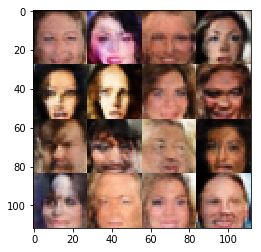

Epoch 3/10... Generator Loss: 1.2712 Discriminator Loss: 0.9313...
Epoch 3/10... Generator Loss: 0.4251 Discriminator Loss: 1.4282...
Epoch 3/10... Generator Loss: 0.3030 Discriminator Loss: 1.5655...
Epoch 3/10... Generator Loss: 0.2597 Discriminator Loss: 1.6913...
Epoch 3/10... Generator Loss: 0.3626 Discriminator Loss: 1.4174...
Epoch 3/10... Generator Loss: 1.2722 Discriminator Loss: 1.1559...
Epoch 3/10... Generator Loss: 0.9850 Discriminator Loss: 0.8899...
Epoch 3/10... Generator Loss: 0.6600 Discriminator Loss: 1.1247...
Epoch 3/10... Generator Loss: 0.6639 Discriminator Loss: 1.1444...
Epoch 3/10... Generator Loss: 0.2491 Discriminator Loss: 1.7270...


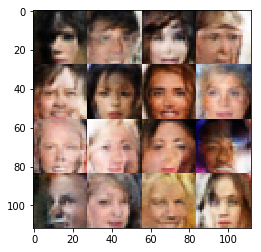

Epoch 3/10... Generator Loss: 0.3661 Discriminator Loss: 1.4523...
Epoch 3/10... Generator Loss: 1.2798 Discriminator Loss: 0.8113...
Epoch 3/10... Generator Loss: 0.6307 Discriminator Loss: 1.1446...
Epoch 3/10... Generator Loss: 0.4919 Discriminator Loss: 1.3297...
Epoch 3/10... Generator Loss: 1.1118 Discriminator Loss: 1.4303...
Epoch 3/10... Generator Loss: 1.3383 Discriminator Loss: 0.8287...
Epoch 3/10... Generator Loss: 0.4271 Discriminator Loss: 1.4365...
Epoch 3/10... Generator Loss: 0.7166 Discriminator Loss: 1.1078...
Epoch 3/10... Generator Loss: 0.8463 Discriminator Loss: 1.1089...
Epoch 3/10... Generator Loss: 0.6093 Discriminator Loss: 1.2375...


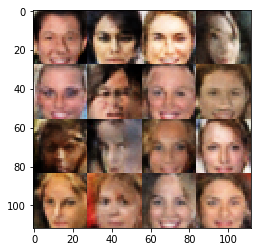

Epoch 3/10... Generator Loss: 0.4711 Discriminator Loss: 1.2965...
Epoch 3/10... Generator Loss: 1.1207 Discriminator Loss: 0.7003...
Epoch 3/10... Generator Loss: 0.9105 Discriminator Loss: 0.8179...
Epoch 3/10... Generator Loss: 1.1971 Discriminator Loss: 0.7692...
Epoch 3/10... Generator Loss: 1.0109 Discriminator Loss: 0.7958...
Epoch 3/10... Generator Loss: 1.4012 Discriminator Loss: 1.1928...
Epoch 3/10... Generator Loss: 1.0705 Discriminator Loss: 1.1151...
Epoch 3/10... Generator Loss: 0.8691 Discriminator Loss: 1.3468...
Epoch 3/10... Generator Loss: 0.8185 Discriminator Loss: 0.8534...
Epoch 3/10... Generator Loss: 0.8181 Discriminator Loss: 0.9624...


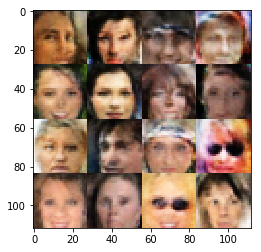

Epoch 3/10... Generator Loss: 0.7624 Discriminator Loss: 1.2579...
Epoch 3/10... Generator Loss: 1.0804 Discriminator Loss: 1.1939...
Epoch 3/10... Generator Loss: 1.4436 Discriminator Loss: 1.1458...
Epoch 3/10... Generator Loss: 0.7486 Discriminator Loss: 0.9668...
Epoch 3/10... Generator Loss: 0.8180 Discriminator Loss: 0.9943...
Epoch 3/10... Generator Loss: 0.7937 Discriminator Loss: 1.0412...
Epoch 3/10... Generator Loss: 1.0119 Discriminator Loss: 1.1243...
Epoch 3/10... Generator Loss: 0.5868 Discriminator Loss: 1.3822...
Epoch 3/10... Generator Loss: 1.6765 Discriminator Loss: 1.9482...
Epoch 3/10... Generator Loss: 1.0336 Discriminator Loss: 0.9006...


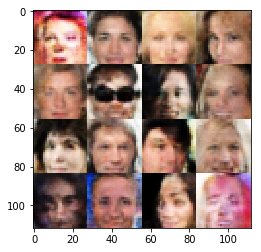

Epoch 3/10... Generator Loss: 1.2039 Discriminator Loss: 1.2487...
Epoch 3/10... Generator Loss: 0.6600 Discriminator Loss: 1.1334...
Epoch 3/10... Generator Loss: 0.3981 Discriminator Loss: 1.3632...
Epoch 3/10... Generator Loss: 0.4552 Discriminator Loss: 1.3282...
Epoch 3/10... Generator Loss: 2.0921 Discriminator Loss: 0.5185...
Epoch 3/10... Generator Loss: 0.3521 Discriminator Loss: 1.5702...
Epoch 3/10... Generator Loss: 0.7319 Discriminator Loss: 1.0131...
Epoch 3/10... Generator Loss: 1.2921 Discriminator Loss: 1.1510...
Epoch 3/10... Generator Loss: 0.7489 Discriminator Loss: 1.2391...
Epoch 3/10... Generator Loss: 0.3648 Discriminator Loss: 1.5741...


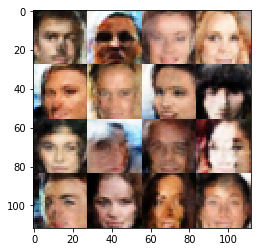

Epoch 3/10... Generator Loss: 1.1733 Discriminator Loss: 1.1362...
Epoch 3/10... Generator Loss: 0.7912 Discriminator Loss: 1.0672...
Epoch 3/10... Generator Loss: 0.2565 Discriminator Loss: 1.6835...
Epoch 3/10... Generator Loss: 0.4413 Discriminator Loss: 1.3018...
Epoch 3/10... Generator Loss: 1.4929 Discriminator Loss: 1.6918...
Epoch 3/10... Generator Loss: 0.8640 Discriminator Loss: 1.0403...
Epoch 3/10... Generator Loss: 1.1316 Discriminator Loss: 0.7818...
Epoch 3/10... Generator Loss: 0.5776 Discriminator Loss: 1.2446...
Epoch 3/10... Generator Loss: 0.3304 Discriminator Loss: 1.4794...
Epoch 3/10... Generator Loss: 0.6498 Discriminator Loss: 1.2309...


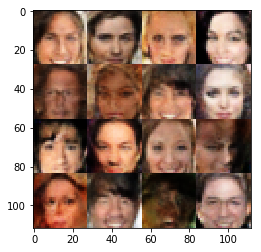

Epoch 3/10... Generator Loss: 0.7582 Discriminator Loss: 1.0074...
Epoch 3/10... Generator Loss: 0.6512 Discriminator Loss: 1.1295...
Epoch 3/10... Generator Loss: 0.4069 Discriminator Loss: 1.4023...
Epoch 3/10... Generator Loss: 0.3473 Discriminator Loss: 1.4441...
Epoch 3/10... Generator Loss: 0.4067 Discriminator Loss: 1.3932...
Epoch 3/10... Generator Loss: 1.3383 Discriminator Loss: 1.0510...
Epoch 3/10... Generator Loss: 0.4381 Discriminator Loss: 1.2905...
Epoch 3/10... Generator Loss: 0.4351 Discriminator Loss: 1.3591...
Epoch 3/10... Generator Loss: 0.8068 Discriminator Loss: 0.9011...
Epoch 3/10... Generator Loss: 1.1853 Discriminator Loss: 0.8008...


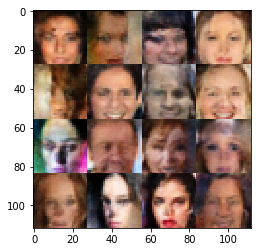

Epoch 3/10... Generator Loss: 1.1561 Discriminator Loss: 0.7714...
Epoch 3/10... Generator Loss: 0.9903 Discriminator Loss: 1.3156...
Epoch 3/10... Generator Loss: 0.6489 Discriminator Loss: 1.2047...
Epoch 3/10... Generator Loss: 0.6687 Discriminator Loss: 0.9621...
Epoch 3/10... Generator Loss: 0.2643 Discriminator Loss: 1.6713...
Epoch 3/10... Generator Loss: 0.3647 Discriminator Loss: 1.5271...
Epoch 3/10... Generator Loss: 0.6968 Discriminator Loss: 1.0857...
Epoch 3/10... Generator Loss: 0.2357 Discriminator Loss: 1.7586...
Epoch 3/10... Generator Loss: 0.3548 Discriminator Loss: 1.4275...
Epoch 4/10... Generator Loss: 0.7537 Discriminator Loss: 1.0165...


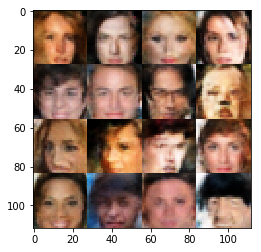

Epoch 4/10... Generator Loss: 0.6738 Discriminator Loss: 1.0768...
Epoch 4/10... Generator Loss: 1.1427 Discriminator Loss: 1.1602...
Epoch 4/10... Generator Loss: 0.8681 Discriminator Loss: 1.0721...
Epoch 4/10... Generator Loss: 0.8608 Discriminator Loss: 1.1549...
Epoch 4/10... Generator Loss: 0.9316 Discriminator Loss: 1.3704...
Epoch 4/10... Generator Loss: 1.1116 Discriminator Loss: 1.1629...
Epoch 4/10... Generator Loss: 0.8724 Discriminator Loss: 1.0300...
Epoch 4/10... Generator Loss: 1.2348 Discriminator Loss: 1.1756...
Epoch 4/10... Generator Loss: 0.3557 Discriminator Loss: 1.5202...
Epoch 4/10... Generator Loss: 0.3860 Discriminator Loss: 1.3962...


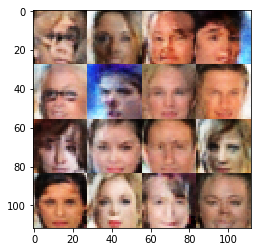

Epoch 4/10... Generator Loss: 0.5146 Discriminator Loss: 1.3270...
Epoch 4/10... Generator Loss: 0.4871 Discriminator Loss: 1.2731...
Epoch 4/10... Generator Loss: 1.3186 Discriminator Loss: 1.4221...
Epoch 4/10... Generator Loss: 0.5024 Discriminator Loss: 1.1973...
Epoch 4/10... Generator Loss: 0.4646 Discriminator Loss: 1.2652...
Epoch 4/10... Generator Loss: 0.3837 Discriminator Loss: 1.3343...
Epoch 4/10... Generator Loss: 0.3237 Discriminator Loss: 1.5315...
Epoch 4/10... Generator Loss: 0.4617 Discriminator Loss: 1.2450...
Epoch 4/10... Generator Loss: 0.8224 Discriminator Loss: 0.8307...
Epoch 4/10... Generator Loss: 0.8834 Discriminator Loss: 0.8227...


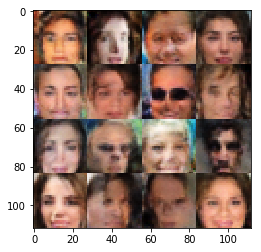

Epoch 4/10... Generator Loss: 0.2706 Discriminator Loss: 1.6476...
Epoch 4/10... Generator Loss: 0.3590 Discriminator Loss: 1.4617...
Epoch 4/10... Generator Loss: 0.4962 Discriminator Loss: 1.3117...
Epoch 4/10... Generator Loss: 1.1450 Discriminator Loss: 0.8465...
Epoch 4/10... Generator Loss: 0.7500 Discriminator Loss: 1.0223...
Epoch 4/10... Generator Loss: 0.3109 Discriminator Loss: 1.5591...
Epoch 4/10... Generator Loss: 1.1286 Discriminator Loss: 0.8241...
Epoch 4/10... Generator Loss: 0.2703 Discriminator Loss: 1.6296...
Epoch 4/10... Generator Loss: 0.9483 Discriminator Loss: 0.7990...
Epoch 4/10... Generator Loss: 0.3399 Discriminator Loss: 1.4909...


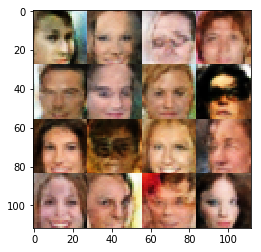

Epoch 4/10... Generator Loss: 0.3237 Discriminator Loss: 1.4946...
Epoch 4/10... Generator Loss: 0.5566 Discriminator Loss: 1.2774...
Epoch 4/10... Generator Loss: 0.6783 Discriminator Loss: 1.1485...
Epoch 4/10... Generator Loss: 0.7201 Discriminator Loss: 1.0052...
Epoch 4/10... Generator Loss: 0.1771 Discriminator Loss: 2.0799...
Epoch 4/10... Generator Loss: 0.5576 Discriminator Loss: 1.3595...
Epoch 4/10... Generator Loss: 1.0392 Discriminator Loss: 1.1138...
Epoch 4/10... Generator Loss: 0.9175 Discriminator Loss: 1.1351...
Epoch 4/10... Generator Loss: 1.6157 Discriminator Loss: 1.8429...
Epoch 4/10... Generator Loss: 0.7415 Discriminator Loss: 1.1330...


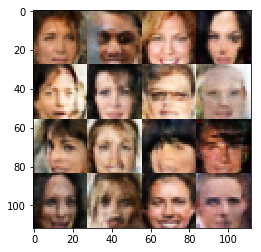

Epoch 4/10... Generator Loss: 0.6153 Discriminator Loss: 1.1617...
Epoch 4/10... Generator Loss: 0.8725 Discriminator Loss: 1.1996...
Epoch 4/10... Generator Loss: 0.5639 Discriminator Loss: 1.3008...
Epoch 4/10... Generator Loss: 0.4885 Discriminator Loss: 1.3393...
Epoch 4/10... Generator Loss: 0.2533 Discriminator Loss: 1.7434...
Epoch 4/10... Generator Loss: 0.6629 Discriminator Loss: 1.1780...
Epoch 4/10... Generator Loss: 0.8493 Discriminator Loss: 0.9466...
Epoch 4/10... Generator Loss: 0.8229 Discriminator Loss: 1.1298...
Epoch 4/10... Generator Loss: 0.7552 Discriminator Loss: 1.1875...
Epoch 4/10... Generator Loss: 0.4740 Discriminator Loss: 1.3077...


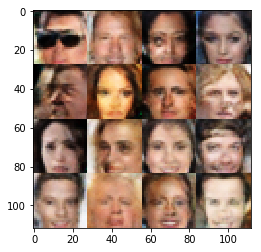

Epoch 4/10... Generator Loss: 0.9900 Discriminator Loss: 0.9983...
Epoch 4/10... Generator Loss: 0.2945 Discriminator Loss: 1.5802...
Epoch 4/10... Generator Loss: 0.4152 Discriminator Loss: 1.3563...
Epoch 4/10... Generator Loss: 1.0767 Discriminator Loss: 0.9413...
Epoch 4/10... Generator Loss: 1.2441 Discriminator Loss: 1.2822...
Epoch 4/10... Generator Loss: 0.3305 Discriminator Loss: 1.5411...
Epoch 4/10... Generator Loss: 0.4869 Discriminator Loss: 1.1912...
Epoch 4/10... Generator Loss: 0.4828 Discriminator Loss: 1.3505...
Epoch 4/10... Generator Loss: 1.5773 Discriminator Loss: 0.6895...
Epoch 4/10... Generator Loss: 1.0621 Discriminator Loss: 1.0680...


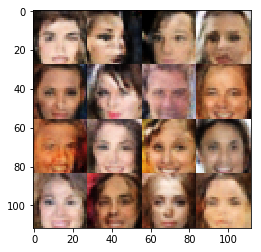

Epoch 4/10... Generator Loss: 0.3594 Discriminator Loss: 1.4471...
Epoch 4/10... Generator Loss: 1.5473 Discriminator Loss: 0.5787...
Epoch 4/10... Generator Loss: 0.9030 Discriminator Loss: 1.3780...
Epoch 4/10... Generator Loss: 0.6895 Discriminator Loss: 1.2375...
Epoch 4/10... Generator Loss: 0.5940 Discriminator Loss: 1.2152...
Epoch 4/10... Generator Loss: 0.7089 Discriminator Loss: 1.1725...
Epoch 4/10... Generator Loss: 0.3674 Discriminator Loss: 1.3858...
Epoch 4/10... Generator Loss: 1.1948 Discriminator Loss: 0.9953...
Epoch 4/10... Generator Loss: 0.6460 Discriminator Loss: 1.1368...
Epoch 4/10... Generator Loss: 0.4192 Discriminator Loss: 1.2853...


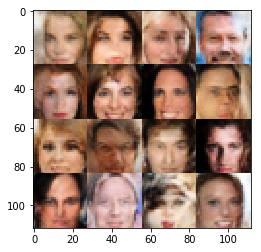

Epoch 4/10... Generator Loss: 0.6956 Discriminator Loss: 1.1532...
Epoch 4/10... Generator Loss: 0.6733 Discriminator Loss: 1.2691...
Epoch 4/10... Generator Loss: 0.5424 Discriminator Loss: 1.1174...
Epoch 4/10... Generator Loss: 0.3960 Discriminator Loss: 1.3642...
Epoch 4/10... Generator Loss: 0.5258 Discriminator Loss: 1.1926...
Epoch 4/10... Generator Loss: 0.6020 Discriminator Loss: 1.1363...
Epoch 4/10... Generator Loss: 0.4055 Discriminator Loss: 1.3504...
Epoch 4/10... Generator Loss: 0.5334 Discriminator Loss: 1.3389...
Epoch 4/10... Generator Loss: 1.0109 Discriminator Loss: 1.2875...
Epoch 4/10... Generator Loss: 0.7220 Discriminator Loss: 1.2105...


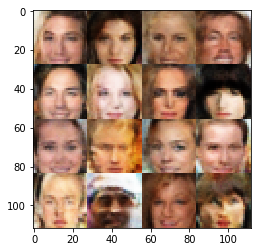

Epoch 4/10... Generator Loss: 0.3361 Discriminator Loss: 1.5454...
Epoch 4/10... Generator Loss: 0.3626 Discriminator Loss: 1.4251...
Epoch 4/10... Generator Loss: 1.0260 Discriminator Loss: 1.3126...
Epoch 4/10... Generator Loss: 1.1171 Discriminator Loss: 1.5862...
Epoch 4/10... Generator Loss: 1.0944 Discriminator Loss: 1.0348...
Epoch 4/10... Generator Loss: 0.4118 Discriminator Loss: 1.3764...
Epoch 4/10... Generator Loss: 1.5136 Discriminator Loss: 1.3411...
Epoch 4/10... Generator Loss: 0.7983 Discriminator Loss: 1.0162...
Epoch 4/10... Generator Loss: 0.6088 Discriminator Loss: 1.3557...
Epoch 4/10... Generator Loss: 0.6188 Discriminator Loss: 1.0212...


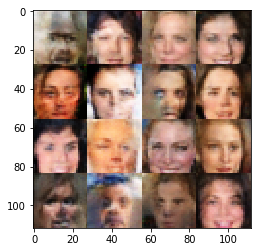

Epoch 4/10... Generator Loss: 0.6020 Discriminator Loss: 0.9875...
Epoch 4/10... Generator Loss: 0.2390 Discriminator Loss: 1.7622...
Epoch 4/10... Generator Loss: 0.9677 Discriminator Loss: 1.1069...
Epoch 4/10... Generator Loss: 1.0755 Discriminator Loss: 1.0956...
Epoch 4/10... Generator Loss: 1.2622 Discriminator Loss: 1.5394...
Epoch 4/10... Generator Loss: 0.4731 Discriminator Loss: 1.2676...
Epoch 4/10... Generator Loss: 0.4636 Discriminator Loss: 1.1759...
Epoch 4/10... Generator Loss: 0.4454 Discriminator Loss: 1.3122...
Epoch 4/10... Generator Loss: 0.2083 Discriminator Loss: 1.8070...
Epoch 4/10... Generator Loss: 0.6713 Discriminator Loss: 1.0653...


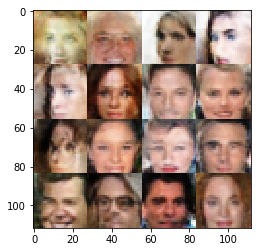

Epoch 4/10... Generator Loss: 0.4719 Discriminator Loss: 1.3539...
Epoch 4/10... Generator Loss: 0.6200 Discriminator Loss: 1.2474...
Epoch 4/10... Generator Loss: 0.3946 Discriminator Loss: 1.4290...
Epoch 4/10... Generator Loss: 0.4436 Discriminator Loss: 1.2548...
Epoch 4/10... Generator Loss: 0.9712 Discriminator Loss: 0.9146...
Epoch 4/10... Generator Loss: 0.3032 Discriminator Loss: 1.5722...
Epoch 4/10... Generator Loss: 0.7360 Discriminator Loss: 0.9794...
Epoch 4/10... Generator Loss: 0.2903 Discriminator Loss: 1.6803...
Epoch 4/10... Generator Loss: 0.2064 Discriminator Loss: 1.9063...
Epoch 4/10... Generator Loss: 0.8968 Discriminator Loss: 1.3039...


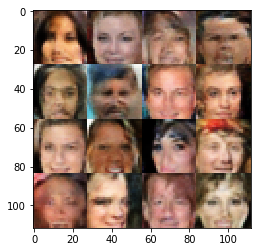

Epoch 4/10... Generator Loss: 0.4927 Discriminator Loss: 1.2326...
Epoch 4/10... Generator Loss: 0.7981 Discriminator Loss: 1.2474...
Epoch 4/10... Generator Loss: 1.0466 Discriminator Loss: 0.9718...
Epoch 4/10... Generator Loss: 0.8329 Discriminator Loss: 0.8560...
Epoch 4/10... Generator Loss: 0.8815 Discriminator Loss: 1.1356...
Epoch 4/10... Generator Loss: 0.1691 Discriminator Loss: 2.0766...
Epoch 4/10... Generator Loss: 0.2350 Discriminator Loss: 1.7884...
Epoch 4/10... Generator Loss: 0.8265 Discriminator Loss: 0.9164...
Epoch 4/10... Generator Loss: 0.3452 Discriminator Loss: 1.4400...
Epoch 4/10... Generator Loss: 0.5117 Discriminator Loss: 1.2882...


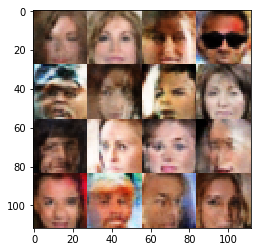

Epoch 4/10... Generator Loss: 0.1812 Discriminator Loss: 1.9986...
Epoch 4/10... Generator Loss: 0.6066 Discriminator Loss: 1.1594...
Epoch 4/10... Generator Loss: 0.8853 Discriminator Loss: 1.1427...
Epoch 4/10... Generator Loss: 0.8349 Discriminator Loss: 1.0877...
Epoch 4/10... Generator Loss: 1.1388 Discriminator Loss: 1.1651...
Epoch 4/10... Generator Loss: 0.2099 Discriminator Loss: 1.8801...
Epoch 4/10... Generator Loss: 1.3688 Discriminator Loss: 0.8497...
Epoch 4/10... Generator Loss: 0.4816 Discriminator Loss: 1.4344...
Epoch 4/10... Generator Loss: 0.7736 Discriminator Loss: 0.8424...
Epoch 4/10... Generator Loss: 1.5483 Discriminator Loss: 1.0096...


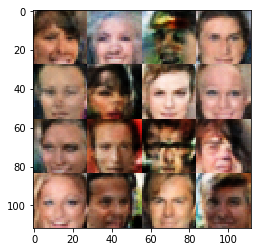

Epoch 4/10... Generator Loss: 0.7751 Discriminator Loss: 1.0738...
Epoch 4/10... Generator Loss: 0.7980 Discriminator Loss: 1.1859...
Epoch 4/10... Generator Loss: 2.2975 Discriminator Loss: 0.5021...
Epoch 4/10... Generator Loss: 0.3036 Discriminator Loss: 1.5440...
Epoch 4/10... Generator Loss: 0.5253 Discriminator Loss: 1.1901...
Epoch 4/10... Generator Loss: 0.4874 Discriminator Loss: 1.2550...
Epoch 4/10... Generator Loss: 0.6450 Discriminator Loss: 1.2460...
Epoch 4/10... Generator Loss: 1.1387 Discriminator Loss: 1.1177...
Epoch 4/10... Generator Loss: 0.7240 Discriminator Loss: 1.0857...
Epoch 4/10... Generator Loss: 0.5458 Discriminator Loss: 1.2286...


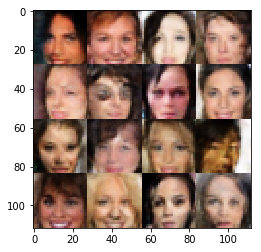

Epoch 4/10... Generator Loss: 0.4671 Discriminator Loss: 1.2939...
Epoch 4/10... Generator Loss: 0.4081 Discriminator Loss: 1.3342...
Epoch 4/10... Generator Loss: 1.0775 Discriminator Loss: 0.9460...
Epoch 4/10... Generator Loss: 1.1584 Discriminator Loss: 0.9549...
Epoch 4/10... Generator Loss: 0.6533 Discriminator Loss: 1.1208...
Epoch 4/10... Generator Loss: 0.9590 Discriminator Loss: 1.1203...
Epoch 4/10... Generator Loss: 1.0948 Discriminator Loss: 0.7575...
Epoch 4/10... Generator Loss: 1.3249 Discriminator Loss: 1.6325...
Epoch 4/10... Generator Loss: 0.8925 Discriminator Loss: 1.1973...
Epoch 4/10... Generator Loss: 0.4133 Discriminator Loss: 1.4789...


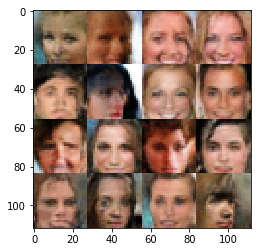

Epoch 4/10... Generator Loss: 0.8592 Discriminator Loss: 1.0643...
Epoch 4/10... Generator Loss: 0.7771 Discriminator Loss: 1.2796...
Epoch 4/10... Generator Loss: 0.4998 Discriminator Loss: 1.2250...
Epoch 4/10... Generator Loss: 0.4295 Discriminator Loss: 1.3350...
Epoch 4/10... Generator Loss: 0.6143 Discriminator Loss: 1.1100...
Epoch 4/10... Generator Loss: 0.4197 Discriminator Loss: 1.2909...
Epoch 4/10... Generator Loss: 0.8920 Discriminator Loss: 1.0930...
Epoch 4/10... Generator Loss: 0.2718 Discriminator Loss: 1.6877...
Epoch 4/10... Generator Loss: 0.7504 Discriminator Loss: 1.0627...
Epoch 4/10... Generator Loss: 0.5717 Discriminator Loss: 1.3061...


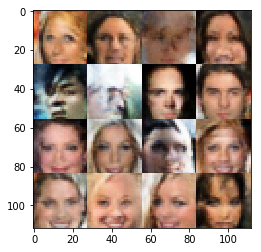

Epoch 4/10... Generator Loss: 0.8388 Discriminator Loss: 1.0111...
Epoch 4/10... Generator Loss: 0.4578 Discriminator Loss: 1.2694...
Epoch 4/10... Generator Loss: 0.4667 Discriminator Loss: 1.3122...
Epoch 4/10... Generator Loss: 0.6925 Discriminator Loss: 0.9578...
Epoch 4/10... Generator Loss: 0.8484 Discriminator Loss: 1.0003...
Epoch 4/10... Generator Loss: 0.3979 Discriminator Loss: 1.3979...
Epoch 4/10... Generator Loss: 1.0454 Discriminator Loss: 1.0917...
Epoch 4/10... Generator Loss: 1.1704 Discriminator Loss: 1.0102...
Epoch 4/10... Generator Loss: 1.0963 Discriminator Loss: 0.9545...
Epoch 4/10... Generator Loss: 0.7779 Discriminator Loss: 1.1002...


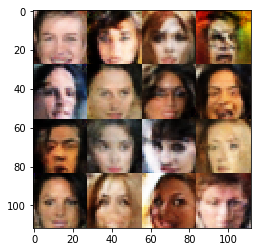

Epoch 4/10... Generator Loss: 0.5943 Discriminator Loss: 1.1569...
Epoch 4/10... Generator Loss: 0.4228 Discriminator Loss: 1.3450...
Epoch 4/10... Generator Loss: 0.3477 Discriminator Loss: 1.5587...
Epoch 4/10... Generator Loss: 0.3967 Discriminator Loss: 1.4873...
Epoch 4/10... Generator Loss: 0.5202 Discriminator Loss: 1.1976...
Epoch 4/10... Generator Loss: 1.0440 Discriminator Loss: 1.4123...
Epoch 4/10... Generator Loss: 0.3582 Discriminator Loss: 1.4446...
Epoch 4/10... Generator Loss: 0.3197 Discriminator Loss: 1.5230...
Epoch 4/10... Generator Loss: 0.8992 Discriminator Loss: 1.1002...
Epoch 4/10... Generator Loss: 0.9427 Discriminator Loss: 0.9431...


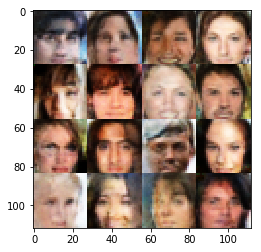

Epoch 4/10... Generator Loss: 0.4276 Discriminator Loss: 1.2751...
Epoch 4/10... Generator Loss: 0.8626 Discriminator Loss: 1.1942...
Epoch 4/10... Generator Loss: 0.3759 Discriminator Loss: 1.3913...
Epoch 4/10... Generator Loss: 0.9216 Discriminator Loss: 1.2616...
Epoch 4/10... Generator Loss: 0.5569 Discriminator Loss: 1.2926...
Epoch 4/10... Generator Loss: 0.9281 Discriminator Loss: 1.1483...
Epoch 4/10... Generator Loss: 0.3385 Discriminator Loss: 1.5638...
Epoch 4/10... Generator Loss: 0.2997 Discriminator Loss: 1.6806...
Epoch 4/10... Generator Loss: 1.0593 Discriminator Loss: 0.9352...
Epoch 4/10... Generator Loss: 0.4902 Discriminator Loss: 1.2627...


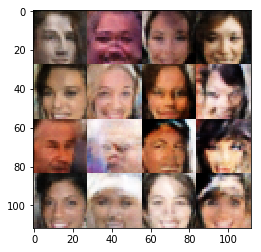

Epoch 4/10... Generator Loss: 0.6775 Discriminator Loss: 1.0206...
Epoch 4/10... Generator Loss: 0.5980 Discriminator Loss: 1.1218...
Epoch 4/10... Generator Loss: 0.9026 Discriminator Loss: 0.8700...
Epoch 4/10... Generator Loss: 1.4763 Discriminator Loss: 1.4955...
Epoch 4/10... Generator Loss: 0.4262 Discriminator Loss: 1.4785...
Epoch 4/10... Generator Loss: 0.3536 Discriminator Loss: 1.4716...
Epoch 4/10... Generator Loss: 0.4926 Discriminator Loss: 1.1707...
Epoch 4/10... Generator Loss: 0.4789 Discriminator Loss: 1.2489...
Epoch 4/10... Generator Loss: 1.0337 Discriminator Loss: 1.0712...
Epoch 4/10... Generator Loss: 0.3110 Discriminator Loss: 1.7707...


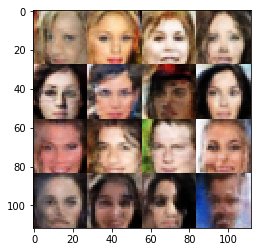

Epoch 4/10... Generator Loss: 1.1119 Discriminator Loss: 1.1878...
Epoch 4/10... Generator Loss: 0.5613 Discriminator Loss: 1.1176...
Epoch 4/10... Generator Loss: 0.6353 Discriminator Loss: 1.1169...
Epoch 4/10... Generator Loss: 0.6784 Discriminator Loss: 1.0253...
Epoch 4/10... Generator Loss: 0.8820 Discriminator Loss: 1.3116...
Epoch 4/10... Generator Loss: 0.3782 Discriminator Loss: 1.4405...
Epoch 4/10... Generator Loss: 0.4140 Discriminator Loss: 1.3611...
Epoch 4/10... Generator Loss: 0.5151 Discriminator Loss: 1.1767...
Epoch 4/10... Generator Loss: 0.4219 Discriminator Loss: 1.3882...
Epoch 4/10... Generator Loss: 1.5814 Discriminator Loss: 0.7386...


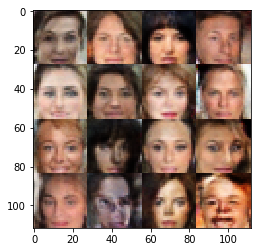

Epoch 4/10... Generator Loss: 1.4108 Discriminator Loss: 1.4059...
Epoch 4/10... Generator Loss: 0.9228 Discriminator Loss: 1.2683...
Epoch 4/10... Generator Loss: 1.0032 Discriminator Loss: 0.8013...
Epoch 4/10... Generator Loss: 1.0262 Discriminator Loss: 0.8126...
Epoch 4/10... Generator Loss: 0.7411 Discriminator Loss: 1.0966...
Epoch 4/10... Generator Loss: 1.1202 Discriminator Loss: 1.5099...
Epoch 4/10... Generator Loss: 1.4184 Discriminator Loss: 1.3731...
Epoch 4/10... Generator Loss: 0.7634 Discriminator Loss: 0.9932...
Epoch 4/10... Generator Loss: 0.2003 Discriminator Loss: 1.8994...
Epoch 4/10... Generator Loss: 0.3015 Discriminator Loss: 1.5475...


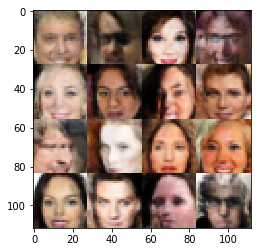

Epoch 4/10... Generator Loss: 0.4499 Discriminator Loss: 1.3568...
Epoch 4/10... Generator Loss: 1.6129 Discriminator Loss: 2.3246...
Epoch 4/10... Generator Loss: 0.8333 Discriminator Loss: 1.0781...
Epoch 4/10... Generator Loss: 0.3972 Discriminator Loss: 1.3941...
Epoch 4/10... Generator Loss: 1.4600 Discriminator Loss: 0.9963...
Epoch 4/10... Generator Loss: 0.4303 Discriminator Loss: 1.3335...
Epoch 4/10... Generator Loss: 0.5514 Discriminator Loss: 1.2693...
Epoch 4/10... Generator Loss: 0.6208 Discriminator Loss: 1.0362...
Epoch 4/10... Generator Loss: 0.7084 Discriminator Loss: 1.1072...
Epoch 4/10... Generator Loss: 1.8807 Discriminator Loss: 0.6283...


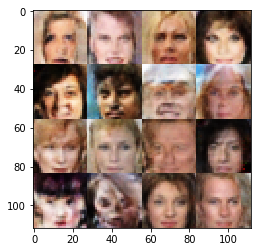

Epoch 4/10... Generator Loss: 0.4066 Discriminator Loss: 1.3971...
Epoch 4/10... Generator Loss: 0.7519 Discriminator Loss: 1.0913...
Epoch 4/10... Generator Loss: 0.7854 Discriminator Loss: 1.2152...
Epoch 4/10... Generator Loss: 0.6452 Discriminator Loss: 1.1348...
Epoch 4/10... Generator Loss: 0.3272 Discriminator Loss: 1.5344...
Epoch 4/10... Generator Loss: 0.4467 Discriminator Loss: 1.3053...
Epoch 4/10... Generator Loss: 0.3515 Discriminator Loss: 1.5304...
Epoch 4/10... Generator Loss: 0.5833 Discriminator Loss: 1.0621...
Epoch 4/10... Generator Loss: 1.0333 Discriminator Loss: 1.1370...
Epoch 4/10... Generator Loss: 0.9170 Discriminator Loss: 1.1239...


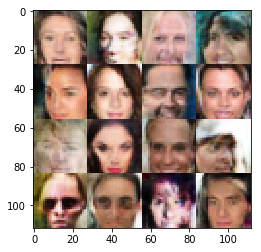

Epoch 4/10... Generator Loss: 0.5456 Discriminator Loss: 1.2604...
Epoch 4/10... Generator Loss: 0.1753 Discriminator Loss: 2.1102...
Epoch 4/10... Generator Loss: 0.5575 Discriminator Loss: 1.2149...
Epoch 4/10... Generator Loss: 0.8850 Discriminator Loss: 1.5818...
Epoch 4/10... Generator Loss: 0.6721 Discriminator Loss: 0.9847...
Epoch 4/10... Generator Loss: 0.3473 Discriminator Loss: 1.4934...
Epoch 4/10... Generator Loss: 0.8015 Discriminator Loss: 0.9202...
Epoch 4/10... Generator Loss: 1.5299 Discriminator Loss: 1.2331...
Epoch 4/10... Generator Loss: 0.4406 Discriminator Loss: 1.2397...
Epoch 4/10... Generator Loss: 0.3835 Discriminator Loss: 1.3351...


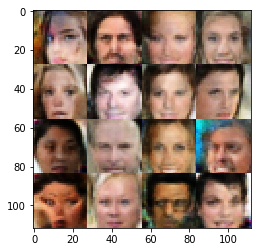

Epoch 4/10... Generator Loss: 0.3979 Discriminator Loss: 1.4434...
Epoch 4/10... Generator Loss: 0.7794 Discriminator Loss: 0.9618...
Epoch 4/10... Generator Loss: 0.2982 Discriminator Loss: 1.6079...
Epoch 4/10... Generator Loss: 0.8243 Discriminator Loss: 1.0571...
Epoch 4/10... Generator Loss: 0.4806 Discriminator Loss: 1.4749...
Epoch 4/10... Generator Loss: 0.3112 Discriminator Loss: 1.5818...
Epoch 4/10... Generator Loss: 0.4276 Discriminator Loss: 1.3713...
Epoch 4/10... Generator Loss: 0.9870 Discriminator Loss: 1.0122...
Epoch 4/10... Generator Loss: 1.8704 Discriminator Loss: 1.8288...
Epoch 4/10... Generator Loss: 0.6266 Discriminator Loss: 1.2627...


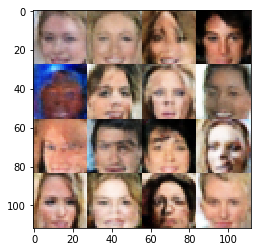

Epoch 4/10... Generator Loss: 1.1324 Discriminator Loss: 1.3129...
Epoch 4/10... Generator Loss: 0.5469 Discriminator Loss: 1.2977...
Epoch 4/10... Generator Loss: 0.8279 Discriminator Loss: 1.1535...
Epoch 4/10... Generator Loss: 0.8578 Discriminator Loss: 0.8722...
Epoch 4/10... Generator Loss: 0.7412 Discriminator Loss: 1.3265...
Epoch 4/10... Generator Loss: 0.7684 Discriminator Loss: 1.2483...
Epoch 4/10... Generator Loss: 0.7089 Discriminator Loss: 1.0298...
Epoch 4/10... Generator Loss: 0.3729 Discriminator Loss: 1.4377...
Epoch 4/10... Generator Loss: 0.6566 Discriminator Loss: 1.3011...
Epoch 4/10... Generator Loss: 0.5999 Discriminator Loss: 1.3325...


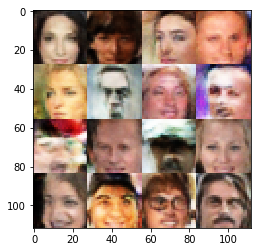

Epoch 4/10... Generator Loss: 0.2403 Discriminator Loss: 1.7423...
Epoch 4/10... Generator Loss: 0.4577 Discriminator Loss: 1.3789...
Epoch 4/10... Generator Loss: 1.0815 Discriminator Loss: 1.1092...
Epoch 4/10... Generator Loss: 0.5320 Discriminator Loss: 1.2141...
Epoch 4/10... Generator Loss: 0.3696 Discriminator Loss: 1.4251...
Epoch 4/10... Generator Loss: 0.6260 Discriminator Loss: 1.1832...
Epoch 4/10... Generator Loss: 0.2611 Discriminator Loss: 1.6514...
Epoch 4/10... Generator Loss: 0.3746 Discriminator Loss: 1.5486...
Epoch 4/10... Generator Loss: 1.3358 Discriminator Loss: 1.3643...
Epoch 4/10... Generator Loss: 0.6381 Discriminator Loss: 1.1776...


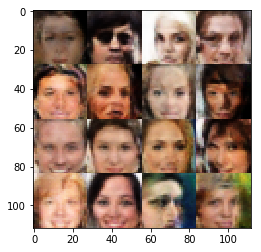

Epoch 4/10... Generator Loss: 0.5775 Discriminator Loss: 1.3181...
Epoch 4/10... Generator Loss: 1.0014 Discriminator Loss: 1.1160...
Epoch 4/10... Generator Loss: 0.7303 Discriminator Loss: 0.9801...
Epoch 4/10... Generator Loss: 0.3353 Discriminator Loss: 1.4974...
Epoch 4/10... Generator Loss: 0.5643 Discriminator Loss: 1.0803...
Epoch 4/10... Generator Loss: 0.5861 Discriminator Loss: 1.1435...
Epoch 4/10... Generator Loss: 1.3173 Discriminator Loss: 1.4208...
Epoch 4/10... Generator Loss: 1.2476 Discriminator Loss: 1.3743...
Epoch 4/10... Generator Loss: 1.2679 Discriminator Loss: 1.1532...
Epoch 4/10... Generator Loss: 0.6987 Discriminator Loss: 1.1485...


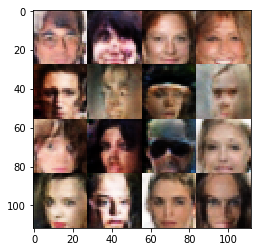

Epoch 4/10... Generator Loss: 0.8379 Discriminator Loss: 0.8163...
Epoch 4/10... Generator Loss: 0.5113 Discriminator Loss: 1.1763...
Epoch 4/10... Generator Loss: 0.8122 Discriminator Loss: 0.9612...
Epoch 4/10... Generator Loss: 0.3435 Discriminator Loss: 1.4785...
Epoch 4/10... Generator Loss: 0.4608 Discriminator Loss: 1.2443...
Epoch 4/10... Generator Loss: 0.6719 Discriminator Loss: 1.0971...
Epoch 4/10... Generator Loss: 0.7671 Discriminator Loss: 0.9637...
Epoch 4/10... Generator Loss: 0.7260 Discriminator Loss: 1.3083...
Epoch 4/10... Generator Loss: 0.5490 Discriminator Loss: 1.2335...
Epoch 4/10... Generator Loss: 0.4830 Discriminator Loss: 1.5133...


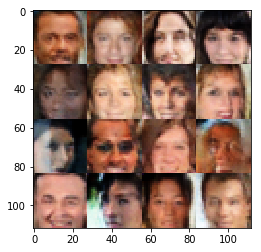

Epoch 4/10... Generator Loss: 2.2067 Discriminator Loss: 0.5285...
Epoch 4/10... Generator Loss: 0.8029 Discriminator Loss: 1.3049...
Epoch 4/10... Generator Loss: 0.7025 Discriminator Loss: 1.1629...
Epoch 4/10... Generator Loss: 1.3574 Discriminator Loss: 1.4669...
Epoch 4/10... Generator Loss: 0.7125 Discriminator Loss: 1.0746...
Epoch 4/10... Generator Loss: 0.4464 Discriminator Loss: 1.3596...
Epoch 4/10... Generator Loss: 0.8870 Discriminator Loss: 1.1181...
Epoch 4/10... Generator Loss: 0.4649 Discriminator Loss: 1.3749...
Epoch 4/10... Generator Loss: 0.5242 Discriminator Loss: 1.2075...
Epoch 4/10... Generator Loss: 2.2017 Discriminator Loss: 0.8131...


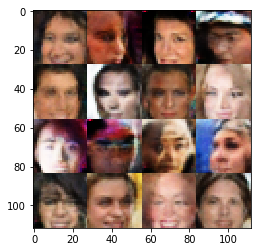

Epoch 4/10... Generator Loss: 0.9283 Discriminator Loss: 1.0959...
Epoch 4/10... Generator Loss: 0.8264 Discriminator Loss: 1.0019...
Epoch 4/10... Generator Loss: 0.3888 Discriminator Loss: 1.3405...
Epoch 4/10... Generator Loss: 0.4165 Discriminator Loss: 1.3258...
Epoch 4/10... Generator Loss: 0.4671 Discriminator Loss: 1.2550...
Epoch 4/10... Generator Loss: 0.9397 Discriminator Loss: 1.1152...
Epoch 5/10... Generator Loss: 0.7392 Discriminator Loss: 1.1161...
Epoch 5/10... Generator Loss: 0.3536 Discriminator Loss: 1.4678...
Epoch 5/10... Generator Loss: 0.6080 Discriminator Loss: 1.1593...
Epoch 5/10... Generator Loss: 0.5948 Discriminator Loss: 1.2330...


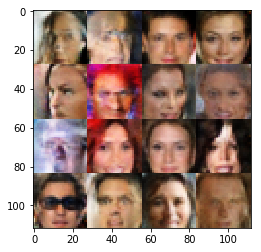

Epoch 5/10... Generator Loss: 0.2058 Discriminator Loss: 1.8445...
Epoch 5/10... Generator Loss: 0.6489 Discriminator Loss: 1.0932...
Epoch 5/10... Generator Loss: 0.6789 Discriminator Loss: 1.2913...
Epoch 5/10... Generator Loss: 0.5010 Discriminator Loss: 1.2644...
Epoch 5/10... Generator Loss: 1.3529 Discriminator Loss: 1.3151...
Epoch 5/10... Generator Loss: 0.6583 Discriminator Loss: 1.0886...
Epoch 5/10... Generator Loss: 0.6786 Discriminator Loss: 1.2241...
Epoch 5/10... Generator Loss: 0.9223 Discriminator Loss: 1.1360...
Epoch 5/10... Generator Loss: 0.7847 Discriminator Loss: 1.0210...
Epoch 5/10... Generator Loss: 0.8461 Discriminator Loss: 0.9906...


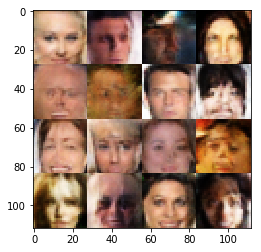

Epoch 5/10... Generator Loss: 0.7079 Discriminator Loss: 0.9459...
Epoch 5/10... Generator Loss: 0.5975 Discriminator Loss: 1.1776...
Epoch 5/10... Generator Loss: 0.9366 Discriminator Loss: 1.1105...
Epoch 5/10... Generator Loss: 1.0281 Discriminator Loss: 0.7927...
Epoch 5/10... Generator Loss: 0.4884 Discriminator Loss: 1.3002...
Epoch 5/10... Generator Loss: 0.3083 Discriminator Loss: 1.5942...
Epoch 5/10... Generator Loss: 0.6154 Discriminator Loss: 1.1042...
Epoch 5/10... Generator Loss: 0.4939 Discriminator Loss: 1.3496...
Epoch 5/10... Generator Loss: 0.3551 Discriminator Loss: 1.5465...
Epoch 5/10... Generator Loss: 1.1935 Discriminator Loss: 1.0669...


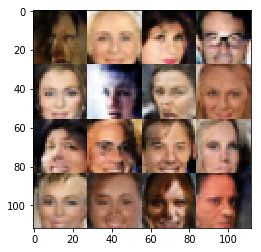

Epoch 5/10... Generator Loss: 1.0275 Discriminator Loss: 0.9369...
Epoch 5/10... Generator Loss: 1.1562 Discriminator Loss: 1.4867...
Epoch 5/10... Generator Loss: 0.4320 Discriminator Loss: 1.4261...
Epoch 5/10... Generator Loss: 0.3677 Discriminator Loss: 1.4477...
Epoch 5/10... Generator Loss: 0.8735 Discriminator Loss: 1.1009...
Epoch 5/10... Generator Loss: 0.3486 Discriminator Loss: 1.5122...
Epoch 5/10... Generator Loss: 0.3335 Discriminator Loss: 1.5590...
Epoch 5/10... Generator Loss: 0.7595 Discriminator Loss: 1.3332...
Epoch 5/10... Generator Loss: 0.7837 Discriminator Loss: 1.0931...
Epoch 5/10... Generator Loss: 0.2328 Discriminator Loss: 1.7577...


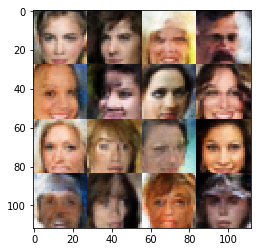

Epoch 5/10... Generator Loss: 0.5797 Discriminator Loss: 1.1306...
Epoch 5/10... Generator Loss: 0.8596 Discriminator Loss: 0.8717...
Epoch 5/10... Generator Loss: 1.0579 Discriminator Loss: 1.6638...
Epoch 5/10... Generator Loss: 0.4901 Discriminator Loss: 1.2724...
Epoch 5/10... Generator Loss: 0.6160 Discriminator Loss: 1.2116...
Epoch 5/10... Generator Loss: 0.5055 Discriminator Loss: 1.3180...
Epoch 5/10... Generator Loss: 0.7982 Discriminator Loss: 1.0421...
Epoch 5/10... Generator Loss: 0.2297 Discriminator Loss: 1.8410...
Epoch 5/10... Generator Loss: 0.2947 Discriminator Loss: 1.5938...
Epoch 5/10... Generator Loss: 0.2622 Discriminator Loss: 1.7501...


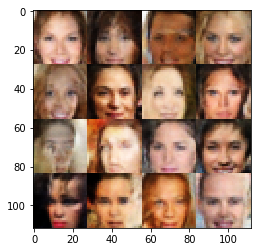

Epoch 5/10... Generator Loss: 0.6133 Discriminator Loss: 1.3418...
Epoch 5/10... Generator Loss: 0.7201 Discriminator Loss: 1.1452...
Epoch 5/10... Generator Loss: 0.3469 Discriminator Loss: 1.4622...
Epoch 5/10... Generator Loss: 0.6302 Discriminator Loss: 1.1398...
Epoch 5/10... Generator Loss: 1.1141 Discriminator Loss: 1.1620...
Epoch 5/10... Generator Loss: 0.6280 Discriminator Loss: 1.0633...
Epoch 5/10... Generator Loss: 0.4076 Discriminator Loss: 1.4123...
Epoch 5/10... Generator Loss: 0.6426 Discriminator Loss: 1.3195...
Epoch 5/10... Generator Loss: 1.0450 Discriminator Loss: 1.3223...
Epoch 5/10... Generator Loss: 0.9773 Discriminator Loss: 1.0500...


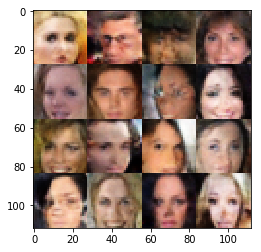

Epoch 5/10... Generator Loss: 0.3792 Discriminator Loss: 1.4068...
Epoch 5/10... Generator Loss: 0.5495 Discriminator Loss: 1.1687...
Epoch 5/10... Generator Loss: 0.2599 Discriminator Loss: 1.7303...
Epoch 5/10... Generator Loss: 0.8427 Discriminator Loss: 1.0019...
Epoch 5/10... Generator Loss: 0.6219 Discriminator Loss: 1.1821...
Epoch 5/10... Generator Loss: 0.7729 Discriminator Loss: 1.0957...
Epoch 5/10... Generator Loss: 0.7016 Discriminator Loss: 1.0232...
Epoch 5/10... Generator Loss: 0.9224 Discriminator Loss: 1.5007...
Epoch 5/10... Generator Loss: 0.3989 Discriminator Loss: 1.3672...
Epoch 5/10... Generator Loss: 0.6443 Discriminator Loss: 1.3778...


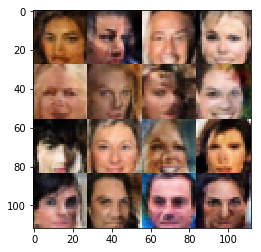

Epoch 5/10... Generator Loss: 0.5350 Discriminator Loss: 1.1577...
Epoch 5/10... Generator Loss: 0.2688 Discriminator Loss: 1.6774...
Epoch 5/10... Generator Loss: 0.4185 Discriminator Loss: 1.2668...
Epoch 5/10... Generator Loss: 0.5534 Discriminator Loss: 1.3123...
Epoch 5/10... Generator Loss: 0.8002 Discriminator Loss: 1.3538...
Epoch 5/10... Generator Loss: 0.5170 Discriminator Loss: 1.1874...
Epoch 5/10... Generator Loss: 0.4316 Discriminator Loss: 1.3851...
Epoch 5/10... Generator Loss: 0.4027 Discriminator Loss: 1.3977...
Epoch 5/10... Generator Loss: 0.9725 Discriminator Loss: 1.1792...
Epoch 5/10... Generator Loss: 0.3362 Discriminator Loss: 1.5104...


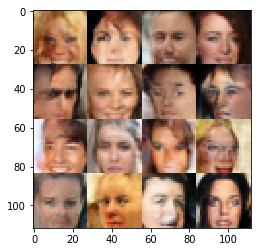

Epoch 5/10... Generator Loss: 0.7273 Discriminator Loss: 1.2428...
Epoch 5/10... Generator Loss: 0.8509 Discriminator Loss: 1.2318...
Epoch 5/10... Generator Loss: 0.5290 Discriminator Loss: 1.2574...
Epoch 5/10... Generator Loss: 0.7831 Discriminator Loss: 1.0762...
Epoch 5/10... Generator Loss: 1.0159 Discriminator Loss: 1.0782...
Epoch 5/10... Generator Loss: 0.7918 Discriminator Loss: 1.1419...
Epoch 5/10... Generator Loss: 1.0113 Discriminator Loss: 0.9861...
Epoch 5/10... Generator Loss: 0.6041 Discriminator Loss: 1.2259...
Epoch 5/10... Generator Loss: 0.7719 Discriminator Loss: 1.2921...
Epoch 5/10... Generator Loss: 0.6120 Discriminator Loss: 1.3148...


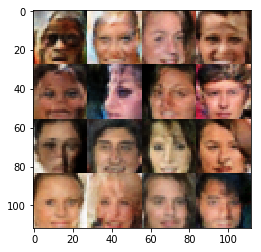

Epoch 5/10... Generator Loss: 1.7683 Discriminator Loss: 0.9455...
Epoch 5/10... Generator Loss: 0.8574 Discriminator Loss: 1.0898...
Epoch 5/10... Generator Loss: 0.8137 Discriminator Loss: 1.0880...
Epoch 5/10... Generator Loss: 1.4838 Discriminator Loss: 1.0745...
Epoch 5/10... Generator Loss: 0.8412 Discriminator Loss: 1.2176...
Epoch 5/10... Generator Loss: 0.7415 Discriminator Loss: 1.0884...
Epoch 5/10... Generator Loss: 0.6019 Discriminator Loss: 1.2583...
Epoch 5/10... Generator Loss: 1.3427 Discriminator Loss: 0.7279...
Epoch 5/10... Generator Loss: 0.1751 Discriminator Loss: 2.0254...
Epoch 5/10... Generator Loss: 0.7985 Discriminator Loss: 1.4451...


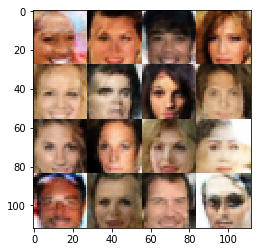

Epoch 5/10... Generator Loss: 1.3148 Discriminator Loss: 0.8693...
Epoch 5/10... Generator Loss: 0.7807 Discriminator Loss: 1.1167...
Epoch 5/10... Generator Loss: 0.3613 Discriminator Loss: 1.4452...
Epoch 5/10... Generator Loss: 0.2732 Discriminator Loss: 1.7198...
Epoch 5/10... Generator Loss: 0.4899 Discriminator Loss: 1.2409...
Epoch 5/10... Generator Loss: 0.9563 Discriminator Loss: 1.1790...
Epoch 5/10... Generator Loss: 1.1785 Discriminator Loss: 1.0425...
Epoch 5/10... Generator Loss: 0.7490 Discriminator Loss: 1.2252...
Epoch 5/10... Generator Loss: 1.3482 Discriminator Loss: 1.2266...
Epoch 5/10... Generator Loss: 0.6571 Discriminator Loss: 1.4047...


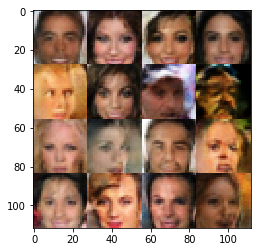

Epoch 5/10... Generator Loss: 0.3948 Discriminator Loss: 1.3990...
Epoch 5/10... Generator Loss: 0.4141 Discriminator Loss: 1.4763...
Epoch 5/10... Generator Loss: 1.1180 Discriminator Loss: 0.7543...
Epoch 5/10... Generator Loss: 0.9617 Discriminator Loss: 1.4567...
Epoch 5/10... Generator Loss: 0.4503 Discriminator Loss: 1.3379...
Epoch 5/10... Generator Loss: 0.9596 Discriminator Loss: 1.5592...
Epoch 5/10... Generator Loss: 0.7533 Discriminator Loss: 0.9843...
Epoch 5/10... Generator Loss: 0.4579 Discriminator Loss: 1.4185...
Epoch 5/10... Generator Loss: 0.6724 Discriminator Loss: 1.0112...
Epoch 5/10... Generator Loss: 1.0515 Discriminator Loss: 0.9696...


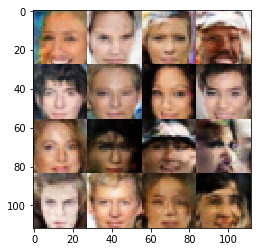

Epoch 5/10... Generator Loss: 1.1172 Discriminator Loss: 1.3272...
Epoch 5/10... Generator Loss: 0.7910 Discriminator Loss: 0.9621...
Epoch 5/10... Generator Loss: 0.3821 Discriminator Loss: 1.4928...
Epoch 5/10... Generator Loss: 0.4034 Discriminator Loss: 1.3879...
Epoch 5/10... Generator Loss: 0.3966 Discriminator Loss: 1.4699...
Epoch 5/10... Generator Loss: 0.5090 Discriminator Loss: 1.3755...
Epoch 5/10... Generator Loss: 0.6300 Discriminator Loss: 1.2732...
Epoch 5/10... Generator Loss: 1.4271 Discriminator Loss: 1.2560...
Epoch 5/10... Generator Loss: 1.0213 Discriminator Loss: 1.0735...
Epoch 5/10... Generator Loss: 0.3722 Discriminator Loss: 1.3873...


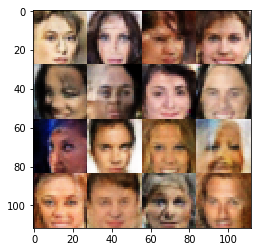

Epoch 5/10... Generator Loss: 0.3400 Discriminator Loss: 1.5597...
Epoch 5/10... Generator Loss: 0.5114 Discriminator Loss: 1.3070...
Epoch 5/10... Generator Loss: 0.8414 Discriminator Loss: 1.2134...
Epoch 5/10... Generator Loss: 0.5583 Discriminator Loss: 1.1505...
Epoch 5/10... Generator Loss: 0.4673 Discriminator Loss: 1.2614...
Epoch 5/10... Generator Loss: 0.5316 Discriminator Loss: 1.3649...
Epoch 5/10... Generator Loss: 0.4510 Discriminator Loss: 1.3694...
Epoch 5/10... Generator Loss: 0.3809 Discriminator Loss: 1.5808...
Epoch 5/10... Generator Loss: 0.6382 Discriminator Loss: 1.1006...
Epoch 5/10... Generator Loss: 0.4299 Discriminator Loss: 1.3486...


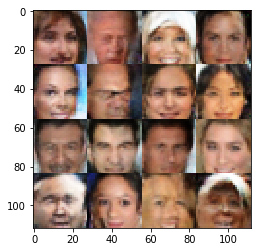

Epoch 5/10... Generator Loss: 0.4530 Discriminator Loss: 1.4854...
Epoch 5/10... Generator Loss: 1.0308 Discriminator Loss: 1.0750...
Epoch 5/10... Generator Loss: 0.2110 Discriminator Loss: 1.8779...
Epoch 5/10... Generator Loss: 1.4792 Discriminator Loss: 0.7942...
Epoch 5/10... Generator Loss: 0.4808 Discriminator Loss: 1.2823...
Epoch 5/10... Generator Loss: 0.8990 Discriminator Loss: 1.0771...
Epoch 5/10... Generator Loss: 0.5513 Discriminator Loss: 1.2194...
Epoch 5/10... Generator Loss: 0.3065 Discriminator Loss: 1.5898...
Epoch 5/10... Generator Loss: 1.5283 Discriminator Loss: 1.3144...
Epoch 5/10... Generator Loss: 0.3295 Discriminator Loss: 1.5347...


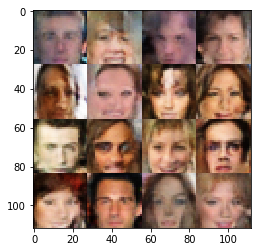

Epoch 5/10... Generator Loss: 0.7678 Discriminator Loss: 1.1691...
Epoch 5/10... Generator Loss: 0.6005 Discriminator Loss: 0.9657...
Epoch 5/10... Generator Loss: 0.8123 Discriminator Loss: 1.1410...
Epoch 5/10... Generator Loss: 0.4777 Discriminator Loss: 1.2143...
Epoch 5/10... Generator Loss: 0.5007 Discriminator Loss: 1.2401...
Epoch 5/10... Generator Loss: 1.0244 Discriminator Loss: 1.1426...
Epoch 5/10... Generator Loss: 0.7405 Discriminator Loss: 1.0920...
Epoch 5/10... Generator Loss: 1.0615 Discriminator Loss: 1.2664...
Epoch 5/10... Generator Loss: 1.0732 Discriminator Loss: 0.8752...
Epoch 5/10... Generator Loss: 1.3790 Discriminator Loss: 1.1801...


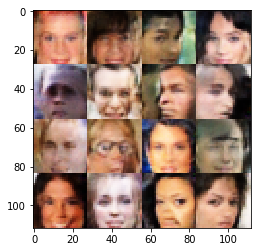

Epoch 5/10... Generator Loss: 0.6830 Discriminator Loss: 1.1893...
Epoch 5/10... Generator Loss: 0.7183 Discriminator Loss: 1.2144...
Epoch 5/10... Generator Loss: 1.3015 Discriminator Loss: 1.4133...
Epoch 5/10... Generator Loss: 1.6627 Discriminator Loss: 0.9319...
Epoch 5/10... Generator Loss: 0.6041 Discriminator Loss: 1.2947...
Epoch 5/10... Generator Loss: 0.6371 Discriminator Loss: 1.4777...
Epoch 5/10... Generator Loss: 0.4596 Discriminator Loss: 1.2955...
Epoch 5/10... Generator Loss: 0.8100 Discriminator Loss: 1.0520...
Epoch 5/10... Generator Loss: 1.3915 Discriminator Loss: 1.2839...
Epoch 5/10... Generator Loss: 0.9810 Discriminator Loss: 1.0107...


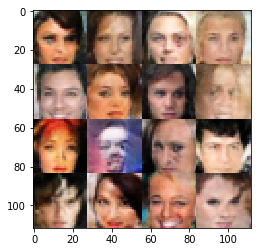

Epoch 5/10... Generator Loss: 0.9085 Discriminator Loss: 0.7700...
Epoch 5/10... Generator Loss: 0.4497 Discriminator Loss: 1.3525...
Epoch 5/10... Generator Loss: 0.5195 Discriminator Loss: 1.0966...
Epoch 5/10... Generator Loss: 0.9933 Discriminator Loss: 1.3219...
Epoch 5/10... Generator Loss: 0.3906 Discriminator Loss: 1.4530...
Epoch 5/10... Generator Loss: 0.5013 Discriminator Loss: 1.2307...
Epoch 5/10... Generator Loss: 0.3062 Discriminator Loss: 1.5861...
Epoch 5/10... Generator Loss: 1.0327 Discriminator Loss: 0.9681...
Epoch 5/10... Generator Loss: 0.5171 Discriminator Loss: 1.2765...
Epoch 5/10... Generator Loss: 1.5263 Discriminator Loss: 0.6498...


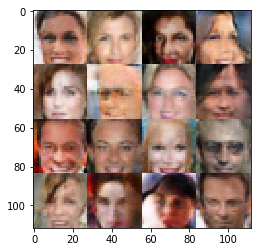

Epoch 5/10... Generator Loss: 0.5817 Discriminator Loss: 1.3332...
Epoch 5/10... Generator Loss: 0.1238 Discriminator Loss: 2.3738...
Epoch 5/10... Generator Loss: 0.5946 Discriminator Loss: 1.1472...
Epoch 5/10... Generator Loss: 0.5136 Discriminator Loss: 1.4389...
Epoch 5/10... Generator Loss: 0.3895 Discriminator Loss: 1.4066...
Epoch 5/10... Generator Loss: 0.6140 Discriminator Loss: 1.0955...
Epoch 5/10... Generator Loss: 1.1028 Discriminator Loss: 1.4908...
Epoch 5/10... Generator Loss: 0.6123 Discriminator Loss: 1.1933...
Epoch 5/10... Generator Loss: 1.0615 Discriminator Loss: 0.8681...
Epoch 5/10... Generator Loss: 0.2944 Discriminator Loss: 1.6319...


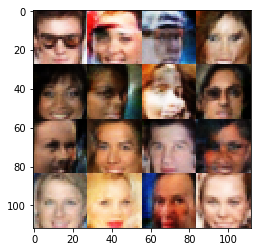

Epoch 5/10... Generator Loss: 0.3494 Discriminator Loss: 1.4621...
Epoch 5/10... Generator Loss: 0.5369 Discriminator Loss: 1.1967...
Epoch 5/10... Generator Loss: 0.3055 Discriminator Loss: 1.5991...
Epoch 5/10... Generator Loss: 0.6389 Discriminator Loss: 1.1982...
Epoch 5/10... Generator Loss: 0.7601 Discriminator Loss: 1.0962...
Epoch 5/10... Generator Loss: 0.3150 Discriminator Loss: 1.5573...
Epoch 5/10... Generator Loss: 0.5268 Discriminator Loss: 1.1649...
Epoch 5/10... Generator Loss: 0.7449 Discriminator Loss: 1.1251...
Epoch 5/10... Generator Loss: 0.5173 Discriminator Loss: 1.3331...
Epoch 5/10... Generator Loss: 0.6435 Discriminator Loss: 1.2163...


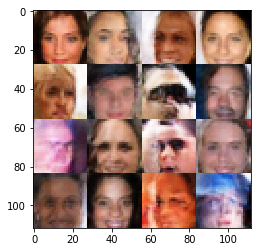

Epoch 5/10... Generator Loss: 0.7151 Discriminator Loss: 1.2417...
Epoch 5/10... Generator Loss: 1.0249 Discriminator Loss: 1.3293...
Epoch 5/10... Generator Loss: 0.4523 Discriminator Loss: 1.3318...
Epoch 5/10... Generator Loss: 0.2918 Discriminator Loss: 1.6361...
Epoch 5/10... Generator Loss: 0.9677 Discriminator Loss: 0.9874...
Epoch 5/10... Generator Loss: 0.6731 Discriminator Loss: 1.1923...
Epoch 5/10... Generator Loss: 0.8766 Discriminator Loss: 1.0889...
Epoch 5/10... Generator Loss: 0.6704 Discriminator Loss: 1.2536...
Epoch 5/10... Generator Loss: 0.6744 Discriminator Loss: 1.1336...
Epoch 5/10... Generator Loss: 1.0218 Discriminator Loss: 1.2064...


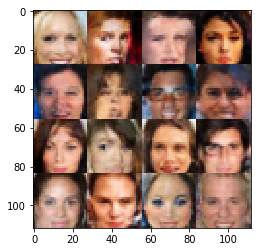

Epoch 5/10... Generator Loss: 0.7021 Discriminator Loss: 1.4549...
Epoch 5/10... Generator Loss: 0.7612 Discriminator Loss: 1.0709...
Epoch 5/10... Generator Loss: 0.5982 Discriminator Loss: 1.1556...
Epoch 5/10... Generator Loss: 0.3065 Discriminator Loss: 1.5525...
Epoch 5/10... Generator Loss: 0.6475 Discriminator Loss: 1.2149...
Epoch 5/10... Generator Loss: 0.7115 Discriminator Loss: 1.1014...
Epoch 5/10... Generator Loss: 0.4789 Discriminator Loss: 1.2994...
Epoch 5/10... Generator Loss: 0.3402 Discriminator Loss: 1.5159...
Epoch 5/10... Generator Loss: 0.3179 Discriminator Loss: 1.5513...
Epoch 5/10... Generator Loss: 0.4027 Discriminator Loss: 1.3240...


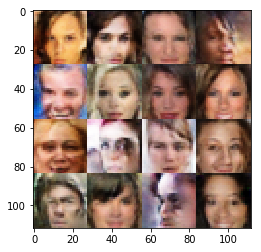

Epoch 5/10... Generator Loss: 0.7923 Discriminator Loss: 1.0953...
Epoch 5/10... Generator Loss: 0.3979 Discriminator Loss: 1.4095...
Epoch 5/10... Generator Loss: 0.3768 Discriminator Loss: 1.4864...
Epoch 5/10... Generator Loss: 0.6992 Discriminator Loss: 1.0750...
Epoch 5/10... Generator Loss: 0.6551 Discriminator Loss: 1.2485...
Epoch 5/10... Generator Loss: 1.0751 Discriminator Loss: 1.0048...
Epoch 5/10... Generator Loss: 0.2609 Discriminator Loss: 1.7776...
Epoch 5/10... Generator Loss: 0.9934 Discriminator Loss: 1.2017...
Epoch 5/10... Generator Loss: 0.4064 Discriminator Loss: 1.4956...
Epoch 5/10... Generator Loss: 0.7859 Discriminator Loss: 1.1368...


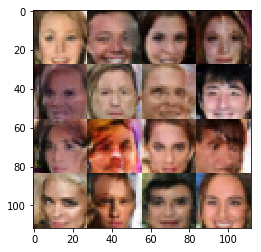

Epoch 5/10... Generator Loss: 0.4697 Discriminator Loss: 1.2743...
Epoch 5/10... Generator Loss: 1.0631 Discriminator Loss: 1.1201...
Epoch 5/10... Generator Loss: 0.7698 Discriminator Loss: 0.9755...
Epoch 5/10... Generator Loss: 1.1043 Discriminator Loss: 1.3804...
Epoch 5/10... Generator Loss: 0.7078 Discriminator Loss: 1.2876...
Epoch 5/10... Generator Loss: 0.4976 Discriminator Loss: 1.2495...
Epoch 5/10... Generator Loss: 0.3854 Discriminator Loss: 1.3953...
Epoch 5/10... Generator Loss: 0.9398 Discriminator Loss: 1.1953...
Epoch 5/10... Generator Loss: 0.3939 Discriminator Loss: 1.4332...
Epoch 5/10... Generator Loss: 0.7023 Discriminator Loss: 1.1726...


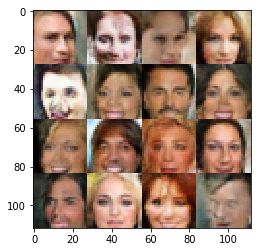

Epoch 5/10... Generator Loss: 0.9040 Discriminator Loss: 0.8869...
Epoch 5/10... Generator Loss: 0.5483 Discriminator Loss: 1.1911...
Epoch 5/10... Generator Loss: 0.5907 Discriminator Loss: 1.1799...
Epoch 5/10... Generator Loss: 1.1698 Discriminator Loss: 1.3458...
Epoch 5/10... Generator Loss: 0.7217 Discriminator Loss: 1.2020...
Epoch 5/10... Generator Loss: 0.4989 Discriminator Loss: 1.2645...
Epoch 5/10... Generator Loss: 0.7175 Discriminator Loss: 1.2225...
Epoch 5/10... Generator Loss: 0.7248 Discriminator Loss: 0.9885...
Epoch 5/10... Generator Loss: 0.8469 Discriminator Loss: 1.0521...
Epoch 5/10... Generator Loss: 0.6712 Discriminator Loss: 1.1255...


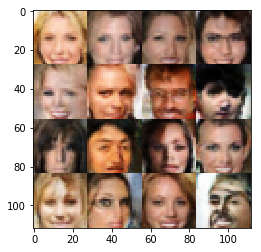

Epoch 5/10... Generator Loss: 0.3305 Discriminator Loss: 1.5395...
Epoch 5/10... Generator Loss: 0.3132 Discriminator Loss: 1.5977...
Epoch 5/10... Generator Loss: 0.6014 Discriminator Loss: 1.2559...
Epoch 5/10... Generator Loss: 0.2737 Discriminator Loss: 1.6546...
Epoch 5/10... Generator Loss: 1.0146 Discriminator Loss: 0.9123...
Epoch 5/10... Generator Loss: 0.4025 Discriminator Loss: 1.3968...
Epoch 5/10... Generator Loss: 0.1993 Discriminator Loss: 1.8966...
Epoch 5/10... Generator Loss: 0.8722 Discriminator Loss: 1.2270...
Epoch 5/10... Generator Loss: 0.5066 Discriminator Loss: 1.3228...
Epoch 5/10... Generator Loss: 0.6435 Discriminator Loss: 1.2211...


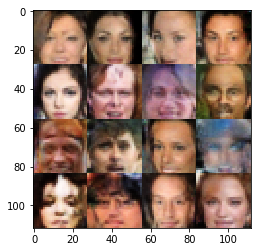

Epoch 5/10... Generator Loss: 0.4487 Discriminator Loss: 1.3040...
Epoch 5/10... Generator Loss: 0.6280 Discriminator Loss: 1.2658...
Epoch 5/10... Generator Loss: 0.4255 Discriminator Loss: 1.5293...
Epoch 5/10... Generator Loss: 0.5476 Discriminator Loss: 1.2185...
Epoch 5/10... Generator Loss: 0.3824 Discriminator Loss: 1.3664...
Epoch 5/10... Generator Loss: 0.6692 Discriminator Loss: 1.2303...
Epoch 5/10... Generator Loss: 0.8781 Discriminator Loss: 1.1784...
Epoch 5/10... Generator Loss: 0.3089 Discriminator Loss: 1.5601...
Epoch 5/10... Generator Loss: 0.7324 Discriminator Loss: 1.0399...
Epoch 5/10... Generator Loss: 0.7197 Discriminator Loss: 1.1568...


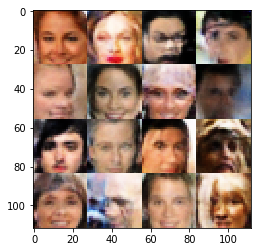

Epoch 5/10... Generator Loss: 0.5571 Discriminator Loss: 1.3835...
Epoch 5/10... Generator Loss: 0.3187 Discriminator Loss: 1.5544...
Epoch 5/10... Generator Loss: 0.7990 Discriminator Loss: 1.0313...
Epoch 5/10... Generator Loss: 0.9420 Discriminator Loss: 0.9995...
Epoch 5/10... Generator Loss: 0.4803 Discriminator Loss: 1.3349...
Epoch 5/10... Generator Loss: 0.4452 Discriminator Loss: 1.3533...
Epoch 5/10... Generator Loss: 0.4993 Discriminator Loss: 1.4301...
Epoch 5/10... Generator Loss: 0.3394 Discriminator Loss: 1.4647...
Epoch 5/10... Generator Loss: 1.0945 Discriminator Loss: 1.0365...
Epoch 5/10... Generator Loss: 0.6273 Discriminator Loss: 1.1665...


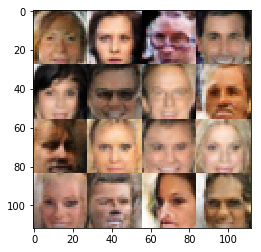

Epoch 5/10... Generator Loss: 0.6243 Discriminator Loss: 1.2109...
Epoch 5/10... Generator Loss: 0.9280 Discriminator Loss: 1.4056...
Epoch 5/10... Generator Loss: 0.5713 Discriminator Loss: 1.2922...
Epoch 5/10... Generator Loss: 0.5620 Discriminator Loss: 1.2768...
Epoch 5/10... Generator Loss: 0.5237 Discriminator Loss: 1.3505...
Epoch 5/10... Generator Loss: 0.3161 Discriminator Loss: 1.6594...
Epoch 5/10... Generator Loss: 0.5175 Discriminator Loss: 1.2362...
Epoch 5/10... Generator Loss: 0.6379 Discriminator Loss: 1.1649...
Epoch 5/10... Generator Loss: 0.3548 Discriminator Loss: 1.5231...
Epoch 5/10... Generator Loss: 0.5181 Discriminator Loss: 1.4307...


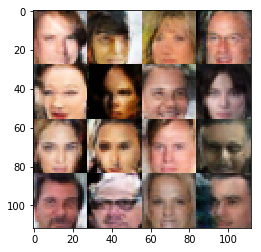

Epoch 5/10... Generator Loss: 0.5921 Discriminator Loss: 1.2661...
Epoch 5/10... Generator Loss: 0.3960 Discriminator Loss: 1.4198...
Epoch 5/10... Generator Loss: 0.5607 Discriminator Loss: 1.3266...
Epoch 5/10... Generator Loss: 0.5969 Discriminator Loss: 1.2476...
Epoch 5/10... Generator Loss: 0.4072 Discriminator Loss: 1.3546...
Epoch 5/10... Generator Loss: 0.2571 Discriminator Loss: 1.7034...
Epoch 5/10... Generator Loss: 0.9136 Discriminator Loss: 1.2084...
Epoch 5/10... Generator Loss: 1.0727 Discriminator Loss: 1.2357...
Epoch 5/10... Generator Loss: 0.7710 Discriminator Loss: 1.0763...
Epoch 5/10... Generator Loss: 1.1640 Discriminator Loss: 1.1113...


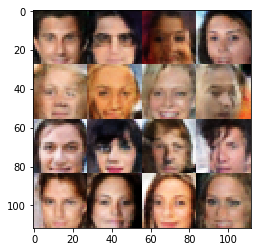

Epoch 5/10... Generator Loss: 0.9957 Discriminator Loss: 1.1333...
Epoch 5/10... Generator Loss: 0.4512 Discriminator Loss: 1.3926...
Epoch 5/10... Generator Loss: 0.4430 Discriminator Loss: 1.4466...
Epoch 5/10... Generator Loss: 0.3469 Discriminator Loss: 1.4539...
Epoch 5/10... Generator Loss: 0.4749 Discriminator Loss: 1.3054...
Epoch 5/10... Generator Loss: 0.3117 Discriminator Loss: 1.5587...
Epoch 5/10... Generator Loss: 0.3693 Discriminator Loss: 1.4263...
Epoch 5/10... Generator Loss: 0.3037 Discriminator Loss: 1.5735...
Epoch 5/10... Generator Loss: 0.9070 Discriminator Loss: 1.1492...
Epoch 5/10... Generator Loss: 0.8980 Discriminator Loss: 1.2861...


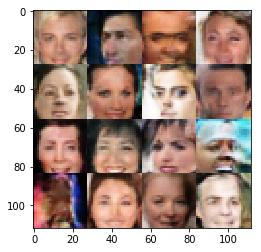

Epoch 5/10... Generator Loss: 0.6152 Discriminator Loss: 1.1579...
Epoch 5/10... Generator Loss: 0.7801 Discriminator Loss: 0.9506...
Epoch 5/10... Generator Loss: 0.6508 Discriminator Loss: 1.3294...
Epoch 5/10... Generator Loss: 0.3643 Discriminator Loss: 1.4506...
Epoch 5/10... Generator Loss: 0.3689 Discriminator Loss: 1.4857...
Epoch 5/10... Generator Loss: 0.3876 Discriminator Loss: 1.4214...
Epoch 5/10... Generator Loss: 0.3887 Discriminator Loss: 1.3532...
Epoch 5/10... Generator Loss: 0.4614 Discriminator Loss: 1.2792...
Epoch 5/10... Generator Loss: 0.2796 Discriminator Loss: 1.6311...
Epoch 5/10... Generator Loss: 1.2691 Discriminator Loss: 1.2286...


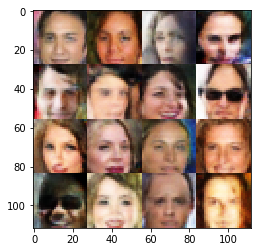

Epoch 5/10... Generator Loss: 0.2800 Discriminator Loss: 1.6273...
Epoch 5/10... Generator Loss: 1.0889 Discriminator Loss: 1.4080...
Epoch 6/10... Generator Loss: 0.9152 Discriminator Loss: 1.1099...
Epoch 6/10... Generator Loss: 0.2927 Discriminator Loss: 1.6398...
Epoch 6/10... Generator Loss: 0.7528 Discriminator Loss: 1.2186...
Epoch 6/10... Generator Loss: 0.4169 Discriminator Loss: 1.3853...
Epoch 6/10... Generator Loss: 0.6364 Discriminator Loss: 1.1045...
Epoch 6/10... Generator Loss: 0.6206 Discriminator Loss: 1.5175...
Epoch 6/10... Generator Loss: 0.6578 Discriminator Loss: 1.0079...
Epoch 6/10... Generator Loss: 1.0956 Discriminator Loss: 1.5203...


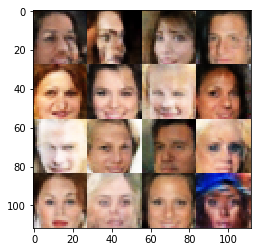

Epoch 6/10... Generator Loss: 0.5079 Discriminator Loss: 1.3264...
Epoch 6/10... Generator Loss: 0.4340 Discriminator Loss: 1.4266...
Epoch 6/10... Generator Loss: 0.6942 Discriminator Loss: 1.3237...
Epoch 6/10... Generator Loss: 0.5631 Discriminator Loss: 1.2066...
Epoch 6/10... Generator Loss: 0.3651 Discriminator Loss: 1.4643...
Epoch 6/10... Generator Loss: 0.6535 Discriminator Loss: 1.1737...
Epoch 6/10... Generator Loss: 0.4649 Discriminator Loss: 1.3370...
Epoch 6/10... Generator Loss: 0.5604 Discriminator Loss: 1.1638...
Epoch 6/10... Generator Loss: 0.4284 Discriminator Loss: 1.4018...
Epoch 6/10... Generator Loss: 0.2686 Discriminator Loss: 1.7528...


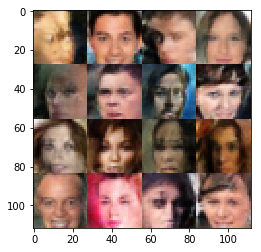

Epoch 6/10... Generator Loss: 0.3130 Discriminator Loss: 1.5589...
Epoch 6/10... Generator Loss: 0.7931 Discriminator Loss: 1.1151...
Epoch 6/10... Generator Loss: 0.4876 Discriminator Loss: 1.3032...
Epoch 6/10... Generator Loss: 0.5301 Discriminator Loss: 1.2852...
Epoch 6/10... Generator Loss: 0.4201 Discriminator Loss: 1.4059...
Epoch 6/10... Generator Loss: 0.1583 Discriminator Loss: 2.1444...
Epoch 6/10... Generator Loss: 0.7820 Discriminator Loss: 0.9184...
Epoch 6/10... Generator Loss: 0.8070 Discriminator Loss: 1.2527...
Epoch 6/10... Generator Loss: 0.3031 Discriminator Loss: 1.6342...
Epoch 6/10... Generator Loss: 0.6351 Discriminator Loss: 1.1992...


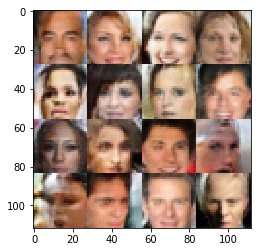

Epoch 6/10... Generator Loss: 0.3572 Discriminator Loss: 1.4709...
Epoch 6/10... Generator Loss: 0.5707 Discriminator Loss: 1.3250...
Epoch 6/10... Generator Loss: 0.5783 Discriminator Loss: 1.1736...
Epoch 6/10... Generator Loss: 0.3395 Discriminator Loss: 1.5672...
Epoch 6/10... Generator Loss: 0.5686 Discriminator Loss: 1.1971...
Epoch 6/10... Generator Loss: 0.6138 Discriminator Loss: 1.1777...
Epoch 6/10... Generator Loss: 0.9990 Discriminator Loss: 1.0523...
Epoch 6/10... Generator Loss: 0.5458 Discriminator Loss: 1.2162...
Epoch 6/10... Generator Loss: 0.5406 Discriminator Loss: 1.3223...
Epoch 6/10... Generator Loss: 1.1074 Discriminator Loss: 1.0795...


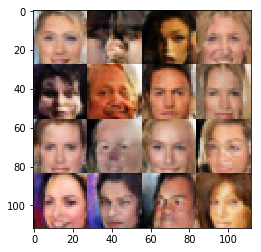

Epoch 6/10... Generator Loss: 0.5659 Discriminator Loss: 1.2713...
Epoch 6/10... Generator Loss: 0.6187 Discriminator Loss: 1.2119...
Epoch 6/10... Generator Loss: 0.5036 Discriminator Loss: 1.2773...
Epoch 6/10... Generator Loss: 0.3792 Discriminator Loss: 1.4526...
Epoch 6/10... Generator Loss: 0.4302 Discriminator Loss: 1.3309...
Epoch 6/10... Generator Loss: 0.4344 Discriminator Loss: 1.5355...
Epoch 6/10... Generator Loss: 0.5981 Discriminator Loss: 1.2734...
Epoch 6/10... Generator Loss: 0.3283 Discriminator Loss: 1.5398...
Epoch 6/10... Generator Loss: 0.5759 Discriminator Loss: 1.3368...
Epoch 6/10... Generator Loss: 0.7505 Discriminator Loss: 1.0926...


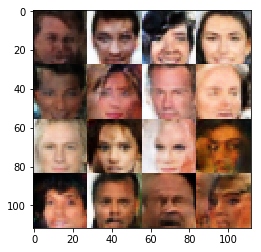

Epoch 6/10... Generator Loss: 0.5467 Discriminator Loss: 1.2037...
Epoch 6/10... Generator Loss: 0.5916 Discriminator Loss: 1.1904...
Epoch 6/10... Generator Loss: 0.6147 Discriminator Loss: 1.2272...
Epoch 6/10... Generator Loss: 1.0935 Discriminator Loss: 1.2144...
Epoch 6/10... Generator Loss: 0.5434 Discriminator Loss: 1.3590...
Epoch 6/10... Generator Loss: 0.6583 Discriminator Loss: 1.0861...
Epoch 6/10... Generator Loss: 0.7906 Discriminator Loss: 1.3611...
Epoch 6/10... Generator Loss: 1.1733 Discriminator Loss: 1.0856...
Epoch 6/10... Generator Loss: 0.3691 Discriminator Loss: 1.5130...
Epoch 6/10... Generator Loss: 0.3369 Discriminator Loss: 1.5964...


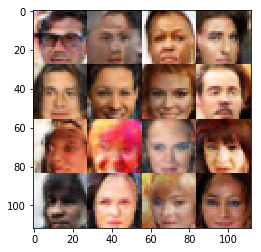

Epoch 6/10... Generator Loss: 0.5020 Discriminator Loss: 1.2422...
Epoch 6/10... Generator Loss: 0.9456 Discriminator Loss: 1.0665...
Epoch 6/10... Generator Loss: 1.1202 Discriminator Loss: 1.3667...
Epoch 6/10... Generator Loss: 0.3150 Discriminator Loss: 1.6877...
Epoch 6/10... Generator Loss: 0.9460 Discriminator Loss: 1.2347...
Epoch 6/10... Generator Loss: 0.6434 Discriminator Loss: 1.2509...
Epoch 6/10... Generator Loss: 0.6569 Discriminator Loss: 1.4163...
Epoch 6/10... Generator Loss: 0.4982 Discriminator Loss: 1.3608...
Epoch 6/10... Generator Loss: 0.8254 Discriminator Loss: 1.1277...
Epoch 6/10... Generator Loss: 0.3817 Discriminator Loss: 1.4053...


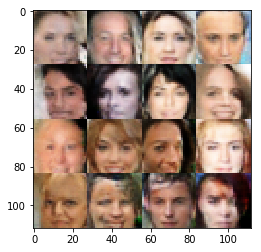

Epoch 6/10... Generator Loss: 0.6793 Discriminator Loss: 1.2886...
Epoch 6/10... Generator Loss: 0.7758 Discriminator Loss: 1.1291...
Epoch 6/10... Generator Loss: 0.5397 Discriminator Loss: 1.2279...
Epoch 6/10... Generator Loss: 0.7312 Discriminator Loss: 1.3323...
Epoch 6/10... Generator Loss: 0.4305 Discriminator Loss: 1.3001...
Epoch 6/10... Generator Loss: 0.4460 Discriminator Loss: 1.3924...
Epoch 6/10... Generator Loss: 0.8062 Discriminator Loss: 1.1823...
Epoch 6/10... Generator Loss: 0.3371 Discriminator Loss: 1.5119...
Epoch 6/10... Generator Loss: 0.4201 Discriminator Loss: 1.3100...
Epoch 6/10... Generator Loss: 0.3503 Discriminator Loss: 1.4913...


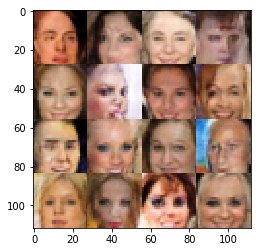

Epoch 6/10... Generator Loss: 0.2479 Discriminator Loss: 1.6676...
Epoch 6/10... Generator Loss: 0.5005 Discriminator Loss: 1.2988...
Epoch 6/10... Generator Loss: 0.5104 Discriminator Loss: 1.3272...
Epoch 6/10... Generator Loss: 0.6566 Discriminator Loss: 1.1741...
Epoch 6/10... Generator Loss: 0.2184 Discriminator Loss: 1.8189...
Epoch 6/10... Generator Loss: 0.6859 Discriminator Loss: 1.1997...
Epoch 6/10... Generator Loss: 0.5253 Discriminator Loss: 1.2855...
Epoch 6/10... Generator Loss: 0.6174 Discriminator Loss: 1.1875...
Epoch 6/10... Generator Loss: 0.4285 Discriminator Loss: 1.4027...
Epoch 6/10... Generator Loss: 0.7486 Discriminator Loss: 1.2049...


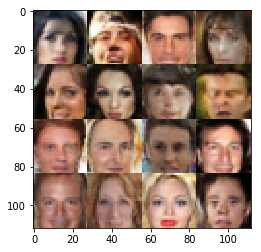

Epoch 6/10... Generator Loss: 0.5720 Discriminator Loss: 1.2299...
Epoch 6/10... Generator Loss: 0.6325 Discriminator Loss: 1.2921...
Epoch 6/10... Generator Loss: 0.4812 Discriminator Loss: 1.2837...
Epoch 6/10... Generator Loss: 0.3970 Discriminator Loss: 1.3617...
Epoch 6/10... Generator Loss: 0.5001 Discriminator Loss: 1.2237...
Epoch 6/10... Generator Loss: 0.6645 Discriminator Loss: 1.2690...
Epoch 6/10... Generator Loss: 0.7388 Discriminator Loss: 1.1749...
Epoch 6/10... Generator Loss: 0.4532 Discriminator Loss: 1.3062...
Epoch 6/10... Generator Loss: 0.3877 Discriminator Loss: 1.4908...
Epoch 6/10... Generator Loss: 0.2747 Discriminator Loss: 1.6597...


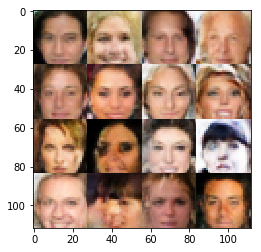

Epoch 6/10... Generator Loss: 0.3601 Discriminator Loss: 1.4729...
Epoch 6/10... Generator Loss: 0.5022 Discriminator Loss: 1.1673...
Epoch 6/10... Generator Loss: 0.3158 Discriminator Loss: 1.5091...
Epoch 6/10... Generator Loss: 0.5335 Discriminator Loss: 1.4004...
Epoch 6/10... Generator Loss: 0.5621 Discriminator Loss: 1.2456...
Epoch 6/10... Generator Loss: 0.3070 Discriminator Loss: 1.6257...
Epoch 6/10... Generator Loss: 0.6349 Discriminator Loss: 0.9896...
Epoch 6/10... Generator Loss: 0.6528 Discriminator Loss: 1.1211...
Epoch 6/10... Generator Loss: 0.3261 Discriminator Loss: 1.5056...
Epoch 6/10... Generator Loss: 0.5284 Discriminator Loss: 1.2582...


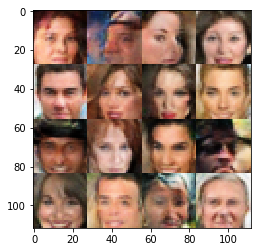

Epoch 6/10... Generator Loss: 0.4865 Discriminator Loss: 1.2953...
Epoch 6/10... Generator Loss: 0.3990 Discriminator Loss: 1.4149...
Epoch 6/10... Generator Loss: 0.7415 Discriminator Loss: 1.1229...
Epoch 6/10... Generator Loss: 0.3813 Discriminator Loss: 1.4880...
Epoch 6/10... Generator Loss: 0.5918 Discriminator Loss: 1.3946...
Epoch 6/10... Generator Loss: 0.5400 Discriminator Loss: 1.2216...
Epoch 6/10... Generator Loss: 0.8888 Discriminator Loss: 1.4430...
Epoch 6/10... Generator Loss: 0.6445 Discriminator Loss: 1.3099...
Epoch 6/10... Generator Loss: 0.6268 Discriminator Loss: 1.0885...
Epoch 6/10... Generator Loss: 0.3160 Discriminator Loss: 1.5330...


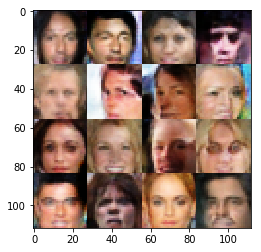

Epoch 6/10... Generator Loss: 0.8082 Discriminator Loss: 0.9137...
Epoch 6/10... Generator Loss: 1.0159 Discriminator Loss: 1.0389...
Epoch 6/10... Generator Loss: 0.4750 Discriminator Loss: 1.3012...
Epoch 6/10... Generator Loss: 0.5535 Discriminator Loss: 1.3070...
Epoch 6/10... Generator Loss: 0.4200 Discriminator Loss: 1.4120...
Epoch 6/10... Generator Loss: 0.4564 Discriminator Loss: 1.4431...
Epoch 6/10... Generator Loss: 0.3681 Discriminator Loss: 1.4790...
Epoch 6/10... Generator Loss: 0.4691 Discriminator Loss: 1.2336...
Epoch 6/10... Generator Loss: 0.2830 Discriminator Loss: 1.5948...
Epoch 6/10... Generator Loss: 0.5602 Discriminator Loss: 1.3060...


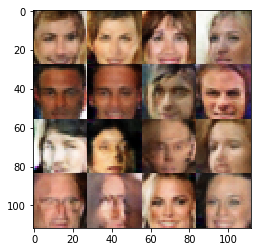

Epoch 6/10... Generator Loss: 0.4352 Discriminator Loss: 1.4319...
Epoch 6/10... Generator Loss: 0.5616 Discriminator Loss: 1.2603...
Epoch 6/10... Generator Loss: 0.6401 Discriminator Loss: 1.1242...
Epoch 6/10... Generator Loss: 0.5472 Discriminator Loss: 1.3979...
Epoch 6/10... Generator Loss: 0.3066 Discriminator Loss: 1.6687...
Epoch 6/10... Generator Loss: 1.0928 Discriminator Loss: 1.0516...
Epoch 6/10... Generator Loss: 0.3663 Discriminator Loss: 1.4580...
Epoch 6/10... Generator Loss: 0.3612 Discriminator Loss: 1.4140...
Epoch 6/10... Generator Loss: 0.6778 Discriminator Loss: 1.2134...
Epoch 6/10... Generator Loss: 1.0372 Discriminator Loss: 1.2359...


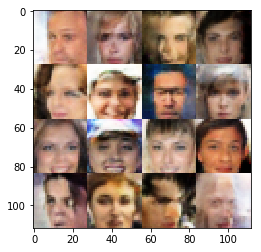

Epoch 6/10... Generator Loss: 1.3504 Discriminator Loss: 1.1757...
Epoch 6/10... Generator Loss: 0.2936 Discriminator Loss: 1.6975...
Epoch 6/10... Generator Loss: 0.5239 Discriminator Loss: 1.2947...
Epoch 6/10... Generator Loss: 0.5130 Discriminator Loss: 1.2764...
Epoch 6/10... Generator Loss: 0.2695 Discriminator Loss: 1.6666...
Epoch 6/10... Generator Loss: 0.6802 Discriminator Loss: 1.1316...
Epoch 6/10... Generator Loss: 0.7565 Discriminator Loss: 1.4427...
Epoch 6/10... Generator Loss: 0.9891 Discriminator Loss: 1.3543...
Epoch 6/10... Generator Loss: 0.5420 Discriminator Loss: 1.2529...
Epoch 6/10... Generator Loss: 0.3386 Discriminator Loss: 1.3863...


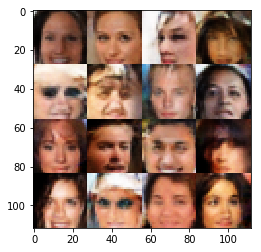

Epoch 6/10... Generator Loss: 0.4675 Discriminator Loss: 1.3379...
Epoch 6/10... Generator Loss: 0.4456 Discriminator Loss: 1.3353...
Epoch 6/10... Generator Loss: 0.5000 Discriminator Loss: 1.4070...
Epoch 6/10... Generator Loss: 0.3044 Discriminator Loss: 1.5616...
Epoch 6/10... Generator Loss: 0.5649 Discriminator Loss: 1.3256...
Epoch 6/10... Generator Loss: 0.9306 Discriminator Loss: 1.0734...
Epoch 6/10... Generator Loss: 0.3227 Discriminator Loss: 1.5586...
Epoch 6/10... Generator Loss: 0.4729 Discriminator Loss: 1.2390...
Epoch 6/10... Generator Loss: 0.2155 Discriminator Loss: 1.8867...
Epoch 6/10... Generator Loss: 0.7858 Discriminator Loss: 1.0860...


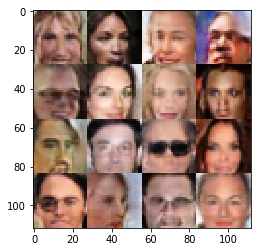

Epoch 6/10... Generator Loss: 0.3291 Discriminator Loss: 1.5788...
Epoch 6/10... Generator Loss: 0.5469 Discriminator Loss: 1.1613...
Epoch 6/10... Generator Loss: 0.3737 Discriminator Loss: 1.4540...
Epoch 6/10... Generator Loss: 0.7286 Discriminator Loss: 1.1738...
Epoch 6/10... Generator Loss: 0.3325 Discriminator Loss: 1.5337...
Epoch 6/10... Generator Loss: 0.5254 Discriminator Loss: 1.2863...
Epoch 6/10... Generator Loss: 0.9801 Discriminator Loss: 0.8060...
Epoch 6/10... Generator Loss: 0.4761 Discriminator Loss: 1.2561...
Epoch 6/10... Generator Loss: 0.2448 Discriminator Loss: 1.7226...
Epoch 6/10... Generator Loss: 0.6685 Discriminator Loss: 1.3059...


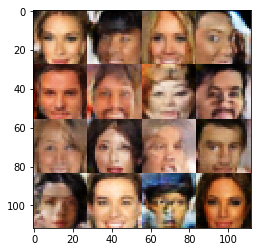

Epoch 6/10... Generator Loss: 0.9824 Discriminator Loss: 1.2765...
Epoch 6/10... Generator Loss: 0.4666 Discriminator Loss: 1.2669...
Epoch 6/10... Generator Loss: 0.8413 Discriminator Loss: 1.2209...
Epoch 6/10... Generator Loss: 1.4664 Discriminator Loss: 1.4210...
Epoch 6/10... Generator Loss: 0.4127 Discriminator Loss: 1.4150...
Epoch 6/10... Generator Loss: 0.2902 Discriminator Loss: 1.6188...
Epoch 6/10... Generator Loss: 0.3651 Discriminator Loss: 1.5700...
Epoch 6/10... Generator Loss: 0.8319 Discriminator Loss: 0.9070...
Epoch 6/10... Generator Loss: 0.8871 Discriminator Loss: 1.2863...
Epoch 6/10... Generator Loss: 0.3484 Discriminator Loss: 1.5029...


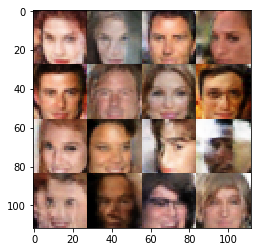

Epoch 6/10... Generator Loss: 0.2762 Discriminator Loss: 1.6049...
Epoch 6/10... Generator Loss: 0.8188 Discriminator Loss: 1.0621...
Epoch 6/10... Generator Loss: 0.2958 Discriminator Loss: 1.6677...
Epoch 6/10... Generator Loss: 0.8204 Discriminator Loss: 1.0715...
Epoch 6/10... Generator Loss: 0.4887 Discriminator Loss: 1.2286...
Epoch 6/10... Generator Loss: 0.4799 Discriminator Loss: 1.3061...
Epoch 6/10... Generator Loss: 0.7557 Discriminator Loss: 1.2488...
Epoch 6/10... Generator Loss: 0.7695 Discriminator Loss: 1.0696...
Epoch 6/10... Generator Loss: 0.3105 Discriminator Loss: 1.5520...
Epoch 6/10... Generator Loss: 0.3817 Discriminator Loss: 1.4052...


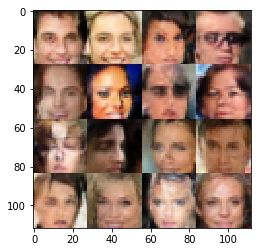

Epoch 6/10... Generator Loss: 0.4849 Discriminator Loss: 1.2976...
Epoch 6/10... Generator Loss: 0.6444 Discriminator Loss: 1.2113...
Epoch 6/10... Generator Loss: 0.6070 Discriminator Loss: 1.2838...
Epoch 6/10... Generator Loss: 0.3550 Discriminator Loss: 1.4833...
Epoch 6/10... Generator Loss: 0.4969 Discriminator Loss: 1.5144...
Epoch 6/10... Generator Loss: 0.4400 Discriminator Loss: 1.3672...
Epoch 6/10... Generator Loss: 0.5714 Discriminator Loss: 1.3842...
Epoch 6/10... Generator Loss: 0.2203 Discriminator Loss: 1.8550...
Epoch 6/10... Generator Loss: 0.5646 Discriminator Loss: 1.3289...
Epoch 6/10... Generator Loss: 1.0299 Discriminator Loss: 1.0923...


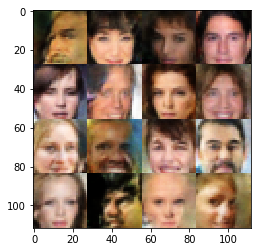

Epoch 6/10... Generator Loss: 0.4723 Discriminator Loss: 1.3302...
Epoch 6/10... Generator Loss: 0.6301 Discriminator Loss: 1.3432...
Epoch 6/10... Generator Loss: 0.5148 Discriminator Loss: 1.4297...
Epoch 6/10... Generator Loss: 0.5265 Discriminator Loss: 1.2344...
Epoch 6/10... Generator Loss: 0.5540 Discriminator Loss: 1.3310...
Epoch 6/10... Generator Loss: 0.5137 Discriminator Loss: 1.2832...
Epoch 6/10... Generator Loss: 0.5605 Discriminator Loss: 1.2660...
Epoch 6/10... Generator Loss: 0.3500 Discriminator Loss: 1.5269...
Epoch 6/10... Generator Loss: 0.4499 Discriminator Loss: 1.3435...
Epoch 6/10... Generator Loss: 0.3810 Discriminator Loss: 1.3643...


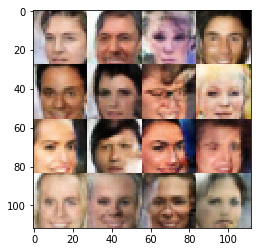

Epoch 6/10... Generator Loss: 0.6758 Discriminator Loss: 1.2491...
Epoch 6/10... Generator Loss: 0.3201 Discriminator Loss: 1.6001...
Epoch 6/10... Generator Loss: 0.7565 Discriminator Loss: 1.3544...
Epoch 6/10... Generator Loss: 0.6241 Discriminator Loss: 1.1849...
Epoch 6/10... Generator Loss: 0.5525 Discriminator Loss: 1.2487...
Epoch 6/10... Generator Loss: 1.0249 Discriminator Loss: 1.3468...
Epoch 6/10... Generator Loss: 0.7420 Discriminator Loss: 1.0894...
Epoch 6/10... Generator Loss: 0.3970 Discriminator Loss: 1.6425...
Epoch 6/10... Generator Loss: 0.7078 Discriminator Loss: 1.2276...
Epoch 6/10... Generator Loss: 1.2375 Discriminator Loss: 0.9067...


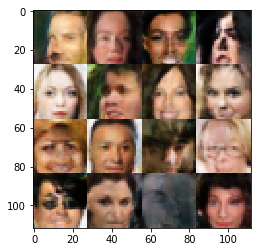

Epoch 6/10... Generator Loss: 0.3654 Discriminator Loss: 1.5522...
Epoch 6/10... Generator Loss: 0.5677 Discriminator Loss: 1.3403...
Epoch 6/10... Generator Loss: 0.8062 Discriminator Loss: 1.0933...
Epoch 6/10... Generator Loss: 0.4003 Discriminator Loss: 1.4434...
Epoch 6/10... Generator Loss: 0.7656 Discriminator Loss: 1.1573...
Epoch 6/10... Generator Loss: 0.6396 Discriminator Loss: 1.1530...
Epoch 6/10... Generator Loss: 0.2779 Discriminator Loss: 1.6488...
Epoch 6/10... Generator Loss: 0.4261 Discriminator Loss: 1.3313...
Epoch 6/10... Generator Loss: 0.2241 Discriminator Loss: 1.8504...
Epoch 6/10... Generator Loss: 0.5340 Discriminator Loss: 1.3415...


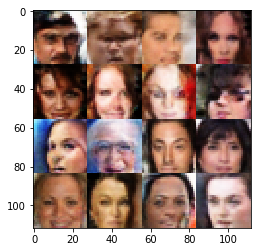

Epoch 6/10... Generator Loss: 0.8459 Discriminator Loss: 1.2885...
Epoch 6/10... Generator Loss: 0.7314 Discriminator Loss: 1.0347...
Epoch 6/10... Generator Loss: 0.7339 Discriminator Loss: 1.1685...
Epoch 6/10... Generator Loss: 0.3781 Discriminator Loss: 1.4827...
Epoch 6/10... Generator Loss: 0.4084 Discriminator Loss: 1.4452...
Epoch 6/10... Generator Loss: 0.3219 Discriminator Loss: 1.4816...
Epoch 6/10... Generator Loss: 0.6466 Discriminator Loss: 1.1310...
Epoch 6/10... Generator Loss: 0.6104 Discriminator Loss: 1.3212...
Epoch 6/10... Generator Loss: 0.4719 Discriminator Loss: 1.4470...
Epoch 6/10... Generator Loss: 0.5723 Discriminator Loss: 1.2777...


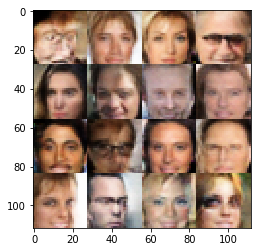

Epoch 6/10... Generator Loss: 0.5143 Discriminator Loss: 1.2092...
Epoch 6/10... Generator Loss: 0.3034 Discriminator Loss: 1.5920...
Epoch 6/10... Generator Loss: 0.7439 Discriminator Loss: 1.2082...
Epoch 6/10... Generator Loss: 0.9246 Discriminator Loss: 1.1680...
Epoch 6/10... Generator Loss: 0.7388 Discriminator Loss: 1.2059...
Epoch 6/10... Generator Loss: 0.3398 Discriminator Loss: 1.5168...
Epoch 6/10... Generator Loss: 0.4623 Discriminator Loss: 1.4401...
Epoch 6/10... Generator Loss: 0.7134 Discriminator Loss: 1.0051...
Epoch 6/10... Generator Loss: 0.4303 Discriminator Loss: 1.3637...
Epoch 6/10... Generator Loss: 0.8436 Discriminator Loss: 0.9594...


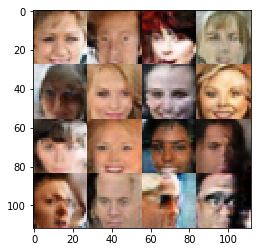

Epoch 6/10... Generator Loss: 0.7937 Discriminator Loss: 1.2883...
Epoch 6/10... Generator Loss: 0.4519 Discriminator Loss: 1.3150...
Epoch 6/10... Generator Loss: 0.3924 Discriminator Loss: 1.3677...
Epoch 6/10... Generator Loss: 0.3795 Discriminator Loss: 1.4106...
Epoch 6/10... Generator Loss: 0.8603 Discriminator Loss: 1.0728...
Epoch 6/10... Generator Loss: 0.6197 Discriminator Loss: 1.2560...
Epoch 6/10... Generator Loss: 0.6653 Discriminator Loss: 1.1856...
Epoch 6/10... Generator Loss: 0.2790 Discriminator Loss: 1.6625...
Epoch 6/10... Generator Loss: 0.7248 Discriminator Loss: 1.2885...
Epoch 6/10... Generator Loss: 0.7194 Discriminator Loss: 1.2961...


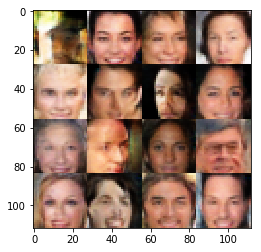

Epoch 6/10... Generator Loss: 0.8674 Discriminator Loss: 1.2787...
Epoch 6/10... Generator Loss: 0.9115 Discriminator Loss: 1.0759...
Epoch 6/10... Generator Loss: 0.7615 Discriminator Loss: 0.9788...
Epoch 6/10... Generator Loss: 0.7823 Discriminator Loss: 1.2309...
Epoch 6/10... Generator Loss: 0.5928 Discriminator Loss: 1.3224...
Epoch 6/10... Generator Loss: 0.4576 Discriminator Loss: 1.4291...
Epoch 6/10... Generator Loss: 0.8790 Discriminator Loss: 1.0294...
Epoch 6/10... Generator Loss: 0.6680 Discriminator Loss: 1.3835...
Epoch 6/10... Generator Loss: 0.5132 Discriminator Loss: 1.3809...
Epoch 6/10... Generator Loss: 0.4777 Discriminator Loss: 1.3273...


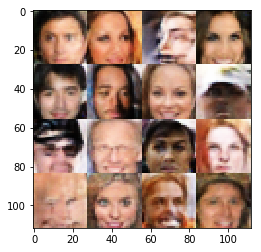

Epoch 6/10... Generator Loss: 0.6247 Discriminator Loss: 1.2257...
Epoch 6/10... Generator Loss: 0.8053 Discriminator Loss: 1.2616...
Epoch 6/10... Generator Loss: 1.3334 Discriminator Loss: 1.6100...
Epoch 6/10... Generator Loss: 0.7691 Discriminator Loss: 1.1562...
Epoch 6/10... Generator Loss: 0.3852 Discriminator Loss: 1.4723...
Epoch 6/10... Generator Loss: 0.9246 Discriminator Loss: 1.1760...
Epoch 6/10... Generator Loss: 0.4864 Discriminator Loss: 1.3547...
Epoch 6/10... Generator Loss: 0.4602 Discriminator Loss: 1.4248...
Epoch 6/10... Generator Loss: 0.4335 Discriminator Loss: 1.3678...
Epoch 6/10... Generator Loss: 0.3156 Discriminator Loss: 1.5013...


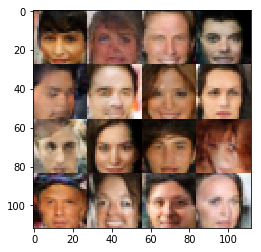

Epoch 6/10... Generator Loss: 0.3885 Discriminator Loss: 1.3901...
Epoch 6/10... Generator Loss: 0.5039 Discriminator Loss: 1.3342...
Epoch 6/10... Generator Loss: 0.5638 Discriminator Loss: 1.2683...
Epoch 6/10... Generator Loss: 0.7158 Discriminator Loss: 1.2592...
Epoch 6/10... Generator Loss: 0.7982 Discriminator Loss: 1.3636...
Epoch 6/10... Generator Loss: 0.6879 Discriminator Loss: 1.0273...
Epoch 6/10... Generator Loss: 0.3295 Discriminator Loss: 1.4589...
Epoch 6/10... Generator Loss: 1.4093 Discriminator Loss: 1.0961...
Epoch 6/10... Generator Loss: 0.5919 Discriminator Loss: 1.1571...
Epoch 6/10... Generator Loss: 0.7310 Discriminator Loss: 1.0683...


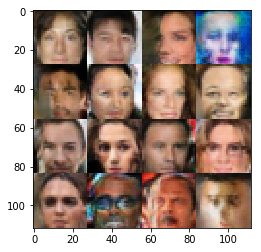

Epoch 6/10... Generator Loss: 0.4228 Discriminator Loss: 1.4011...
Epoch 6/10... Generator Loss: 0.4225 Discriminator Loss: 1.2904...
Epoch 6/10... Generator Loss: 0.3176 Discriminator Loss: 1.6444...
Epoch 6/10... Generator Loss: 0.3174 Discriminator Loss: 1.6306...
Epoch 6/10... Generator Loss: 0.3472 Discriminator Loss: 1.5346...
Epoch 6/10... Generator Loss: 0.2988 Discriminator Loss: 1.6437...
Epoch 6/10... Generator Loss: 0.5481 Discriminator Loss: 1.2524...
Epoch 6/10... Generator Loss: 0.6919 Discriminator Loss: 1.2757...
Epoch 6/10... Generator Loss: 0.4779 Discriminator Loss: 1.2828...
Epoch 6/10... Generator Loss: 0.8358 Discriminator Loss: 1.2013...


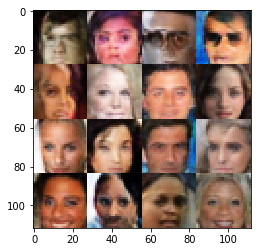

Epoch 6/10... Generator Loss: 0.6463 Discriminator Loss: 1.2456...
Epoch 6/10... Generator Loss: 0.7653 Discriminator Loss: 1.1598...
Epoch 6/10... Generator Loss: 0.1588 Discriminator Loss: 2.2156...
Epoch 6/10... Generator Loss: 0.2746 Discriminator Loss: 1.6756...
Epoch 6/10... Generator Loss: 0.3240 Discriminator Loss: 1.5583...
Epoch 6/10... Generator Loss: 0.2425 Discriminator Loss: 1.7673...
Epoch 6/10... Generator Loss: 0.9272 Discriminator Loss: 1.0408...
Epoch 6/10... Generator Loss: 0.7182 Discriminator Loss: 1.0684...
Epoch 6/10... Generator Loss: 0.2966 Discriminator Loss: 1.6044...
Epoch 6/10... Generator Loss: 0.7757 Discriminator Loss: 1.1580...


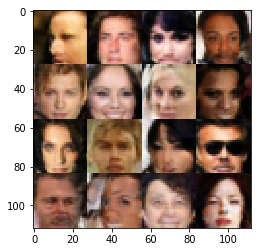

Epoch 6/10... Generator Loss: 0.4963 Discriminator Loss: 1.3192...
Epoch 6/10... Generator Loss: 0.6051 Discriminator Loss: 1.1199...
Epoch 6/10... Generator Loss: 0.3474 Discriminator Loss: 1.4492...
Epoch 6/10... Generator Loss: 0.8254 Discriminator Loss: 0.9917...
Epoch 6/10... Generator Loss: 0.4809 Discriminator Loss: 1.3333...
Epoch 6/10... Generator Loss: 0.4132 Discriminator Loss: 1.2971...
Epoch 6/10... Generator Loss: 0.4201 Discriminator Loss: 1.3244...
Epoch 6/10... Generator Loss: 0.7213 Discriminator Loss: 1.3959...
Epoch 6/10... Generator Loss: 0.5504 Discriminator Loss: 1.3359...
Epoch 7/10... Generator Loss: 0.6821 Discriminator Loss: 1.4590...


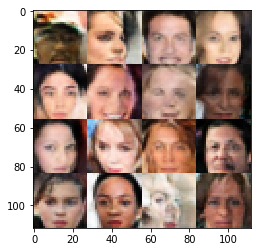

Epoch 7/10... Generator Loss: 0.5344 Discriminator Loss: 1.4269...
Epoch 7/10... Generator Loss: 0.6305 Discriminator Loss: 1.1551...
Epoch 7/10... Generator Loss: 0.5728 Discriminator Loss: 1.3542...
Epoch 7/10... Generator Loss: 0.8396 Discriminator Loss: 0.9316...
Epoch 7/10... Generator Loss: 0.8073 Discriminator Loss: 1.0932...
Epoch 7/10... Generator Loss: 0.4723 Discriminator Loss: 1.3908...
Epoch 7/10... Generator Loss: 0.6418 Discriminator Loss: 1.2077...
Epoch 7/10... Generator Loss: 0.8671 Discriminator Loss: 1.2338...
Epoch 7/10... Generator Loss: 0.9795 Discriminator Loss: 1.2210...
Epoch 7/10... Generator Loss: 0.3065 Discriminator Loss: 1.6166...


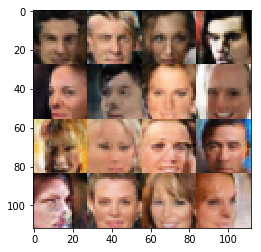

Epoch 7/10... Generator Loss: 0.5377 Discriminator Loss: 1.2172...
Epoch 7/10... Generator Loss: 0.2769 Discriminator Loss: 1.6360...
Epoch 7/10... Generator Loss: 0.8104 Discriminator Loss: 1.1367...
Epoch 7/10... Generator Loss: 0.3557 Discriminator Loss: 1.5622...
Epoch 7/10... Generator Loss: 0.5238 Discriminator Loss: 1.3031...
Epoch 7/10... Generator Loss: 0.6551 Discriminator Loss: 1.2066...
Epoch 7/10... Generator Loss: 1.0469 Discriminator Loss: 0.8394...
Epoch 7/10... Generator Loss: 0.7172 Discriminator Loss: 1.1955...
Epoch 7/10... Generator Loss: 0.9149 Discriminator Loss: 1.2164...
Epoch 7/10... Generator Loss: 0.3184 Discriminator Loss: 1.5419...


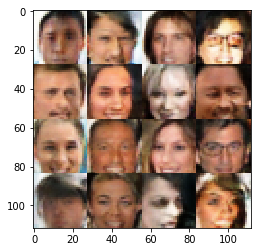

Epoch 7/10... Generator Loss: 0.9690 Discriminator Loss: 1.4680...
Epoch 7/10... Generator Loss: 0.9906 Discriminator Loss: 1.1435...
Epoch 7/10... Generator Loss: 0.8000 Discriminator Loss: 1.1300...
Epoch 7/10... Generator Loss: 0.5109 Discriminator Loss: 1.4963...
Epoch 7/10... Generator Loss: 0.7530 Discriminator Loss: 1.2435...
Epoch 7/10... Generator Loss: 0.5380 Discriminator Loss: 1.3630...
Epoch 7/10... Generator Loss: 0.8203 Discriminator Loss: 1.2105...
Epoch 7/10... Generator Loss: 0.5546 Discriminator Loss: 1.3484...
Epoch 7/10... Generator Loss: 0.5568 Discriminator Loss: 1.3057...
Epoch 7/10... Generator Loss: 0.3525 Discriminator Loss: 1.5137...


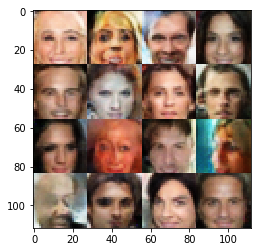

Epoch 7/10... Generator Loss: 0.5995 Discriminator Loss: 1.2404...
Epoch 7/10... Generator Loss: 0.6183 Discriminator Loss: 1.1999...
Epoch 7/10... Generator Loss: 0.3823 Discriminator Loss: 1.4605...
Epoch 7/10... Generator Loss: 0.6263 Discriminator Loss: 1.2443...
Epoch 7/10... Generator Loss: 0.5348 Discriminator Loss: 1.2435...
Epoch 7/10... Generator Loss: 0.5950 Discriminator Loss: 1.3493...
Epoch 7/10... Generator Loss: 0.3099 Discriminator Loss: 1.5951...
Epoch 7/10... Generator Loss: 0.2667 Discriminator Loss: 1.6771...
Epoch 7/10... Generator Loss: 0.4740 Discriminator Loss: 1.3206...
Epoch 7/10... Generator Loss: 0.4292 Discriminator Loss: 1.3188...


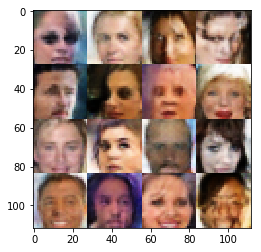

Epoch 7/10... Generator Loss: 0.4096 Discriminator Loss: 1.3249...
Epoch 7/10... Generator Loss: 0.4201 Discriminator Loss: 1.4792...
Epoch 7/10... Generator Loss: 0.8000 Discriminator Loss: 1.0428...
Epoch 7/10... Generator Loss: 0.3095 Discriminator Loss: 1.5644...
Epoch 7/10... Generator Loss: 0.6332 Discriminator Loss: 1.3035...
Epoch 7/10... Generator Loss: 0.2840 Discriminator Loss: 1.6952...
Epoch 7/10... Generator Loss: 0.3894 Discriminator Loss: 1.4651...
Epoch 7/10... Generator Loss: 0.4218 Discriminator Loss: 1.4451...
Epoch 7/10... Generator Loss: 0.4075 Discriminator Loss: 1.3336...
Epoch 7/10... Generator Loss: 0.6839 Discriminator Loss: 1.3171...


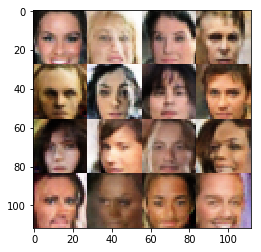

Epoch 7/10... Generator Loss: 0.3071 Discriminator Loss: 1.5545...
Epoch 7/10... Generator Loss: 0.4867 Discriminator Loss: 1.2917...
Epoch 7/10... Generator Loss: 0.4792 Discriminator Loss: 1.2809...
Epoch 7/10... Generator Loss: 0.6096 Discriminator Loss: 1.1760...
Epoch 7/10... Generator Loss: 0.3086 Discriminator Loss: 1.5597...
Epoch 7/10... Generator Loss: 0.6108 Discriminator Loss: 1.2646...
Epoch 7/10... Generator Loss: 0.9103 Discriminator Loss: 1.4775...
Epoch 7/10... Generator Loss: 0.4500 Discriminator Loss: 1.2636...
Epoch 7/10... Generator Loss: 0.3892 Discriminator Loss: 1.4488...
Epoch 7/10... Generator Loss: 0.3607 Discriminator Loss: 1.4649...


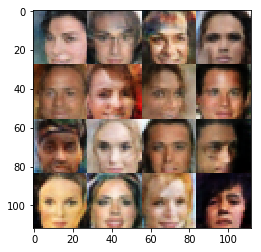

Epoch 7/10... Generator Loss: 0.6054 Discriminator Loss: 1.1577...
Epoch 7/10... Generator Loss: 0.4859 Discriminator Loss: 1.2534...
Epoch 7/10... Generator Loss: 0.3099 Discriminator Loss: 1.6393...
Epoch 7/10... Generator Loss: 1.1303 Discriminator Loss: 0.9160...
Epoch 7/10... Generator Loss: 0.4288 Discriminator Loss: 1.2814...
Epoch 7/10... Generator Loss: 0.3387 Discriminator Loss: 1.4126...
Epoch 7/10... Generator Loss: 0.3624 Discriminator Loss: 1.4662...
Epoch 7/10... Generator Loss: 0.6532 Discriminator Loss: 1.2142...
Epoch 7/10... Generator Loss: 0.3156 Discriminator Loss: 1.6217...
Epoch 7/10... Generator Loss: 0.6418 Discriminator Loss: 1.1554...


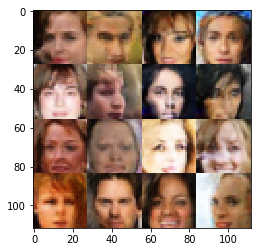

Epoch 7/10... Generator Loss: 0.9304 Discriminator Loss: 1.1733...
Epoch 7/10... Generator Loss: 0.7830 Discriminator Loss: 1.2528...
Epoch 7/10... Generator Loss: 0.3676 Discriminator Loss: 1.4580...
Epoch 7/10... Generator Loss: 0.6251 Discriminator Loss: 1.3728...
Epoch 7/10... Generator Loss: 0.4773 Discriminator Loss: 1.4501...
Epoch 7/10... Generator Loss: 0.2869 Discriminator Loss: 1.5772...
Epoch 7/10... Generator Loss: 0.5221 Discriminator Loss: 1.4148...
Epoch 7/10... Generator Loss: 0.5096 Discriminator Loss: 1.2877...
Epoch 7/10... Generator Loss: 0.2586 Discriminator Loss: 1.7364...
Epoch 7/10... Generator Loss: 0.5798 Discriminator Loss: 1.2552...


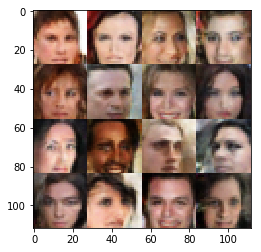

Epoch 7/10... Generator Loss: 0.4593 Discriminator Loss: 1.3697...
Epoch 7/10... Generator Loss: 0.2570 Discriminator Loss: 1.7438...
Epoch 7/10... Generator Loss: 0.4970 Discriminator Loss: 1.3036...
Epoch 7/10... Generator Loss: 0.3695 Discriminator Loss: 1.5153...
Epoch 7/10... Generator Loss: 0.5909 Discriminator Loss: 1.0792...
Epoch 7/10... Generator Loss: 0.4072 Discriminator Loss: 1.3913...
Epoch 7/10... Generator Loss: 0.4319 Discriminator Loss: 1.3879...
Epoch 7/10... Generator Loss: 0.9094 Discriminator Loss: 1.4720...
Epoch 7/10... Generator Loss: 0.6770 Discriminator Loss: 1.2724...
Epoch 7/10... Generator Loss: 0.4225 Discriminator Loss: 1.5553...


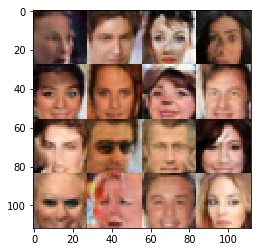

Epoch 7/10... Generator Loss: 0.2394 Discriminator Loss: 1.7693...
Epoch 7/10... Generator Loss: 0.3552 Discriminator Loss: 1.4665...
Epoch 7/10... Generator Loss: 0.3737 Discriminator Loss: 1.4955...
Epoch 7/10... Generator Loss: 0.7762 Discriminator Loss: 1.2539...
Epoch 7/10... Generator Loss: 0.7862 Discriminator Loss: 1.2237...
Epoch 7/10... Generator Loss: 0.4079 Discriminator Loss: 1.3166...
Epoch 7/10... Generator Loss: 0.4291 Discriminator Loss: 1.3900...
Epoch 7/10... Generator Loss: 0.6041 Discriminator Loss: 1.2663...
Epoch 7/10... Generator Loss: 0.4241 Discriminator Loss: 1.3579...
Epoch 7/10... Generator Loss: 0.4880 Discriminator Loss: 1.4246...


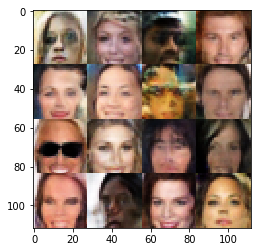

Epoch 7/10... Generator Loss: 0.8135 Discriminator Loss: 1.3408...
Epoch 7/10... Generator Loss: 0.9947 Discriminator Loss: 1.0316...
Epoch 7/10... Generator Loss: 0.4809 Discriminator Loss: 1.3826...
Epoch 7/10... Generator Loss: 0.4150 Discriminator Loss: 1.4105...
Epoch 7/10... Generator Loss: 1.0896 Discriminator Loss: 1.1528...
Epoch 7/10... Generator Loss: 0.8439 Discriminator Loss: 1.3502...
Epoch 7/10... Generator Loss: 0.2507 Discriminator Loss: 1.7425...
Epoch 7/10... Generator Loss: 0.6053 Discriminator Loss: 1.2753...
Epoch 7/10... Generator Loss: 0.6785 Discriminator Loss: 1.1641...
Epoch 7/10... Generator Loss: 0.5311 Discriminator Loss: 1.3009...


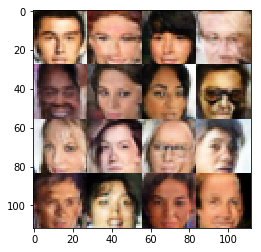

Epoch 7/10... Generator Loss: 0.5113 Discriminator Loss: 1.4003...
Epoch 7/10... Generator Loss: 0.6056 Discriminator Loss: 1.1292...
Epoch 7/10... Generator Loss: 0.8548 Discriminator Loss: 1.2218...
Epoch 7/10... Generator Loss: 0.2635 Discriminator Loss: 1.7395...
Epoch 7/10... Generator Loss: 0.4776 Discriminator Loss: 1.3150...
Epoch 7/10... Generator Loss: 0.1838 Discriminator Loss: 2.0427...
Epoch 7/10... Generator Loss: 0.4576 Discriminator Loss: 1.2676...
Epoch 7/10... Generator Loss: 1.0543 Discriminator Loss: 1.1735...
Epoch 7/10... Generator Loss: 0.9760 Discriminator Loss: 1.3601...
Epoch 7/10... Generator Loss: 0.7955 Discriminator Loss: 1.2271...


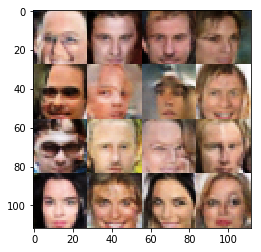

Epoch 7/10... Generator Loss: 0.7642 Discriminator Loss: 1.2689...
Epoch 7/10... Generator Loss: 0.8996 Discriminator Loss: 1.4749...
Epoch 7/10... Generator Loss: 0.6232 Discriminator Loss: 1.1563...
Epoch 7/10... Generator Loss: 0.3829 Discriminator Loss: 1.5013...
Epoch 7/10... Generator Loss: 0.6681 Discriminator Loss: 1.2304...
Epoch 7/10... Generator Loss: 0.8114 Discriminator Loss: 0.9994...
Epoch 7/10... Generator Loss: 0.8971 Discriminator Loss: 1.0032...
Epoch 7/10... Generator Loss: 0.4051 Discriminator Loss: 1.4238...
Epoch 7/10... Generator Loss: 0.8834 Discriminator Loss: 1.3222...
Epoch 7/10... Generator Loss: 1.0429 Discriminator Loss: 1.4405...


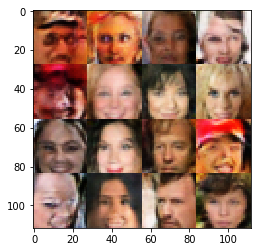

Epoch 7/10... Generator Loss: 0.3813 Discriminator Loss: 1.4720...
Epoch 7/10... Generator Loss: 0.3797 Discriminator Loss: 1.4733...
Epoch 7/10... Generator Loss: 0.4492 Discriminator Loss: 1.2677...
Epoch 7/10... Generator Loss: 0.6084 Discriminator Loss: 1.3203...
Epoch 7/10... Generator Loss: 0.6849 Discriminator Loss: 1.0938...
Epoch 7/10... Generator Loss: 0.1852 Discriminator Loss: 1.9589...
Epoch 7/10... Generator Loss: 0.3985 Discriminator Loss: 1.3212...
Epoch 7/10... Generator Loss: 0.3059 Discriminator Loss: 1.5835...
Epoch 7/10... Generator Loss: 0.8636 Discriminator Loss: 1.2350...
Epoch 7/10... Generator Loss: 0.3505 Discriminator Loss: 1.5187...


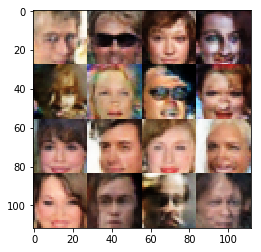

Epoch 7/10... Generator Loss: 0.5178 Discriminator Loss: 1.2646...
Epoch 7/10... Generator Loss: 0.7016 Discriminator Loss: 1.0824...
Epoch 7/10... Generator Loss: 0.2874 Discriminator Loss: 1.6236...
Epoch 7/10... Generator Loss: 0.3975 Discriminator Loss: 1.4971...
Epoch 7/10... Generator Loss: 0.2385 Discriminator Loss: 1.6955...
Epoch 7/10... Generator Loss: 0.3115 Discriminator Loss: 1.6307...
Epoch 7/10... Generator Loss: 0.5058 Discriminator Loss: 1.2404...
Epoch 7/10... Generator Loss: 0.3436 Discriminator Loss: 1.4745...
Epoch 7/10... Generator Loss: 0.3872 Discriminator Loss: 1.4973...
Epoch 7/10... Generator Loss: 0.5215 Discriminator Loss: 1.3344...


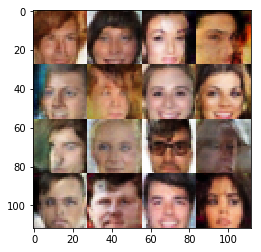

Epoch 7/10... Generator Loss: 0.6081 Discriminator Loss: 1.0408...
Epoch 7/10... Generator Loss: 0.6694 Discriminator Loss: 1.2309...
Epoch 7/10... Generator Loss: 0.4830 Discriminator Loss: 1.3016...
Epoch 7/10... Generator Loss: 1.0632 Discriminator Loss: 0.9970...
Epoch 7/10... Generator Loss: 0.5717 Discriminator Loss: 1.1553...
Epoch 7/10... Generator Loss: 0.8738 Discriminator Loss: 1.5169...
Epoch 7/10... Generator Loss: 0.2543 Discriminator Loss: 1.7251...
Epoch 7/10... Generator Loss: 0.3389 Discriminator Loss: 1.5603...
Epoch 7/10... Generator Loss: 0.8517 Discriminator Loss: 1.0855...
Epoch 7/10... Generator Loss: 0.4150 Discriminator Loss: 1.4043...


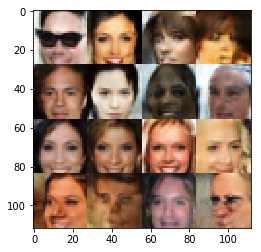

Epoch 7/10... Generator Loss: 0.5624 Discriminator Loss: 1.1594...
Epoch 7/10... Generator Loss: 1.0198 Discriminator Loss: 1.2577...
Epoch 7/10... Generator Loss: 0.6230 Discriminator Loss: 1.1304...
Epoch 7/10... Generator Loss: 0.2971 Discriminator Loss: 1.4995...
Epoch 7/10... Generator Loss: 0.7870 Discriminator Loss: 1.5389...
Epoch 7/10... Generator Loss: 0.8658 Discriminator Loss: 0.8292...
Epoch 7/10... Generator Loss: 0.4729 Discriminator Loss: 1.2591...
Epoch 7/10... Generator Loss: 0.4058 Discriminator Loss: 1.3929...
Epoch 7/10... Generator Loss: 0.5582 Discriminator Loss: 1.1816...
Epoch 7/10... Generator Loss: 0.5632 Discriminator Loss: 1.2336...


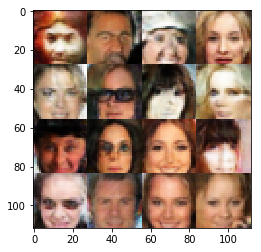

Epoch 7/10... Generator Loss: 0.5618 Discriminator Loss: 1.3853...
Epoch 7/10... Generator Loss: 0.7464 Discriminator Loss: 1.1036...
Epoch 7/10... Generator Loss: 0.8717 Discriminator Loss: 1.1246...
Epoch 7/10... Generator Loss: 1.0190 Discriminator Loss: 1.4585...
Epoch 7/10... Generator Loss: 0.4935 Discriminator Loss: 1.2605...
Epoch 7/10... Generator Loss: 0.3400 Discriminator Loss: 1.5478...
Epoch 7/10... Generator Loss: 0.3916 Discriminator Loss: 1.4513...
Epoch 7/10... Generator Loss: 0.4084 Discriminator Loss: 1.6160...
Epoch 7/10... Generator Loss: 0.5342 Discriminator Loss: 1.2060...
Epoch 7/10... Generator Loss: 0.3694 Discriminator Loss: 1.6105...


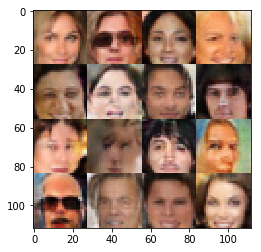

Epoch 7/10... Generator Loss: 0.2548 Discriminator Loss: 1.7446...
Epoch 7/10... Generator Loss: 0.9499 Discriminator Loss: 1.2457...
Epoch 7/10... Generator Loss: 0.4500 Discriminator Loss: 1.3451...
Epoch 7/10... Generator Loss: 0.7982 Discriminator Loss: 1.0805...
Epoch 7/10... Generator Loss: 0.5551 Discriminator Loss: 1.3252...
Epoch 7/10... Generator Loss: 0.3680 Discriminator Loss: 1.5308...
Epoch 7/10... Generator Loss: 0.8605 Discriminator Loss: 1.1804...
Epoch 7/10... Generator Loss: 0.8378 Discriminator Loss: 1.0682...
Epoch 7/10... Generator Loss: 0.4279 Discriminator Loss: 1.3822...
Epoch 7/10... Generator Loss: 0.5071 Discriminator Loss: 1.1862...


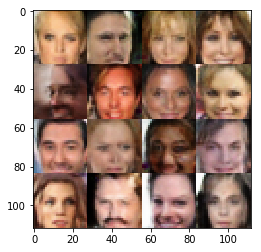

Epoch 7/10... Generator Loss: 0.8433 Discriminator Loss: 1.2272...
Epoch 7/10... Generator Loss: 0.6368 Discriminator Loss: 1.2420...
Epoch 7/10... Generator Loss: 0.3369 Discriminator Loss: 1.4763...
Epoch 7/10... Generator Loss: 0.2744 Discriminator Loss: 1.6611...
Epoch 7/10... Generator Loss: 0.2624 Discriminator Loss: 1.6994...
Epoch 7/10... Generator Loss: 0.5048 Discriminator Loss: 1.3322...
Epoch 7/10... Generator Loss: 0.3725 Discriminator Loss: 1.4301...
Epoch 7/10... Generator Loss: 0.4707 Discriminator Loss: 1.4029...
Epoch 7/10... Generator Loss: 0.6411 Discriminator Loss: 1.3605...
Epoch 7/10... Generator Loss: 0.5027 Discriminator Loss: 1.2973...


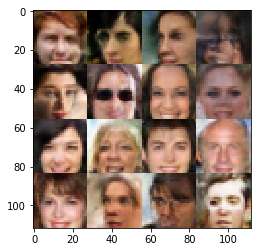

Epoch 7/10... Generator Loss: 0.3936 Discriminator Loss: 1.4550...
Epoch 7/10... Generator Loss: 0.6481 Discriminator Loss: 1.1906...
Epoch 7/10... Generator Loss: 1.0477 Discriminator Loss: 1.4882...
Epoch 7/10... Generator Loss: 0.7868 Discriminator Loss: 1.3907...
Epoch 7/10... Generator Loss: 0.5709 Discriminator Loss: 1.3102...
Epoch 7/10... Generator Loss: 0.3548 Discriminator Loss: 1.5975...
Epoch 7/10... Generator Loss: 0.3624 Discriminator Loss: 1.4382...
Epoch 7/10... Generator Loss: 0.8077 Discriminator Loss: 1.0323...
Epoch 7/10... Generator Loss: 0.7806 Discriminator Loss: 1.1415...
Epoch 7/10... Generator Loss: 0.2555 Discriminator Loss: 1.8218...


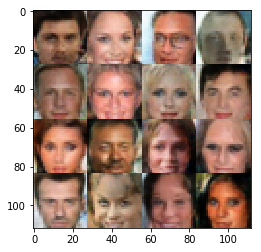

Epoch 7/10... Generator Loss: 0.5782 Discriminator Loss: 1.3398...
Epoch 7/10... Generator Loss: 0.6012 Discriminator Loss: 1.1897...
Epoch 7/10... Generator Loss: 0.4998 Discriminator Loss: 1.1630...
Epoch 7/10... Generator Loss: 0.4641 Discriminator Loss: 1.3356...
Epoch 7/10... Generator Loss: 0.6679 Discriminator Loss: 1.1421...
Epoch 7/10... Generator Loss: 0.2895 Discriminator Loss: 1.6881...
Epoch 7/10... Generator Loss: 0.2459 Discriminator Loss: 1.7441...
Epoch 7/10... Generator Loss: 0.3406 Discriminator Loss: 1.5408...
Epoch 7/10... Generator Loss: 0.4316 Discriminator Loss: 1.4102...
Epoch 7/10... Generator Loss: 0.3123 Discriminator Loss: 1.5190...


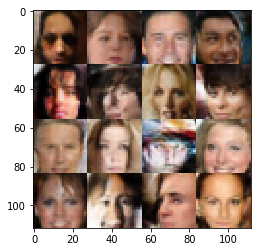

Epoch 7/10... Generator Loss: 0.7339 Discriminator Loss: 1.3182...
Epoch 7/10... Generator Loss: 0.2290 Discriminator Loss: 1.7797...
Epoch 7/10... Generator Loss: 0.6177 Discriminator Loss: 1.1469...
Epoch 7/10... Generator Loss: 0.3798 Discriminator Loss: 1.5706...
Epoch 7/10... Generator Loss: 0.5375 Discriminator Loss: 1.2177...
Epoch 7/10... Generator Loss: 0.3666 Discriminator Loss: 1.4823...
Epoch 7/10... Generator Loss: 0.8918 Discriminator Loss: 1.1512...
Epoch 7/10... Generator Loss: 0.8948 Discriminator Loss: 1.3842...
Epoch 7/10... Generator Loss: 0.4379 Discriminator Loss: 1.3752...
Epoch 7/10... Generator Loss: 0.3438 Discriminator Loss: 1.4782...


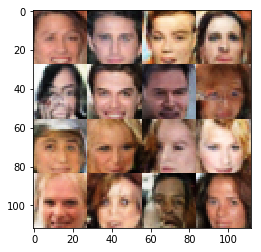

Epoch 7/10... Generator Loss: 0.5703 Discriminator Loss: 1.2362...
Epoch 7/10... Generator Loss: 0.3038 Discriminator Loss: 1.6460...
Epoch 7/10... Generator Loss: 0.5941 Discriminator Loss: 1.3166...
Epoch 7/10... Generator Loss: 0.4450 Discriminator Loss: 1.3474...
Epoch 7/10... Generator Loss: 0.3901 Discriminator Loss: 1.4659...
Epoch 7/10... Generator Loss: 0.2828 Discriminator Loss: 1.6515...
Epoch 7/10... Generator Loss: 0.6976 Discriminator Loss: 1.2205...
Epoch 7/10... Generator Loss: 0.4033 Discriminator Loss: 1.5182...
Epoch 7/10... Generator Loss: 0.6917 Discriminator Loss: 1.1042...
Epoch 7/10... Generator Loss: 0.7512 Discriminator Loss: 1.4159...


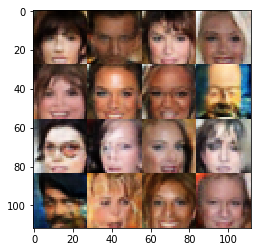

Epoch 7/10... Generator Loss: 0.9711 Discriminator Loss: 1.1029...
Epoch 7/10... Generator Loss: 0.4848 Discriminator Loss: 1.3007...
Epoch 7/10... Generator Loss: 0.5741 Discriminator Loss: 1.2792...
Epoch 7/10... Generator Loss: 0.2822 Discriminator Loss: 1.6675...
Epoch 7/10... Generator Loss: 0.3726 Discriminator Loss: 1.4793...
Epoch 7/10... Generator Loss: 0.3344 Discriminator Loss: 1.4700...
Epoch 7/10... Generator Loss: 0.3794 Discriminator Loss: 1.4720...
Epoch 7/10... Generator Loss: 0.7417 Discriminator Loss: 0.8743...
Epoch 7/10... Generator Loss: 0.5672 Discriminator Loss: 1.2582...
Epoch 7/10... Generator Loss: 0.6442 Discriminator Loss: 1.2951...


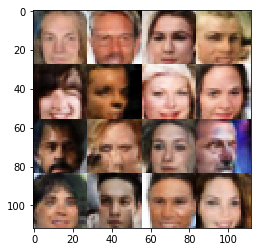

Epoch 7/10... Generator Loss: 0.7985 Discriminator Loss: 1.5406...
Epoch 7/10... Generator Loss: 0.8387 Discriminator Loss: 1.0899...
Epoch 7/10... Generator Loss: 0.3231 Discriminator Loss: 1.5687...
Epoch 7/10... Generator Loss: 0.5062 Discriminator Loss: 1.2895...
Epoch 7/10... Generator Loss: 0.6617 Discriminator Loss: 1.1039...
Epoch 7/10... Generator Loss: 0.7236 Discriminator Loss: 1.2122...
Epoch 7/10... Generator Loss: 0.4062 Discriminator Loss: 1.3917...
Epoch 7/10... Generator Loss: 0.3388 Discriminator Loss: 1.4055...
Epoch 7/10... Generator Loss: 0.4425 Discriminator Loss: 1.2877...
Epoch 7/10... Generator Loss: 0.6626 Discriminator Loss: 1.2334...


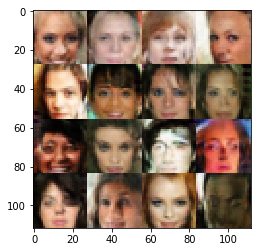

Epoch 7/10... Generator Loss: 0.6796 Discriminator Loss: 1.2193...
Epoch 7/10... Generator Loss: 0.6966 Discriminator Loss: 1.2268...
Epoch 7/10... Generator Loss: 0.8865 Discriminator Loss: 1.0274...
Epoch 7/10... Generator Loss: 0.6452 Discriminator Loss: 1.2357...
Epoch 7/10... Generator Loss: 0.6600 Discriminator Loss: 1.0701...
Epoch 7/10... Generator Loss: 0.3067 Discriminator Loss: 1.5535...
Epoch 7/10... Generator Loss: 0.5394 Discriminator Loss: 1.3398...
Epoch 7/10... Generator Loss: 0.5414 Discriminator Loss: 1.3092...
Epoch 7/10... Generator Loss: 0.5064 Discriminator Loss: 1.2511...
Epoch 7/10... Generator Loss: 0.9202 Discriminator Loss: 1.1488...


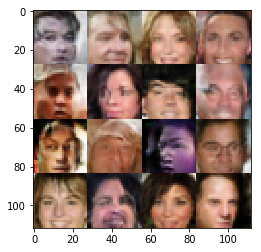

Epoch 7/10... Generator Loss: 0.6451 Discriminator Loss: 1.2395...
Epoch 7/10... Generator Loss: 0.2419 Discriminator Loss: 1.7766...
Epoch 7/10... Generator Loss: 0.3036 Discriminator Loss: 1.5694...
Epoch 7/10... Generator Loss: 0.4576 Discriminator Loss: 1.3987...
Epoch 7/10... Generator Loss: 1.2116 Discriminator Loss: 1.5388...
Epoch 7/10... Generator Loss: 0.5025 Discriminator Loss: 1.3631...
Epoch 7/10... Generator Loss: 0.3484 Discriminator Loss: 1.7038...
Epoch 7/10... Generator Loss: 0.5266 Discriminator Loss: 1.3000...
Epoch 7/10... Generator Loss: 0.2912 Discriminator Loss: 1.7252...
Epoch 7/10... Generator Loss: 0.4729 Discriminator Loss: 1.3598...


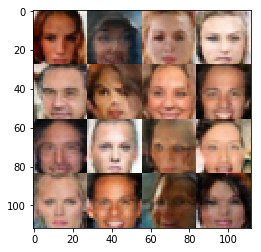

Epoch 7/10... Generator Loss: 0.4372 Discriminator Loss: 1.4352...
Epoch 7/10... Generator Loss: 0.4864 Discriminator Loss: 1.2637...
Epoch 7/10... Generator Loss: 1.0724 Discriminator Loss: 1.1734...
Epoch 7/10... Generator Loss: 0.5721 Discriminator Loss: 1.2560...
Epoch 7/10... Generator Loss: 0.5371 Discriminator Loss: 1.2230...
Epoch 7/10... Generator Loss: 0.4511 Discriminator Loss: 1.3902...
Epoch 7/10... Generator Loss: 0.3091 Discriminator Loss: 1.5721...
Epoch 7/10... Generator Loss: 0.5416 Discriminator Loss: 1.4067...
Epoch 7/10... Generator Loss: 0.7551 Discriminator Loss: 1.4677...
Epoch 7/10... Generator Loss: 0.7259 Discriminator Loss: 1.0755...


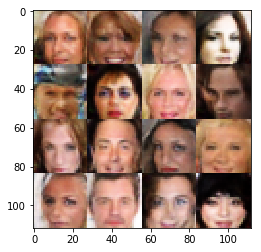

Epoch 7/10... Generator Loss: 0.8418 Discriminator Loss: 1.4772...
Epoch 7/10... Generator Loss: 0.6075 Discriminator Loss: 1.1413...
Epoch 7/10... Generator Loss: 0.6541 Discriminator Loss: 1.2330...
Epoch 7/10... Generator Loss: 0.3812 Discriminator Loss: 1.4640...
Epoch 7/10... Generator Loss: 0.3906 Discriminator Loss: 1.4713...
Epoch 7/10... Generator Loss: 0.3285 Discriminator Loss: 1.5845...
Epoch 7/10... Generator Loss: 0.3305 Discriminator Loss: 1.4713...
Epoch 7/10... Generator Loss: 0.3378 Discriminator Loss: 1.5636...
Epoch 7/10... Generator Loss: 0.4260 Discriminator Loss: 1.4027...
Epoch 7/10... Generator Loss: 0.3689 Discriminator Loss: 1.3697...


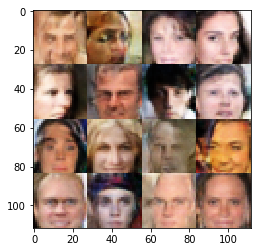

Epoch 7/10... Generator Loss: 0.4831 Discriminator Loss: 1.2636...
Epoch 7/10... Generator Loss: 0.6707 Discriminator Loss: 1.2125...
Epoch 7/10... Generator Loss: 0.8954 Discriminator Loss: 1.1245...
Epoch 7/10... Generator Loss: 0.2552 Discriminator Loss: 1.7306...
Epoch 7/10... Generator Loss: 0.8433 Discriminator Loss: 0.8900...
Epoch 7/10... Generator Loss: 0.7101 Discriminator Loss: 1.2593...
Epoch 7/10... Generator Loss: 0.4468 Discriminator Loss: 1.3853...
Epoch 7/10... Generator Loss: 0.4225 Discriminator Loss: 1.3673...
Epoch 7/10... Generator Loss: 0.6927 Discriminator Loss: 1.1662...
Epoch 7/10... Generator Loss: 0.4961 Discriminator Loss: 1.3011...


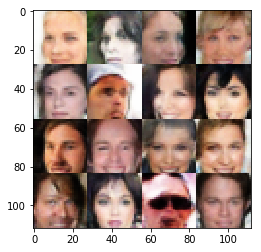

Epoch 7/10... Generator Loss: 0.3863 Discriminator Loss: 1.4189...
Epoch 7/10... Generator Loss: 0.3156 Discriminator Loss: 1.6177...
Epoch 7/10... Generator Loss: 0.4156 Discriminator Loss: 1.4067...
Epoch 7/10... Generator Loss: 0.4131 Discriminator Loss: 1.3595...
Epoch 7/10... Generator Loss: 0.2281 Discriminator Loss: 1.7949...
Epoch 8/10... Generator Loss: 0.4222 Discriminator Loss: 1.3720...
Epoch 8/10... Generator Loss: 0.4982 Discriminator Loss: 1.3015...
Epoch 8/10... Generator Loss: 0.5572 Discriminator Loss: 1.2556...
Epoch 8/10... Generator Loss: 0.5388 Discriminator Loss: 1.2775...
Epoch 8/10... Generator Loss: 1.0691 Discriminator Loss: 1.0141...


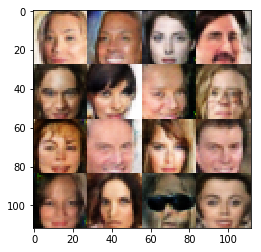

Epoch 8/10... Generator Loss: 0.4863 Discriminator Loss: 1.3781...
Epoch 8/10... Generator Loss: 0.7759 Discriminator Loss: 1.0669...
Epoch 8/10... Generator Loss: 0.3812 Discriminator Loss: 1.4230...
Epoch 8/10... Generator Loss: 0.9076 Discriminator Loss: 1.0161...
Epoch 8/10... Generator Loss: 0.2668 Discriminator Loss: 1.7436...
Epoch 8/10... Generator Loss: 0.4146 Discriminator Loss: 1.3970...
Epoch 8/10... Generator Loss: 0.5997 Discriminator Loss: 1.2836...
Epoch 8/10... Generator Loss: 0.4357 Discriminator Loss: 1.3040...
Epoch 8/10... Generator Loss: 1.1746 Discriminator Loss: 0.9603...
Epoch 8/10... Generator Loss: 0.7841 Discriminator Loss: 1.0760...


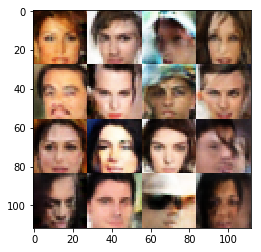

Epoch 8/10... Generator Loss: 0.4027 Discriminator Loss: 1.3368...
Epoch 8/10... Generator Loss: 0.6610 Discriminator Loss: 1.2502...
Epoch 8/10... Generator Loss: 0.4135 Discriminator Loss: 1.4994...
Epoch 8/10... Generator Loss: 0.3164 Discriminator Loss: 1.4930...
Epoch 8/10... Generator Loss: 0.8405 Discriminator Loss: 1.0679...
Epoch 8/10... Generator Loss: 0.6648 Discriminator Loss: 1.3836...
Epoch 8/10... Generator Loss: 0.3466 Discriminator Loss: 1.5497...
Epoch 8/10... Generator Loss: 0.5239 Discriminator Loss: 1.2755...
Epoch 8/10... Generator Loss: 0.3675 Discriminator Loss: 1.4677...
Epoch 8/10... Generator Loss: 0.7701 Discriminator Loss: 1.1265...


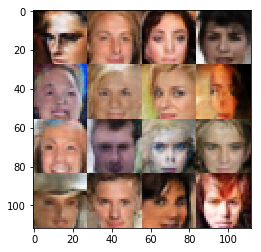

Epoch 8/10... Generator Loss: 0.6881 Discriminator Loss: 1.1653...
Epoch 8/10... Generator Loss: 0.4114 Discriminator Loss: 1.4182...
Epoch 8/10... Generator Loss: 0.7050 Discriminator Loss: 1.2680...
Epoch 8/10... Generator Loss: 0.7630 Discriminator Loss: 1.1870...
Epoch 8/10... Generator Loss: 0.7930 Discriminator Loss: 1.3675...
Epoch 8/10... Generator Loss: 0.8161 Discriminator Loss: 1.0891...
Epoch 8/10... Generator Loss: 0.5391 Discriminator Loss: 1.2289...
Epoch 8/10... Generator Loss: 0.8402 Discriminator Loss: 1.2402...
Epoch 8/10... Generator Loss: 0.4516 Discriminator Loss: 1.3830...
Epoch 8/10... Generator Loss: 0.3744 Discriminator Loss: 1.4311...


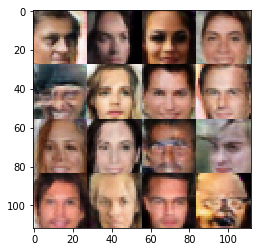

Epoch 8/10... Generator Loss: 0.2501 Discriminator Loss: 1.7202...
Epoch 8/10... Generator Loss: 0.5128 Discriminator Loss: 1.2370...
Epoch 8/10... Generator Loss: 0.9129 Discriminator Loss: 1.3933...
Epoch 8/10... Generator Loss: 0.4645 Discriminator Loss: 1.4652...
Epoch 8/10... Generator Loss: 0.5693 Discriminator Loss: 1.4193...
Epoch 8/10... Generator Loss: 1.0972 Discriminator Loss: 1.0814...
Epoch 8/10... Generator Loss: 0.4288 Discriminator Loss: 1.3497...
Epoch 8/10... Generator Loss: 0.4183 Discriminator Loss: 1.4101...
Epoch 8/10... Generator Loss: 1.1243 Discriminator Loss: 1.4846...
Epoch 8/10... Generator Loss: 0.4508 Discriminator Loss: 1.3382...


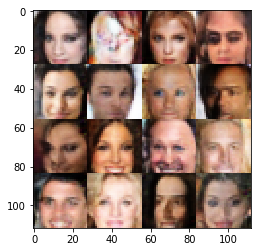

Epoch 8/10... Generator Loss: 0.4215 Discriminator Loss: 1.3876...
Epoch 8/10... Generator Loss: 0.5213 Discriminator Loss: 1.4184...
Epoch 8/10... Generator Loss: 0.8311 Discriminator Loss: 1.1757...
Epoch 8/10... Generator Loss: 0.4510 Discriminator Loss: 1.3307...
Epoch 8/10... Generator Loss: 0.3088 Discriminator Loss: 1.6124...
Epoch 8/10... Generator Loss: 0.5811 Discriminator Loss: 1.1914...
Epoch 8/10... Generator Loss: 0.9151 Discriminator Loss: 1.1159...
Epoch 8/10... Generator Loss: 0.6257 Discriminator Loss: 1.2707...
Epoch 8/10... Generator Loss: 0.5562 Discriminator Loss: 1.2199...
Epoch 8/10... Generator Loss: 0.3916 Discriminator Loss: 1.6518...


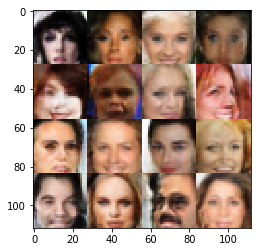

Epoch 8/10... Generator Loss: 1.0246 Discriminator Loss: 1.0828...
Epoch 8/10... Generator Loss: 0.3120 Discriminator Loss: 1.6480...
Epoch 8/10... Generator Loss: 0.6746 Discriminator Loss: 1.1899...
Epoch 8/10... Generator Loss: 0.4559 Discriminator Loss: 1.4874...
Epoch 8/10... Generator Loss: 0.5728 Discriminator Loss: 1.3444...
Epoch 8/10... Generator Loss: 1.6331 Discriminator Loss: 0.9488...
Epoch 8/10... Generator Loss: 0.3055 Discriminator Loss: 1.6022...
Epoch 8/10... Generator Loss: 0.6398 Discriminator Loss: 1.1087...
Epoch 8/10... Generator Loss: 0.7315 Discriminator Loss: 1.2063...
Epoch 8/10... Generator Loss: 0.6795 Discriminator Loss: 1.3949...


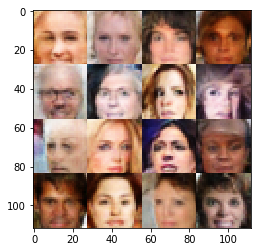

Epoch 8/10... Generator Loss: 0.9979 Discriminator Loss: 1.3050...
Epoch 8/10... Generator Loss: 0.5864 Discriminator Loss: 1.3065...
Epoch 8/10... Generator Loss: 0.3805 Discriminator Loss: 1.3859...
Epoch 8/10... Generator Loss: 0.7925 Discriminator Loss: 1.0945...
Epoch 8/10... Generator Loss: 0.2983 Discriminator Loss: 1.7024...
Epoch 8/10... Generator Loss: 0.6330 Discriminator Loss: 1.1240...
Epoch 8/10... Generator Loss: 0.5932 Discriminator Loss: 1.2041...
Epoch 8/10... Generator Loss: 0.3123 Discriminator Loss: 1.6443...
Epoch 8/10... Generator Loss: 0.3852 Discriminator Loss: 1.3716...
Epoch 8/10... Generator Loss: 0.6546 Discriminator Loss: 1.2579...


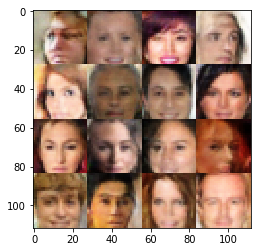

Epoch 8/10... Generator Loss: 0.3700 Discriminator Loss: 1.4739...
Epoch 8/10... Generator Loss: 0.4545 Discriminator Loss: 1.2970...
Epoch 8/10... Generator Loss: 0.3283 Discriminator Loss: 1.5337...
Epoch 8/10... Generator Loss: 0.5471 Discriminator Loss: 1.2761...
Epoch 8/10... Generator Loss: 0.8969 Discriminator Loss: 1.3136...
Epoch 8/10... Generator Loss: 1.1114 Discriminator Loss: 1.5763...
Epoch 8/10... Generator Loss: 0.5046 Discriminator Loss: 1.3534...
Epoch 8/10... Generator Loss: 0.3766 Discriminator Loss: 1.3868...
Epoch 8/10... Generator Loss: 0.3498 Discriminator Loss: 1.5088...
Epoch 8/10... Generator Loss: 0.2404 Discriminator Loss: 1.7490...


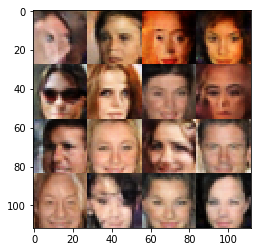

Epoch 8/10... Generator Loss: 0.3543 Discriminator Loss: 1.4678...
Epoch 8/10... Generator Loss: 0.3537 Discriminator Loss: 1.5579...
Epoch 8/10... Generator Loss: 0.7361 Discriminator Loss: 1.2730...
Epoch 8/10... Generator Loss: 0.4813 Discriminator Loss: 1.4039...
Epoch 8/10... Generator Loss: 0.2806 Discriminator Loss: 1.6295...
Epoch 8/10... Generator Loss: 0.4727 Discriminator Loss: 1.3451...
Epoch 8/10... Generator Loss: 0.4001 Discriminator Loss: 1.3985...
Epoch 8/10... Generator Loss: 0.3754 Discriminator Loss: 1.4507...
Epoch 8/10... Generator Loss: 0.2285 Discriminator Loss: 1.7768...
Epoch 8/10... Generator Loss: 0.4286 Discriminator Loss: 1.3816...


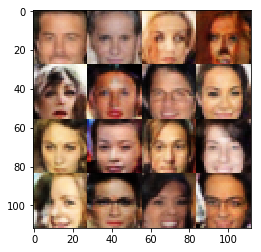

Epoch 8/10... Generator Loss: 0.5535 Discriminator Loss: 1.2530...
Epoch 8/10... Generator Loss: 0.2762 Discriminator Loss: 1.6521...
Epoch 8/10... Generator Loss: 0.2917 Discriminator Loss: 1.6336...
Epoch 8/10... Generator Loss: 0.5572 Discriminator Loss: 1.2427...
Epoch 8/10... Generator Loss: 0.2754 Discriminator Loss: 1.6218...
Epoch 8/10... Generator Loss: 0.4793 Discriminator Loss: 1.3199...
Epoch 8/10... Generator Loss: 0.7124 Discriminator Loss: 1.4031...
Epoch 8/10... Generator Loss: 0.6988 Discriminator Loss: 1.3085...
Epoch 8/10... Generator Loss: 0.3586 Discriminator Loss: 1.4708...
Epoch 8/10... Generator Loss: 0.5079 Discriminator Loss: 1.1612...


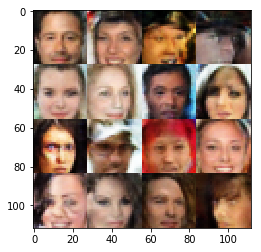

Epoch 8/10... Generator Loss: 0.4213 Discriminator Loss: 1.3246...
Epoch 8/10... Generator Loss: 0.2714 Discriminator Loss: 1.7146...
Epoch 8/10... Generator Loss: 0.3254 Discriminator Loss: 1.5141...
Epoch 8/10... Generator Loss: 0.4213 Discriminator Loss: 1.3938...
Epoch 8/10... Generator Loss: 0.3760 Discriminator Loss: 1.4585...
Epoch 8/10... Generator Loss: 0.9980 Discriminator Loss: 1.0432...
Epoch 8/10... Generator Loss: 0.2708 Discriminator Loss: 1.7804...
Epoch 8/10... Generator Loss: 0.9476 Discriminator Loss: 1.3069...
Epoch 8/10... Generator Loss: 1.1416 Discriminator Loss: 1.0874...
Epoch 8/10... Generator Loss: 0.3808 Discriminator Loss: 1.4936...


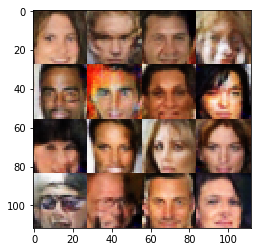

Epoch 8/10... Generator Loss: 0.5104 Discriminator Loss: 1.3849...
Epoch 8/10... Generator Loss: 0.3540 Discriminator Loss: 1.4660...
Epoch 8/10... Generator Loss: 0.5152 Discriminator Loss: 1.4220...
Epoch 8/10... Generator Loss: 0.6398 Discriminator Loss: 1.1766...
Epoch 8/10... Generator Loss: 0.1875 Discriminator Loss: 1.8818...
Epoch 8/10... Generator Loss: 0.3015 Discriminator Loss: 1.6001...
Epoch 8/10... Generator Loss: 0.6823 Discriminator Loss: 1.1397...
Epoch 8/10... Generator Loss: 0.4589 Discriminator Loss: 1.3711...
Epoch 8/10... Generator Loss: 0.3713 Discriminator Loss: 1.5064...
Epoch 8/10... Generator Loss: 0.3383 Discriminator Loss: 1.5077...


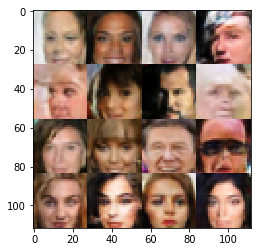

Epoch 8/10... Generator Loss: 0.3300 Discriminator Loss: 1.5247...
Epoch 8/10... Generator Loss: 0.4614 Discriminator Loss: 1.4508...
Epoch 8/10... Generator Loss: 0.5846 Discriminator Loss: 1.2574...
Epoch 8/10... Generator Loss: 0.5115 Discriminator Loss: 1.3898...
Epoch 8/10... Generator Loss: 0.3853 Discriminator Loss: 1.4943...
Epoch 8/10... Generator Loss: 0.9121 Discriminator Loss: 1.2481...
Epoch 8/10... Generator Loss: 0.2281 Discriminator Loss: 1.8485...
Epoch 8/10... Generator Loss: 0.2671 Discriminator Loss: 1.6669...
Epoch 8/10... Generator Loss: 0.5658 Discriminator Loss: 1.3125...
Epoch 8/10... Generator Loss: 0.9395 Discriminator Loss: 1.2912...


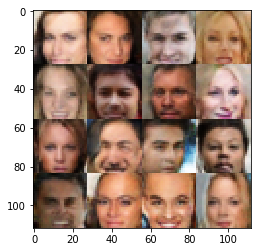

Epoch 8/10... Generator Loss: 0.4143 Discriminator Loss: 1.4074...
Epoch 8/10... Generator Loss: 0.4075 Discriminator Loss: 1.4148...
Epoch 8/10... Generator Loss: 0.4511 Discriminator Loss: 1.3573...
Epoch 8/10... Generator Loss: 0.7215 Discriminator Loss: 1.1913...
Epoch 8/10... Generator Loss: 0.4957 Discriminator Loss: 1.2989...
Epoch 8/10... Generator Loss: 0.5113 Discriminator Loss: 1.1983...
Epoch 8/10... Generator Loss: 0.3703 Discriminator Loss: 1.4450...
Epoch 8/10... Generator Loss: 0.2642 Discriminator Loss: 1.6563...
Epoch 8/10... Generator Loss: 0.7030 Discriminator Loss: 1.0294...
Epoch 8/10... Generator Loss: 0.7044 Discriminator Loss: 1.1128...


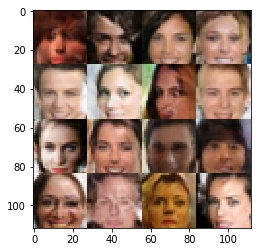

Epoch 8/10... Generator Loss: 0.9248 Discriminator Loss: 1.2465...
Epoch 8/10... Generator Loss: 0.7802 Discriminator Loss: 1.2857...
Epoch 8/10... Generator Loss: 0.7407 Discriminator Loss: 0.8729...
Epoch 8/10... Generator Loss: 0.3484 Discriminator Loss: 1.4874...
Epoch 8/10... Generator Loss: 0.3930 Discriminator Loss: 1.5664...
Epoch 8/10... Generator Loss: 0.3691 Discriminator Loss: 1.5837...
Epoch 8/10... Generator Loss: 0.7668 Discriminator Loss: 1.4732...
Epoch 8/10... Generator Loss: 0.3865 Discriminator Loss: 1.5033...
Epoch 8/10... Generator Loss: 0.9864 Discriminator Loss: 1.2386...
Epoch 8/10... Generator Loss: 0.3506 Discriminator Loss: 1.5381...


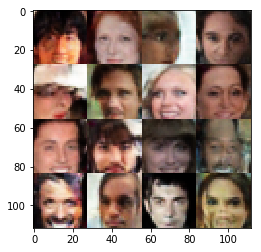

Epoch 8/10... Generator Loss: 0.5109 Discriminator Loss: 1.3352...
Epoch 8/10... Generator Loss: 0.4587 Discriminator Loss: 1.2512...
Epoch 8/10... Generator Loss: 0.4854 Discriminator Loss: 1.3849...
Epoch 8/10... Generator Loss: 0.3364 Discriminator Loss: 1.5230...
Epoch 8/10... Generator Loss: 0.3100 Discriminator Loss: 1.5967...
Epoch 8/10... Generator Loss: 0.3215 Discriminator Loss: 1.5130...
Epoch 8/10... Generator Loss: 0.8951 Discriminator Loss: 1.1558...
Epoch 8/10... Generator Loss: 0.4028 Discriminator Loss: 1.3542...
Epoch 8/10... Generator Loss: 0.6962 Discriminator Loss: 1.3980...
Epoch 8/10... Generator Loss: 0.6565 Discriminator Loss: 1.1489...


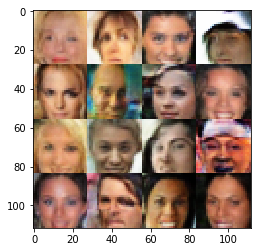

Epoch 8/10... Generator Loss: 0.3390 Discriminator Loss: 1.4467...
Epoch 8/10... Generator Loss: 0.5704 Discriminator Loss: 1.2840...
Epoch 8/10... Generator Loss: 0.7603 Discriminator Loss: 1.2569...
Epoch 8/10... Generator Loss: 0.7992 Discriminator Loss: 1.1588...
Epoch 8/10... Generator Loss: 0.5122 Discriminator Loss: 1.3078...
Epoch 8/10... Generator Loss: 0.6034 Discriminator Loss: 1.2359...
Epoch 8/10... Generator Loss: 0.3360 Discriminator Loss: 1.5164...
Epoch 8/10... Generator Loss: 1.0835 Discriminator Loss: 1.0245...
Epoch 8/10... Generator Loss: 0.3587 Discriminator Loss: 1.4795...
Epoch 8/10... Generator Loss: 0.4052 Discriminator Loss: 1.3211...


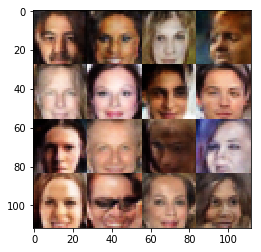

Epoch 8/10... Generator Loss: 0.2200 Discriminator Loss: 1.8231...
Epoch 8/10... Generator Loss: 0.5987 Discriminator Loss: 1.3435...
Epoch 8/10... Generator Loss: 0.2172 Discriminator Loss: 1.9077...
Epoch 8/10... Generator Loss: 0.4290 Discriminator Loss: 1.3852...
Epoch 8/10... Generator Loss: 0.9071 Discriminator Loss: 1.3362...
Epoch 8/10... Generator Loss: 0.4173 Discriminator Loss: 1.4798...
Epoch 8/10... Generator Loss: 1.3408 Discriminator Loss: 1.3801...
Epoch 8/10... Generator Loss: 0.7174 Discriminator Loss: 1.0531...
Epoch 8/10... Generator Loss: 0.3547 Discriminator Loss: 1.4385...
Epoch 8/10... Generator Loss: 0.6157 Discriminator Loss: 1.1691...


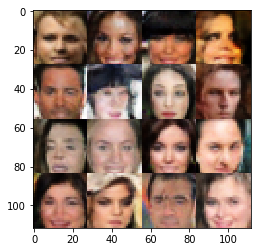

Epoch 8/10... Generator Loss: 0.3452 Discriminator Loss: 1.5429...
Epoch 8/10... Generator Loss: 0.6342 Discriminator Loss: 1.2965...
Epoch 8/10... Generator Loss: 0.3777 Discriminator Loss: 1.4494...
Epoch 8/10... Generator Loss: 0.2777 Discriminator Loss: 1.7161...
Epoch 8/10... Generator Loss: 0.9084 Discriminator Loss: 0.8984...
Epoch 8/10... Generator Loss: 0.6073 Discriminator Loss: 1.1267...
Epoch 8/10... Generator Loss: 0.3773 Discriminator Loss: 1.4302...
Epoch 8/10... Generator Loss: 0.7327 Discriminator Loss: 1.3736...
Epoch 8/10... Generator Loss: 1.1214 Discriminator Loss: 1.7228...
Epoch 8/10... Generator Loss: 0.2919 Discriminator Loss: 1.6627...


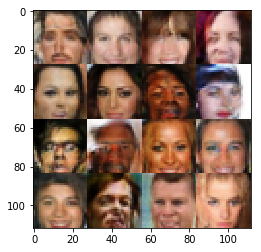

Epoch 8/10... Generator Loss: 0.2516 Discriminator Loss: 1.7612...
Epoch 8/10... Generator Loss: 0.2921 Discriminator Loss: 1.6389...
Epoch 8/10... Generator Loss: 1.0368 Discriminator Loss: 1.0996...
Epoch 8/10... Generator Loss: 0.4697 Discriminator Loss: 1.4820...
Epoch 8/10... Generator Loss: 0.5499 Discriminator Loss: 1.4724...
Epoch 8/10... Generator Loss: 0.7817 Discriminator Loss: 1.1113...
Epoch 8/10... Generator Loss: 0.5102 Discriminator Loss: 1.2365...
Epoch 8/10... Generator Loss: 0.6600 Discriminator Loss: 1.1511...
Epoch 8/10... Generator Loss: 0.6238 Discriminator Loss: 1.0750...
Epoch 8/10... Generator Loss: 1.2421 Discriminator Loss: 1.3383...


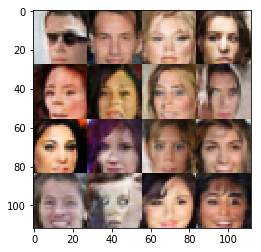

Epoch 8/10... Generator Loss: 0.3248 Discriminator Loss: 1.5783...
Epoch 8/10... Generator Loss: 0.8788 Discriminator Loss: 1.1854...
Epoch 8/10... Generator Loss: 0.4447 Discriminator Loss: 1.5020...
Epoch 8/10... Generator Loss: 1.3782 Discriminator Loss: 1.6189...
Epoch 8/10... Generator Loss: 0.3287 Discriminator Loss: 1.5493...
Epoch 8/10... Generator Loss: 0.5612 Discriminator Loss: 1.3695...
Epoch 8/10... Generator Loss: 0.2942 Discriminator Loss: 1.6691...
Epoch 8/10... Generator Loss: 0.8720 Discriminator Loss: 1.0980...
Epoch 8/10... Generator Loss: 0.8788 Discriminator Loss: 1.1570...
Epoch 8/10... Generator Loss: 0.8365 Discriminator Loss: 1.1024...


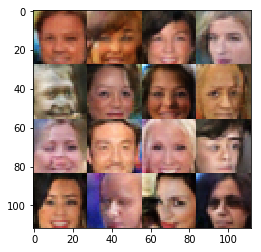

Epoch 8/10... Generator Loss: 0.2530 Discriminator Loss: 1.7948...
Epoch 8/10... Generator Loss: 0.3828 Discriminator Loss: 1.5038...
Epoch 8/10... Generator Loss: 0.6620 Discriminator Loss: 1.1192...
Epoch 8/10... Generator Loss: 0.6792 Discriminator Loss: 1.3634...
Epoch 8/10... Generator Loss: 0.4504 Discriminator Loss: 1.3483...
Epoch 8/10... Generator Loss: 0.3795 Discriminator Loss: 1.4884...
Epoch 8/10... Generator Loss: 0.1306 Discriminator Loss: 2.2852...
Epoch 8/10... Generator Loss: 1.0140 Discriminator Loss: 1.2403...
Epoch 8/10... Generator Loss: 0.6969 Discriminator Loss: 1.1385...
Epoch 8/10... Generator Loss: 0.6432 Discriminator Loss: 1.2828...


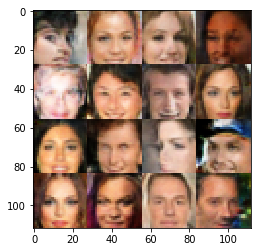

Epoch 8/10... Generator Loss: 0.5306 Discriminator Loss: 1.3435...
Epoch 8/10... Generator Loss: 0.3158 Discriminator Loss: 1.5338...
Epoch 8/10... Generator Loss: 0.5006 Discriminator Loss: 1.2641...
Epoch 8/10... Generator Loss: 0.8181 Discriminator Loss: 1.1561...
Epoch 8/10... Generator Loss: 0.4490 Discriminator Loss: 1.4693...
Epoch 8/10... Generator Loss: 0.5889 Discriminator Loss: 1.2590...
Epoch 8/10... Generator Loss: 0.7868 Discriminator Loss: 1.2789...
Epoch 8/10... Generator Loss: 0.3428 Discriminator Loss: 1.5105...
Epoch 8/10... Generator Loss: 0.5305 Discriminator Loss: 1.2817...
Epoch 8/10... Generator Loss: 0.5315 Discriminator Loss: 1.3037...


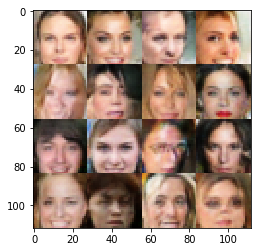

Epoch 8/10... Generator Loss: 0.3255 Discriminator Loss: 1.4962...
Epoch 8/10... Generator Loss: 0.9459 Discriminator Loss: 1.6565...
Epoch 8/10... Generator Loss: 0.3456 Discriminator Loss: 1.5333...
Epoch 8/10... Generator Loss: 0.6211 Discriminator Loss: 1.3389...
Epoch 8/10... Generator Loss: 0.3659 Discriminator Loss: 1.4850...
Epoch 8/10... Generator Loss: 0.5060 Discriminator Loss: 1.2446...
Epoch 8/10... Generator Loss: 0.5300 Discriminator Loss: 1.3248...
Epoch 8/10... Generator Loss: 0.7097 Discriminator Loss: 1.1289...
Epoch 8/10... Generator Loss: 0.3451 Discriminator Loss: 1.4843...
Epoch 8/10... Generator Loss: 0.2853 Discriminator Loss: 1.6173...


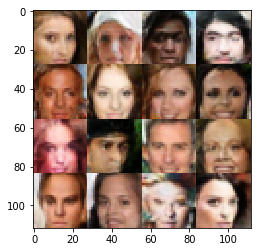

Epoch 8/10... Generator Loss: 0.2037 Discriminator Loss: 1.8723...
Epoch 8/10... Generator Loss: 0.2847 Discriminator Loss: 1.6508...
Epoch 8/10... Generator Loss: 0.5753 Discriminator Loss: 1.0479...
Epoch 8/10... Generator Loss: 0.5792 Discriminator Loss: 1.3298...
Epoch 8/10... Generator Loss: 0.4516 Discriminator Loss: 1.3340...
Epoch 8/10... Generator Loss: 0.3062 Discriminator Loss: 1.6153...
Epoch 8/10... Generator Loss: 0.8104 Discriminator Loss: 0.9751...
Epoch 8/10... Generator Loss: 0.6615 Discriminator Loss: 1.1050...
Epoch 8/10... Generator Loss: 0.3457 Discriminator Loss: 1.4827...
Epoch 8/10... Generator Loss: 1.4030 Discriminator Loss: 1.1145...


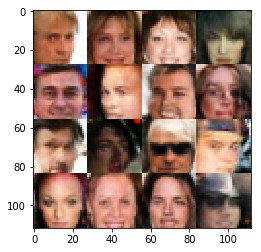

Epoch 8/10... Generator Loss: 0.4251 Discriminator Loss: 1.4241...
Epoch 8/10... Generator Loss: 0.4207 Discriminator Loss: 1.3902...
Epoch 8/10... Generator Loss: 0.3184 Discriminator Loss: 1.5638...
Epoch 8/10... Generator Loss: 0.8984 Discriminator Loss: 1.2680...
Epoch 8/10... Generator Loss: 0.4381 Discriminator Loss: 1.3240...
Epoch 8/10... Generator Loss: 0.9907 Discriminator Loss: 1.2630...
Epoch 8/10... Generator Loss: 0.4758 Discriminator Loss: 1.3680...
Epoch 8/10... Generator Loss: 0.3180 Discriminator Loss: 1.6641...
Epoch 8/10... Generator Loss: 0.3610 Discriminator Loss: 1.4635...
Epoch 8/10... Generator Loss: 0.6129 Discriminator Loss: 1.2024...


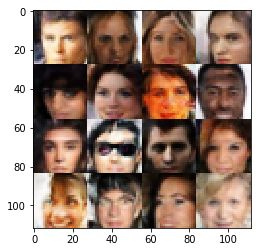

Epoch 8/10... Generator Loss: 0.9435 Discriminator Loss: 1.5493...
Epoch 8/10... Generator Loss: 0.7513 Discriminator Loss: 1.1587...
Epoch 8/10... Generator Loss: 0.7008 Discriminator Loss: 1.0465...
Epoch 8/10... Generator Loss: 0.3848 Discriminator Loss: 1.5316...
Epoch 8/10... Generator Loss: 0.3395 Discriminator Loss: 1.5366...
Epoch 8/10... Generator Loss: 0.4471 Discriminator Loss: 1.4150...
Epoch 8/10... Generator Loss: 0.3646 Discriminator Loss: 1.4464...
Epoch 8/10... Generator Loss: 0.3021 Discriminator Loss: 1.6492...
Epoch 8/10... Generator Loss: 0.5368 Discriminator Loss: 1.2108...
Epoch 8/10... Generator Loss: 0.3723 Discriminator Loss: 1.4861...


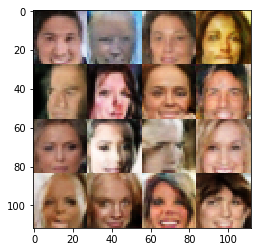

Epoch 8/10... Generator Loss: 0.5569 Discriminator Loss: 1.2268...
Epoch 8/10... Generator Loss: 0.6210 Discriminator Loss: 1.0972...
Epoch 8/10... Generator Loss: 0.4120 Discriminator Loss: 1.3285...
Epoch 8/10... Generator Loss: 0.2698 Discriminator Loss: 1.6479...
Epoch 8/10... Generator Loss: 0.4157 Discriminator Loss: 1.3823...
Epoch 8/10... Generator Loss: 0.4285 Discriminator Loss: 1.5180...
Epoch 8/10... Generator Loss: 0.4578 Discriminator Loss: 1.3594...
Epoch 8/10... Generator Loss: 0.5102 Discriminator Loss: 1.4293...
Epoch 8/10... Generator Loss: 0.3173 Discriminator Loss: 1.6436...
Epoch 8/10... Generator Loss: 0.3323 Discriminator Loss: 1.5296...


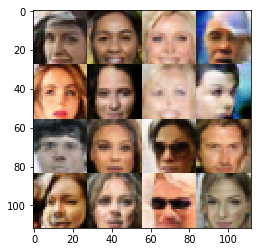

Epoch 8/10... Generator Loss: 0.5990 Discriminator Loss: 1.1260...
Epoch 8/10... Generator Loss: 0.4344 Discriminator Loss: 1.3392...
Epoch 8/10... Generator Loss: 0.9560 Discriminator Loss: 0.9030...
Epoch 8/10... Generator Loss: 0.5337 Discriminator Loss: 1.2904...
Epoch 8/10... Generator Loss: 0.3538 Discriminator Loss: 1.6671...
Epoch 8/10... Generator Loss: 0.3628 Discriminator Loss: 1.4390...
Epoch 8/10... Generator Loss: 0.3291 Discriminator Loss: 1.5186...
Epoch 8/10... Generator Loss: 0.4527 Discriminator Loss: 1.2968...
Epoch 8/10... Generator Loss: 0.3086 Discriminator Loss: 1.6142...
Epoch 8/10... Generator Loss: 0.3407 Discriminator Loss: 1.4949...


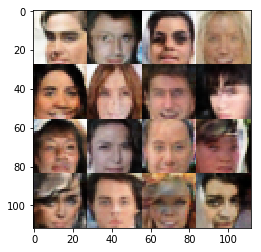

Epoch 8/10... Generator Loss: 0.3514 Discriminator Loss: 1.6114...
Epoch 8/10... Generator Loss: 0.3711 Discriminator Loss: 1.4236...
Epoch 8/10... Generator Loss: 0.7546 Discriminator Loss: 1.2263...
Epoch 8/10... Generator Loss: 0.8157 Discriminator Loss: 1.2751...
Epoch 8/10... Generator Loss: 0.4895 Discriminator Loss: 1.3045...
Epoch 8/10... Generator Loss: 0.4632 Discriminator Loss: 1.3406...
Epoch 8/10... Generator Loss: 0.3402 Discriminator Loss: 1.5558...
Epoch 8/10... Generator Loss: 0.4205 Discriminator Loss: 1.3964...
Epoch 8/10... Generator Loss: 0.4909 Discriminator Loss: 1.3450...
Epoch 8/10... Generator Loss: 0.7722 Discriminator Loss: 1.0222...


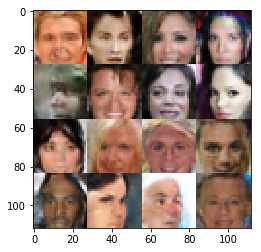

Epoch 8/10... Generator Loss: 0.7124 Discriminator Loss: 1.1841...
Epoch 8/10... Generator Loss: 0.3359 Discriminator Loss: 1.5735...
Epoch 8/10... Generator Loss: 0.7233 Discriminator Loss: 1.2427...
Epoch 8/10... Generator Loss: 0.5231 Discriminator Loss: 1.2618...
Epoch 8/10... Generator Loss: 0.5348 Discriminator Loss: 1.2238...
Epoch 8/10... Generator Loss: 0.3934 Discriminator Loss: 1.3595...
Epoch 8/10... Generator Loss: 0.2640 Discriminator Loss: 1.6663...
Epoch 8/10... Generator Loss: 0.4487 Discriminator Loss: 1.3748...
Epoch 8/10... Generator Loss: 0.4237 Discriminator Loss: 1.2960...
Epoch 8/10... Generator Loss: 0.6000 Discriminator Loss: 1.2359...


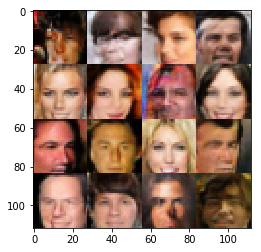

Epoch 8/10... Generator Loss: 0.7618 Discriminator Loss: 1.1642...
Epoch 8/10... Generator Loss: 0.6266 Discriminator Loss: 1.1767...
Epoch 9/10... Generator Loss: 0.2774 Discriminator Loss: 1.8365...
Epoch 9/10... Generator Loss: 0.8773 Discriminator Loss: 1.2752...
Epoch 9/10... Generator Loss: 0.5373 Discriminator Loss: 1.2206...
Epoch 9/10... Generator Loss: 0.6111 Discriminator Loss: 1.3206...
Epoch 9/10... Generator Loss: 0.2290 Discriminator Loss: 1.7838...
Epoch 9/10... Generator Loss: 0.4988 Discriminator Loss: 1.3922...
Epoch 9/10... Generator Loss: 0.2487 Discriminator Loss: 1.7597...
Epoch 9/10... Generator Loss: 0.7990 Discriminator Loss: 1.0519...


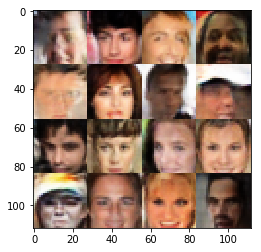

Epoch 9/10... Generator Loss: 0.6975 Discriminator Loss: 1.2205...
Epoch 9/10... Generator Loss: 1.0343 Discriminator Loss: 1.0930...
Epoch 9/10... Generator Loss: 0.2885 Discriminator Loss: 1.7077...
Epoch 9/10... Generator Loss: 0.6692 Discriminator Loss: 1.2660...
Epoch 9/10... Generator Loss: 0.4760 Discriminator Loss: 1.2552...
Epoch 9/10... Generator Loss: 1.1461 Discriminator Loss: 0.9966...
Epoch 9/10... Generator Loss: 0.4278 Discriminator Loss: 1.3866...
Epoch 9/10... Generator Loss: 0.3638 Discriminator Loss: 1.5647...
Epoch 9/10... Generator Loss: 0.7551 Discriminator Loss: 1.1795...
Epoch 9/10... Generator Loss: 0.5155 Discriminator Loss: 1.1934...


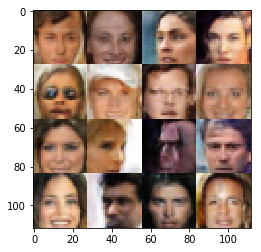

Epoch 9/10... Generator Loss: 0.3312 Discriminator Loss: 1.5924...
Epoch 9/10... Generator Loss: 0.5416 Discriminator Loss: 1.2396...
Epoch 9/10... Generator Loss: 0.3154 Discriminator Loss: 1.5697...
Epoch 9/10... Generator Loss: 1.0736 Discriminator Loss: 1.2035...
Epoch 9/10... Generator Loss: 0.6531 Discriminator Loss: 1.2629...
Epoch 9/10... Generator Loss: 0.5847 Discriminator Loss: 1.1726...
Epoch 9/10... Generator Loss: 0.4366 Discriminator Loss: 1.3355...
Epoch 9/10... Generator Loss: 0.8550 Discriminator Loss: 1.1557...
Epoch 9/10... Generator Loss: 0.6046 Discriminator Loss: 1.3377...
Epoch 9/10... Generator Loss: 0.3323 Discriminator Loss: 1.6666...


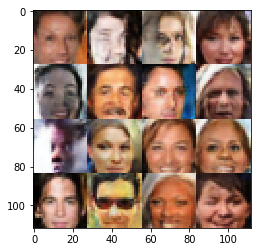

Epoch 9/10... Generator Loss: 0.6167 Discriminator Loss: 1.2173...
Epoch 9/10... Generator Loss: 0.3776 Discriminator Loss: 1.4182...
Epoch 9/10... Generator Loss: 0.4858 Discriminator Loss: 1.2937...
Epoch 9/10... Generator Loss: 0.5043 Discriminator Loss: 1.3859...
Epoch 9/10... Generator Loss: 0.5749 Discriminator Loss: 1.2313...
Epoch 9/10... Generator Loss: 0.2631 Discriminator Loss: 1.7597...
Epoch 9/10... Generator Loss: 0.4631 Discriminator Loss: 1.4538...
Epoch 9/10... Generator Loss: 0.5473 Discriminator Loss: 1.2486...
Epoch 9/10... Generator Loss: 0.6621 Discriminator Loss: 1.3584...
Epoch 9/10... Generator Loss: 0.3682 Discriminator Loss: 1.4173...


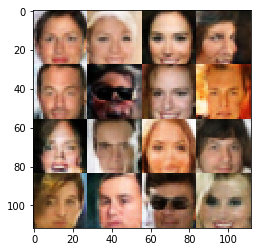

Epoch 9/10... Generator Loss: 0.3740 Discriminator Loss: 1.3888...
Epoch 9/10... Generator Loss: 0.1941 Discriminator Loss: 2.0235...
Epoch 9/10... Generator Loss: 0.3734 Discriminator Loss: 1.4342...
Epoch 9/10... Generator Loss: 0.1464 Discriminator Loss: 2.4539...
Epoch 9/10... Generator Loss: 0.6611 Discriminator Loss: 1.3799...
Epoch 9/10... Generator Loss: 0.8716 Discriminator Loss: 1.4704...
Epoch 9/10... Generator Loss: 0.3514 Discriminator Loss: 1.5047...
Epoch 9/10... Generator Loss: 0.5154 Discriminator Loss: 1.3113...
Epoch 9/10... Generator Loss: 0.3340 Discriminator Loss: 1.5316...
Epoch 9/10... Generator Loss: 0.2903 Discriminator Loss: 1.6352...


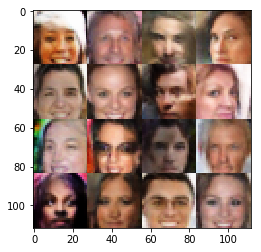

Epoch 9/10... Generator Loss: 0.4562 Discriminator Loss: 1.4432...
Epoch 9/10... Generator Loss: 0.2776 Discriminator Loss: 1.6152...
Epoch 9/10... Generator Loss: 0.5195 Discriminator Loss: 1.4725...
Epoch 9/10... Generator Loss: 0.3068 Discriminator Loss: 1.6287...
Epoch 9/10... Generator Loss: 1.4247 Discriminator Loss: 1.6860...
Epoch 9/10... Generator Loss: 0.4764 Discriminator Loss: 1.2104...
Epoch 9/10... Generator Loss: 0.4197 Discriminator Loss: 1.5165...
Epoch 9/10... Generator Loss: 0.5582 Discriminator Loss: 1.1175...
Epoch 9/10... Generator Loss: 0.2313 Discriminator Loss: 1.7983...
Epoch 9/10... Generator Loss: 0.5714 Discriminator Loss: 1.2740...


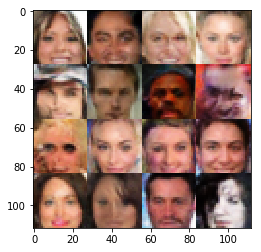

Epoch 9/10... Generator Loss: 0.3579 Discriminator Loss: 1.4377...
Epoch 9/10... Generator Loss: 0.3700 Discriminator Loss: 1.4340...
Epoch 9/10... Generator Loss: 0.5575 Discriminator Loss: 1.1938...
Epoch 9/10... Generator Loss: 0.2544 Discriminator Loss: 1.6937...
Epoch 9/10... Generator Loss: 0.3403 Discriminator Loss: 1.5159...
Epoch 9/10... Generator Loss: 0.3839 Discriminator Loss: 1.3957...
Epoch 9/10... Generator Loss: 0.6032 Discriminator Loss: 1.1572...
Epoch 9/10... Generator Loss: 0.3394 Discriminator Loss: 1.4535...
Epoch 9/10... Generator Loss: 0.4327 Discriminator Loss: 1.3247...
Epoch 9/10... Generator Loss: 0.4202 Discriminator Loss: 1.4938...


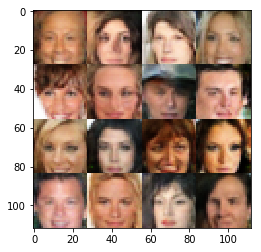

Epoch 9/10... Generator Loss: 0.6161 Discriminator Loss: 1.1982...
Epoch 9/10... Generator Loss: 0.3189 Discriminator Loss: 1.5519...
Epoch 9/10... Generator Loss: 0.6241 Discriminator Loss: 1.1647...
Epoch 9/10... Generator Loss: 0.5235 Discriminator Loss: 1.3676...
Epoch 9/10... Generator Loss: 0.4271 Discriminator Loss: 1.3566...
Epoch 9/10... Generator Loss: 0.1749 Discriminator Loss: 2.0732...
Epoch 9/10... Generator Loss: 0.9140 Discriminator Loss: 1.2827...
Epoch 9/10... Generator Loss: 0.3618 Discriminator Loss: 1.4632...
Epoch 9/10... Generator Loss: 0.2021 Discriminator Loss: 1.9206...
Epoch 9/10... Generator Loss: 0.2932 Discriminator Loss: 1.6298...


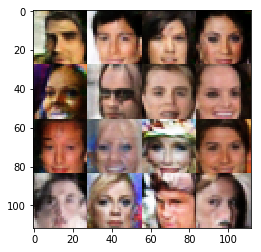

Epoch 9/10... Generator Loss: 0.4261 Discriminator Loss: 1.4159...
Epoch 9/10... Generator Loss: 0.6940 Discriminator Loss: 1.2143...
Epoch 9/10... Generator Loss: 0.6895 Discriminator Loss: 1.1752...
Epoch 9/10... Generator Loss: 0.3151 Discriminator Loss: 1.5500...
Epoch 9/10... Generator Loss: 0.4480 Discriminator Loss: 1.3480...
Epoch 9/10... Generator Loss: 0.8046 Discriminator Loss: 1.2594...
Epoch 9/10... Generator Loss: 0.7096 Discriminator Loss: 1.1335...
Epoch 9/10... Generator Loss: 1.1212 Discriminator Loss: 0.7676...
Epoch 9/10... Generator Loss: 0.7581 Discriminator Loss: 1.2216...
Epoch 9/10... Generator Loss: 1.1739 Discriminator Loss: 1.5430...


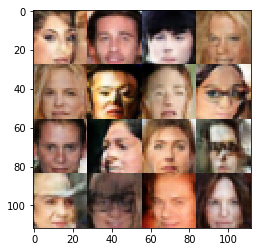

Epoch 9/10... Generator Loss: 0.5019 Discriminator Loss: 1.3529...
Epoch 9/10... Generator Loss: 0.3595 Discriminator Loss: 1.5019...
Epoch 9/10... Generator Loss: 0.2610 Discriminator Loss: 1.8057...
Epoch 9/10... Generator Loss: 0.4328 Discriminator Loss: 1.4445...
Epoch 9/10... Generator Loss: 0.3011 Discriminator Loss: 1.5808...
Epoch 9/10... Generator Loss: 0.1793 Discriminator Loss: 2.0050...
Epoch 9/10... Generator Loss: 0.8430 Discriminator Loss: 1.0996...
Epoch 9/10... Generator Loss: 0.4674 Discriminator Loss: 1.3222...
Epoch 9/10... Generator Loss: 0.5024 Discriminator Loss: 1.1934...
Epoch 9/10... Generator Loss: 0.3766 Discriminator Loss: 1.5425...


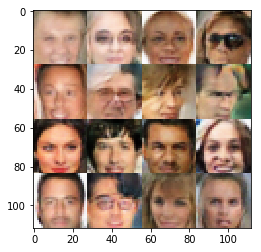

Epoch 9/10... Generator Loss: 0.9096 Discriminator Loss: 1.2496...
Epoch 9/10... Generator Loss: 0.9510 Discriminator Loss: 1.1405...
Epoch 9/10... Generator Loss: 0.4996 Discriminator Loss: 1.3530...
Epoch 9/10... Generator Loss: 0.3218 Discriminator Loss: 1.6008...
Epoch 9/10... Generator Loss: 0.4082 Discriminator Loss: 1.3429...
Epoch 9/10... Generator Loss: 0.4381 Discriminator Loss: 1.4871...
Epoch 9/10... Generator Loss: 0.3622 Discriminator Loss: 1.4997...
Epoch 9/10... Generator Loss: 0.4659 Discriminator Loss: 1.4222...
Epoch 9/10... Generator Loss: 0.6494 Discriminator Loss: 1.3245...
Epoch 9/10... Generator Loss: 0.4667 Discriminator Loss: 1.2585...


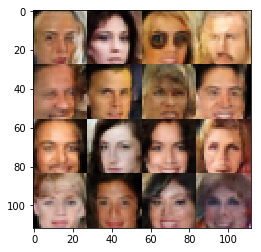

Epoch 9/10... Generator Loss: 0.3371 Discriminator Loss: 1.4951...
Epoch 9/10... Generator Loss: 0.3028 Discriminator Loss: 1.5308...
Epoch 9/10... Generator Loss: 0.2417 Discriminator Loss: 1.9060...
Epoch 9/10... Generator Loss: 0.7807 Discriminator Loss: 1.0857...
Epoch 9/10... Generator Loss: 0.2713 Discriminator Loss: 1.6561...
Epoch 9/10... Generator Loss: 0.8506 Discriminator Loss: 1.2824...
Epoch 9/10... Generator Loss: 1.0323 Discriminator Loss: 1.3470...
Epoch 9/10... Generator Loss: 0.5271 Discriminator Loss: 1.2238...
Epoch 9/10... Generator Loss: 0.2353 Discriminator Loss: 1.8195...
Epoch 9/10... Generator Loss: 0.4017 Discriminator Loss: 1.4807...


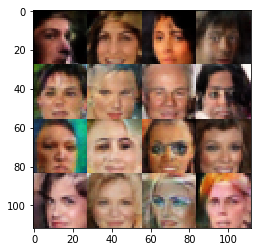

Epoch 9/10... Generator Loss: 0.4103 Discriminator Loss: 1.4415...
Epoch 9/10... Generator Loss: 0.5950 Discriminator Loss: 1.3799...
Epoch 9/10... Generator Loss: 0.6213 Discriminator Loss: 1.2337...
Epoch 9/10... Generator Loss: 0.9524 Discriminator Loss: 1.1100...
Epoch 9/10... Generator Loss: 0.2830 Discriminator Loss: 1.7488...
Epoch 9/10... Generator Loss: 0.3501 Discriminator Loss: 1.4351...
Epoch 9/10... Generator Loss: 0.5358 Discriminator Loss: 1.2429...
Epoch 9/10... Generator Loss: 0.3192 Discriminator Loss: 1.6118...
Epoch 9/10... Generator Loss: 0.7358 Discriminator Loss: 1.1609...
Epoch 9/10... Generator Loss: 0.6381 Discriminator Loss: 1.3752...


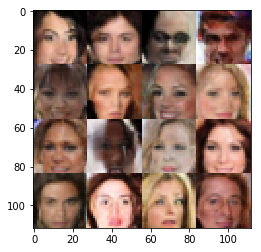

Epoch 9/10... Generator Loss: 0.7236 Discriminator Loss: 1.1475...
Epoch 9/10... Generator Loss: 0.5701 Discriminator Loss: 1.4055...
Epoch 9/10... Generator Loss: 0.6600 Discriminator Loss: 1.2387...
Epoch 9/10... Generator Loss: 0.5955 Discriminator Loss: 1.3515...
Epoch 9/10... Generator Loss: 0.7974 Discriminator Loss: 1.1385...
Epoch 9/10... Generator Loss: 0.6151 Discriminator Loss: 1.1162...
Epoch 9/10... Generator Loss: 0.5041 Discriminator Loss: 1.4255...
Epoch 9/10... Generator Loss: 0.8581 Discriminator Loss: 1.1994...
Epoch 9/10... Generator Loss: 0.3994 Discriminator Loss: 1.5045...
Epoch 9/10... Generator Loss: 0.4877 Discriminator Loss: 1.1949...


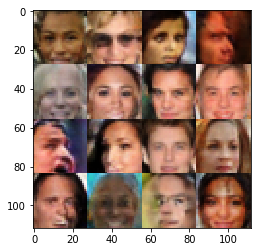

Epoch 9/10... Generator Loss: 0.3599 Discriminator Loss: 1.5606...
Epoch 9/10... Generator Loss: 0.6140 Discriminator Loss: 1.2275...
Epoch 9/10... Generator Loss: 0.3909 Discriminator Loss: 1.4338...
Epoch 9/10... Generator Loss: 0.1977 Discriminator Loss: 1.9444...
Epoch 9/10... Generator Loss: 0.4669 Discriminator Loss: 1.2435...
Epoch 9/10... Generator Loss: 0.3077 Discriminator Loss: 1.5543...
Epoch 9/10... Generator Loss: 0.2871 Discriminator Loss: 1.6667...
Epoch 9/10... Generator Loss: 0.7330 Discriminator Loss: 1.1460...
Epoch 9/10... Generator Loss: 0.4157 Discriminator Loss: 1.4645...
Epoch 9/10... Generator Loss: 0.3617 Discriminator Loss: 1.4245...


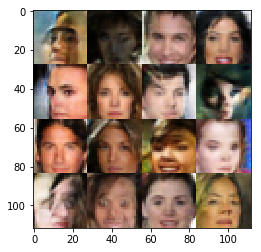

Epoch 9/10... Generator Loss: 0.3679 Discriminator Loss: 1.5124...
Epoch 9/10... Generator Loss: 0.8569 Discriminator Loss: 0.8976...
Epoch 9/10... Generator Loss: 1.0235 Discriminator Loss: 1.3419...
Epoch 9/10... Generator Loss: 0.8621 Discriminator Loss: 1.0233...
Epoch 9/10... Generator Loss: 1.1061 Discriminator Loss: 1.2263...
Epoch 9/10... Generator Loss: 0.5841 Discriminator Loss: 1.3524...
Epoch 9/10... Generator Loss: 0.4038 Discriminator Loss: 1.5429...
Epoch 9/10... Generator Loss: 0.8526 Discriminator Loss: 1.4103...
Epoch 9/10... Generator Loss: 0.7984 Discriminator Loss: 1.1980...
Epoch 9/10... Generator Loss: 0.7560 Discriminator Loss: 1.0991...


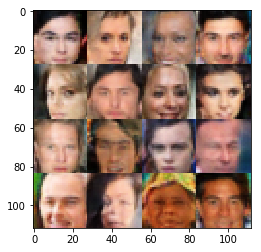

Epoch 9/10... Generator Loss: 0.4409 Discriminator Loss: 1.4516...
Epoch 9/10... Generator Loss: 0.7271 Discriminator Loss: 1.0554...
Epoch 9/10... Generator Loss: 0.3160 Discriminator Loss: 1.5440...
Epoch 9/10... Generator Loss: 0.8971 Discriminator Loss: 1.3220...
Epoch 9/10... Generator Loss: 0.7748 Discriminator Loss: 1.1635...
Epoch 9/10... Generator Loss: 1.1287 Discriminator Loss: 1.1109...
Epoch 9/10... Generator Loss: 0.3621 Discriminator Loss: 1.4431...
Epoch 9/10... Generator Loss: 0.4353 Discriminator Loss: 1.4540...
Epoch 9/10... Generator Loss: 0.6636 Discriminator Loss: 0.9381...
Epoch 9/10... Generator Loss: 0.1750 Discriminator Loss: 2.0477...


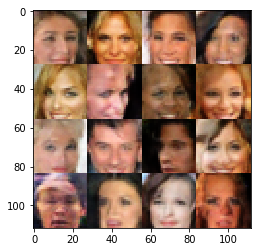

Epoch 9/10... Generator Loss: 0.3687 Discriminator Loss: 1.4317...
Epoch 9/10... Generator Loss: 0.6814 Discriminator Loss: 1.3085...
Epoch 9/10... Generator Loss: 0.3971 Discriminator Loss: 1.4694...
Epoch 9/10... Generator Loss: 0.8802 Discriminator Loss: 0.8857...
Epoch 9/10... Generator Loss: 0.8037 Discriminator Loss: 0.9388...
Epoch 9/10... Generator Loss: 0.6561 Discriminator Loss: 1.1688...
Epoch 9/10... Generator Loss: 1.6767 Discriminator Loss: 1.8810...
Epoch 9/10... Generator Loss: 0.2522 Discriminator Loss: 1.7129...
Epoch 9/10... Generator Loss: 0.3046 Discriminator Loss: 1.6206...
Epoch 9/10... Generator Loss: 0.5866 Discriminator Loss: 1.2247...


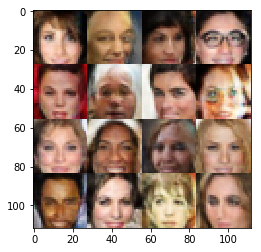

Epoch 9/10... Generator Loss: 0.6138 Discriminator Loss: 1.2353...
Epoch 9/10... Generator Loss: 0.6157 Discriminator Loss: 1.2190...
Epoch 9/10... Generator Loss: 0.5620 Discriminator Loss: 1.2301...
Epoch 9/10... Generator Loss: 0.2403 Discriminator Loss: 1.7353...
Epoch 9/10... Generator Loss: 0.3237 Discriminator Loss: 1.5319...
Epoch 9/10... Generator Loss: 0.5980 Discriminator Loss: 1.2156...
Epoch 9/10... Generator Loss: 0.7928 Discriminator Loss: 1.0699...
Epoch 9/10... Generator Loss: 0.6689 Discriminator Loss: 1.2139...
Epoch 9/10... Generator Loss: 0.7825 Discriminator Loss: 1.2414...
Epoch 9/10... Generator Loss: 0.3385 Discriminator Loss: 1.5065...


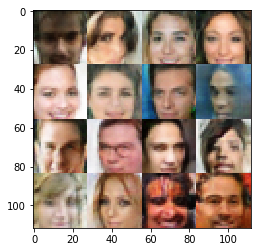

Epoch 9/10... Generator Loss: 0.6440 Discriminator Loss: 1.3713...
Epoch 9/10... Generator Loss: 0.3072 Discriminator Loss: 1.5448...
Epoch 9/10... Generator Loss: 0.4842 Discriminator Loss: 1.1966...
Epoch 9/10... Generator Loss: 0.5336 Discriminator Loss: 1.4469...
Epoch 9/10... Generator Loss: 0.3913 Discriminator Loss: 1.5052...
Epoch 9/10... Generator Loss: 0.3971 Discriminator Loss: 1.3742...
Epoch 9/10... Generator Loss: 0.2152 Discriminator Loss: 1.8423...
Epoch 9/10... Generator Loss: 0.8373 Discriminator Loss: 1.1966...
Epoch 9/10... Generator Loss: 0.8736 Discriminator Loss: 1.3097...
Epoch 9/10... Generator Loss: 0.2866 Discriminator Loss: 1.6207...


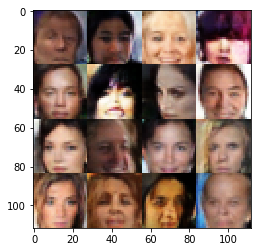

Epoch 9/10... Generator Loss: 0.4171 Discriminator Loss: 1.5171...
Epoch 9/10... Generator Loss: 0.2062 Discriminator Loss: 1.9753...
Epoch 9/10... Generator Loss: 0.3622 Discriminator Loss: 1.4304...
Epoch 9/10... Generator Loss: 0.8291 Discriminator Loss: 1.6107...
Epoch 9/10... Generator Loss: 0.6817 Discriminator Loss: 1.0697...
Epoch 9/10... Generator Loss: 0.7307 Discriminator Loss: 1.3688...
Epoch 9/10... Generator Loss: 0.5227 Discriminator Loss: 1.3401...
Epoch 9/10... Generator Loss: 0.9573 Discriminator Loss: 1.4641...
Epoch 9/10... Generator Loss: 0.7975 Discriminator Loss: 0.9963...
Epoch 9/10... Generator Loss: 0.4590 Discriminator Loss: 1.3997...


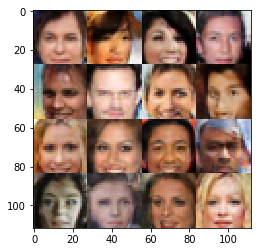

Epoch 9/10... Generator Loss: 0.8631 Discriminator Loss: 1.1339...
Epoch 9/10... Generator Loss: 0.4122 Discriminator Loss: 1.3585...
Epoch 9/10... Generator Loss: 0.6286 Discriminator Loss: 1.1377...
Epoch 9/10... Generator Loss: 0.4084 Discriminator Loss: 1.4557...
Epoch 9/10... Generator Loss: 0.2594 Discriminator Loss: 1.7265...
Epoch 9/10... Generator Loss: 0.5151 Discriminator Loss: 1.2276...
Epoch 9/10... Generator Loss: 0.4940 Discriminator Loss: 1.1897...
Epoch 9/10... Generator Loss: 0.5472 Discriminator Loss: 1.2795...
Epoch 9/10... Generator Loss: 0.3927 Discriminator Loss: 1.3990...
Epoch 9/10... Generator Loss: 0.2251 Discriminator Loss: 1.8150...


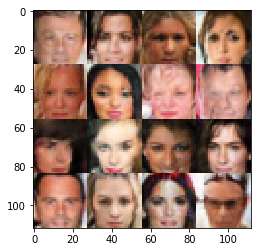

Epoch 9/10... Generator Loss: 0.3663 Discriminator Loss: 1.5339...
Epoch 9/10... Generator Loss: 0.5673 Discriminator Loss: 1.4922...
Epoch 9/10... Generator Loss: 0.3117 Discriminator Loss: 1.5421...
Epoch 9/10... Generator Loss: 0.7842 Discriminator Loss: 1.1871...
Epoch 9/10... Generator Loss: 0.3845 Discriminator Loss: 1.4143...
Epoch 9/10... Generator Loss: 0.4762 Discriminator Loss: 1.2727...
Epoch 9/10... Generator Loss: 0.3653 Discriminator Loss: 1.4266...
Epoch 9/10... Generator Loss: 0.7973 Discriminator Loss: 1.0222...
Epoch 9/10... Generator Loss: 0.7420 Discriminator Loss: 1.0888...
Epoch 9/10... Generator Loss: 0.6164 Discriminator Loss: 1.3175...


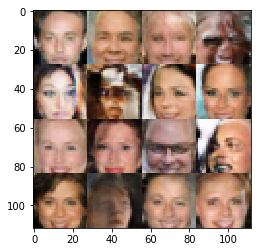

Epoch 9/10... Generator Loss: 0.5598 Discriminator Loss: 1.3820...
Epoch 9/10... Generator Loss: 0.3346 Discriminator Loss: 1.5068...
Epoch 9/10... Generator Loss: 1.1255 Discriminator Loss: 1.2845...
Epoch 9/10... Generator Loss: 0.4658 Discriminator Loss: 1.3178...
Epoch 9/10... Generator Loss: 0.3986 Discriminator Loss: 1.4926...
Epoch 9/10... Generator Loss: 0.2946 Discriminator Loss: 1.6075...
Epoch 9/10... Generator Loss: 0.9190 Discriminator Loss: 1.0502...
Epoch 9/10... Generator Loss: 0.4488 Discriminator Loss: 1.3680...
Epoch 9/10... Generator Loss: 0.7406 Discriminator Loss: 1.1829...
Epoch 9/10... Generator Loss: 0.7042 Discriminator Loss: 1.2495...


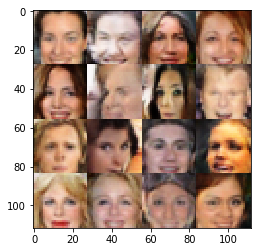

Epoch 9/10... Generator Loss: 0.8024 Discriminator Loss: 1.2025...
Epoch 9/10... Generator Loss: 0.9271 Discriminator Loss: 1.1505...
Epoch 9/10... Generator Loss: 0.3308 Discriminator Loss: 1.4786...
Epoch 9/10... Generator Loss: 0.5968 Discriminator Loss: 1.1256...
Epoch 9/10... Generator Loss: 0.7654 Discriminator Loss: 1.0062...
Epoch 9/10... Generator Loss: 0.7412 Discriminator Loss: 0.9369...
Epoch 9/10... Generator Loss: 0.4620 Discriminator Loss: 1.3671...
Epoch 9/10... Generator Loss: 0.2957 Discriminator Loss: 1.6279...
Epoch 9/10... Generator Loss: 0.4991 Discriminator Loss: 1.2158...
Epoch 9/10... Generator Loss: 1.3498 Discriminator Loss: 1.4265...


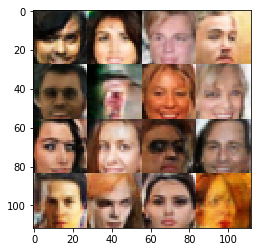

Epoch 9/10... Generator Loss: 1.1528 Discriminator Loss: 0.7873...
Epoch 9/10... Generator Loss: 0.4600 Discriminator Loss: 1.3128...
Epoch 9/10... Generator Loss: 0.3056 Discriminator Loss: 1.5362...
Epoch 9/10... Generator Loss: 0.6115 Discriminator Loss: 1.1671...
Epoch 9/10... Generator Loss: 0.6508 Discriminator Loss: 1.1850...
Epoch 9/10... Generator Loss: 0.4918 Discriminator Loss: 1.2505...
Epoch 9/10... Generator Loss: 0.5333 Discriminator Loss: 1.2020...
Epoch 9/10... Generator Loss: 0.5407 Discriminator Loss: 1.2895...
Epoch 9/10... Generator Loss: 0.4258 Discriminator Loss: 1.4837...
Epoch 9/10... Generator Loss: 0.4466 Discriminator Loss: 1.3328...


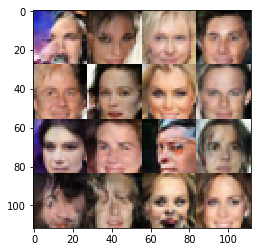

Epoch 9/10... Generator Loss: 0.3862 Discriminator Loss: 1.4010...
Epoch 9/10... Generator Loss: 1.4581 Discriminator Loss: 1.3330...
Epoch 9/10... Generator Loss: 0.1283 Discriminator Loss: 2.4972...
Epoch 9/10... Generator Loss: 0.3527 Discriminator Loss: 1.5923...
Epoch 9/10... Generator Loss: 0.3000 Discriminator Loss: 1.5911...
Epoch 9/10... Generator Loss: 0.4631 Discriminator Loss: 1.4072...
Epoch 9/10... Generator Loss: 0.6923 Discriminator Loss: 1.3360...
Epoch 9/10... Generator Loss: 0.4755 Discriminator Loss: 1.3341...
Epoch 9/10... Generator Loss: 0.9326 Discriminator Loss: 1.3543...
Epoch 9/10... Generator Loss: 0.4100 Discriminator Loss: 1.4327...


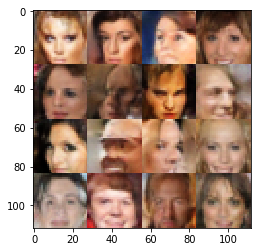

Epoch 9/10... Generator Loss: 0.4305 Discriminator Loss: 1.3975...
Epoch 9/10... Generator Loss: 1.2812 Discriminator Loss: 1.4835...
Epoch 9/10... Generator Loss: 0.5749 Discriminator Loss: 1.1733...
Epoch 9/10... Generator Loss: 0.7242 Discriminator Loss: 1.2647...
Epoch 9/10... Generator Loss: 0.4573 Discriminator Loss: 1.3265...
Epoch 9/10... Generator Loss: 0.2887 Discriminator Loss: 1.5971...
Epoch 9/10... Generator Loss: 0.3818 Discriminator Loss: 1.3870...
Epoch 9/10... Generator Loss: 0.4975 Discriminator Loss: 1.3328...
Epoch 9/10... Generator Loss: 1.0452 Discriminator Loss: 0.9593...
Epoch 9/10... Generator Loss: 0.3176 Discriminator Loss: 1.5795...


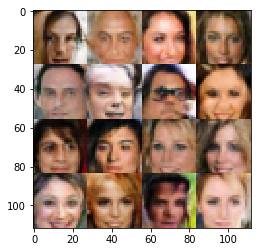

Epoch 9/10... Generator Loss: 0.3515 Discriminator Loss: 1.4741...
Epoch 9/10... Generator Loss: 0.1615 Discriminator Loss: 2.0764...
Epoch 9/10... Generator Loss: 0.4505 Discriminator Loss: 1.3048...
Epoch 9/10... Generator Loss: 0.3562 Discriminator Loss: 1.5957...
Epoch 9/10... Generator Loss: 0.4058 Discriminator Loss: 1.3856...
Epoch 9/10... Generator Loss: 0.2876 Discriminator Loss: 1.8028...
Epoch 9/10... Generator Loss: 0.3427 Discriminator Loss: 1.4495...
Epoch 9/10... Generator Loss: 0.8616 Discriminator Loss: 0.9664...
Epoch 9/10... Generator Loss: 0.3088 Discriminator Loss: 1.5746...
Epoch 9/10... Generator Loss: 0.4672 Discriminator Loss: 1.3805...


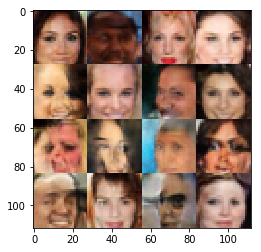

Epoch 9/10... Generator Loss: 0.4230 Discriminator Loss: 1.4482...
Epoch 9/10... Generator Loss: 0.5024 Discriminator Loss: 1.2831...
Epoch 9/10... Generator Loss: 0.4028 Discriminator Loss: 1.4432...
Epoch 9/10... Generator Loss: 1.0349 Discriminator Loss: 1.2205...
Epoch 9/10... Generator Loss: 0.6771 Discriminator Loss: 1.1894...
Epoch 9/10... Generator Loss: 0.4793 Discriminator Loss: 1.3117...
Epoch 9/10... Generator Loss: 0.5197 Discriminator Loss: 1.3758...
Epoch 9/10... Generator Loss: 0.3414 Discriminator Loss: 1.4875...
Epoch 9/10... Generator Loss: 0.5146 Discriminator Loss: 1.3676...
Epoch 9/10... Generator Loss: 0.2770 Discriminator Loss: 1.6350...


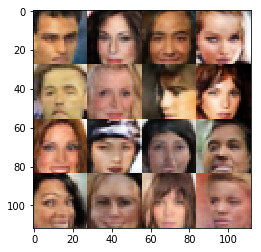

Epoch 9/10... Generator Loss: 0.4211 Discriminator Loss: 1.4211...
Epoch 9/10... Generator Loss: 0.3619 Discriminator Loss: 1.4787...
Epoch 9/10... Generator Loss: 0.2211 Discriminator Loss: 1.8423...
Epoch 9/10... Generator Loss: 0.4926 Discriminator Loss: 1.2042...
Epoch 9/10... Generator Loss: 0.8396 Discriminator Loss: 1.0821...
Epoch 9/10... Generator Loss: 0.5420 Discriminator Loss: 1.4426...
Epoch 9/10... Generator Loss: 0.1734 Discriminator Loss: 2.0218...
Epoch 9/10... Generator Loss: 0.8592 Discriminator Loss: 0.8422...
Epoch 9/10... Generator Loss: 0.2244 Discriminator Loss: 1.8338...
Epoch 9/10... Generator Loss: 0.2789 Discriminator Loss: 1.6532...


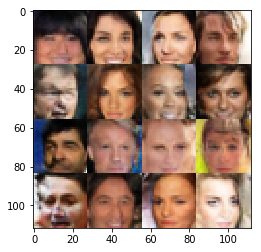

Epoch 9/10... Generator Loss: 0.4679 Discriminator Loss: 1.2713...
Epoch 9/10... Generator Loss: 0.4402 Discriminator Loss: 1.3788...
Epoch 9/10... Generator Loss: 0.5761 Discriminator Loss: 1.1831...
Epoch 9/10... Generator Loss: 0.2536 Discriminator Loss: 1.7396...
Epoch 9/10... Generator Loss: 0.2501 Discriminator Loss: 1.7918...
Epoch 9/10... Generator Loss: 0.4803 Discriminator Loss: 1.5003...
Epoch 9/10... Generator Loss: 0.4229 Discriminator Loss: 1.3925...
Epoch 9/10... Generator Loss: 0.3013 Discriminator Loss: 1.6461...
Epoch 10/10... Generator Loss: 0.4636 Discriminator Loss: 1.2433...
Epoch 10/10... Generator Loss: 0.4818 Discriminator Loss: 1.2578...


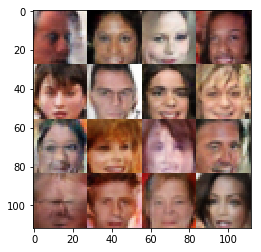

Epoch 10/10... Generator Loss: 0.9616 Discriminator Loss: 1.1040...
Epoch 10/10... Generator Loss: 0.3315 Discriminator Loss: 1.5639...
Epoch 10/10... Generator Loss: 0.7033 Discriminator Loss: 1.3140...
Epoch 10/10... Generator Loss: 0.6525 Discriminator Loss: 1.2907...
Epoch 10/10... Generator Loss: 0.8013 Discriminator Loss: 1.2249...
Epoch 10/10... Generator Loss: 0.9913 Discriminator Loss: 1.2307...
Epoch 10/10... Generator Loss: 0.5120 Discriminator Loss: 1.2803...
Epoch 10/10... Generator Loss: 0.5164 Discriminator Loss: 1.4125...
Epoch 10/10... Generator Loss: 0.2941 Discriminator Loss: 1.6398...
Epoch 10/10... Generator Loss: 0.2713 Discriminator Loss: 1.6960...


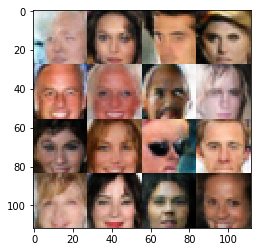

Epoch 10/10... Generator Loss: 0.3655 Discriminator Loss: 1.4373...
Epoch 10/10... Generator Loss: 0.3165 Discriminator Loss: 1.6089...
Epoch 10/10... Generator Loss: 0.4205 Discriminator Loss: 1.4211...
Epoch 10/10... Generator Loss: 0.4665 Discriminator Loss: 1.3046...
Epoch 10/10... Generator Loss: 0.5575 Discriminator Loss: 1.1670...
Epoch 10/10... Generator Loss: 0.6978 Discriminator Loss: 1.1767...
Epoch 10/10... Generator Loss: 0.4309 Discriminator Loss: 1.3970...
Epoch 10/10... Generator Loss: 0.3604 Discriminator Loss: 1.4512...
Epoch 10/10... Generator Loss: 0.4099 Discriminator Loss: 1.5856...
Epoch 10/10... Generator Loss: 0.9416 Discriminator Loss: 1.1537...


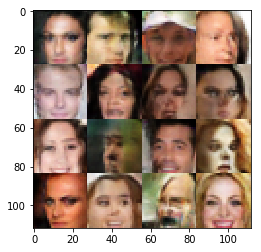

Epoch 10/10... Generator Loss: 0.3196 Discriminator Loss: 1.6305...
Epoch 10/10... Generator Loss: 0.1838 Discriminator Loss: 1.9976...
Epoch 10/10... Generator Loss: 0.6663 Discriminator Loss: 1.1839...
Epoch 10/10... Generator Loss: 0.5848 Discriminator Loss: 1.1285...
Epoch 10/10... Generator Loss: 0.4088 Discriminator Loss: 1.4719...
Epoch 10/10... Generator Loss: 0.6475 Discriminator Loss: 1.3075...
Epoch 10/10... Generator Loss: 0.5514 Discriminator Loss: 1.1831...
Epoch 10/10... Generator Loss: 0.7326 Discriminator Loss: 1.2876...
Epoch 10/10... Generator Loss: 0.8646 Discriminator Loss: 1.1824...
Epoch 10/10... Generator Loss: 0.5821 Discriminator Loss: 1.2729...


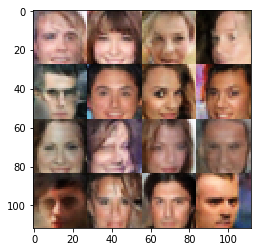

Epoch 10/10... Generator Loss: 0.2319 Discriminator Loss: 1.7484...
Epoch 10/10... Generator Loss: 0.5771 Discriminator Loss: 1.2390...
Epoch 10/10... Generator Loss: 0.4345 Discriminator Loss: 1.3640...
Epoch 10/10... Generator Loss: 0.2770 Discriminator Loss: 1.5943...
Epoch 10/10... Generator Loss: 0.2437 Discriminator Loss: 1.7724...
Epoch 10/10... Generator Loss: 0.6877 Discriminator Loss: 1.2689...
Epoch 10/10... Generator Loss: 0.3620 Discriminator Loss: 1.5569...
Epoch 10/10... Generator Loss: 0.7545 Discriminator Loss: 1.1176...
Epoch 10/10... Generator Loss: 0.5770 Discriminator Loss: 1.2781...
Epoch 10/10... Generator Loss: 0.2401 Discriminator Loss: 1.7946...


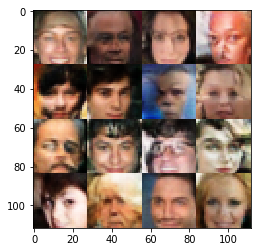

Epoch 10/10... Generator Loss: 0.4464 Discriminator Loss: 1.2853...
Epoch 10/10... Generator Loss: 0.2724 Discriminator Loss: 1.7587...
Epoch 10/10... Generator Loss: 0.5400 Discriminator Loss: 1.3201...
Epoch 10/10... Generator Loss: 0.2592 Discriminator Loss: 1.7509...
Epoch 10/10... Generator Loss: 0.5276 Discriminator Loss: 1.4791...
Epoch 10/10... Generator Loss: 0.4616 Discriminator Loss: 1.4755...
Epoch 10/10... Generator Loss: 0.7121 Discriminator Loss: 1.0698...
Epoch 10/10... Generator Loss: 0.3685 Discriminator Loss: 1.4843...
Epoch 10/10... Generator Loss: 0.1954 Discriminator Loss: 2.0199...
Epoch 10/10... Generator Loss: 0.2988 Discriminator Loss: 1.5852...


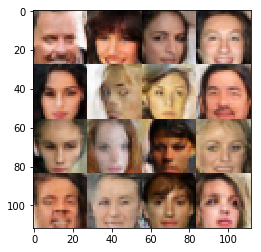

Epoch 10/10... Generator Loss: 0.5179 Discriminator Loss: 1.3660...
Epoch 10/10... Generator Loss: 0.7394 Discriminator Loss: 1.1619...
Epoch 10/10... Generator Loss: 0.3253 Discriminator Loss: 1.5848...
Epoch 10/10... Generator Loss: 0.8697 Discriminator Loss: 1.1452...
Epoch 10/10... Generator Loss: 0.4457 Discriminator Loss: 1.4044...
Epoch 10/10... Generator Loss: 0.3360 Discriminator Loss: 1.5047...
Epoch 10/10... Generator Loss: 0.5601 Discriminator Loss: 1.2677...
Epoch 10/10... Generator Loss: 0.5730 Discriminator Loss: 1.3194...
Epoch 10/10... Generator Loss: 1.0080 Discriminator Loss: 1.0304...
Epoch 10/10... Generator Loss: 0.2901 Discriminator Loss: 1.6089...


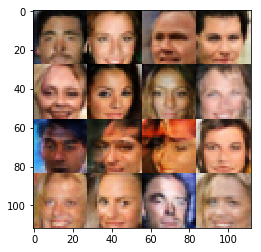

Epoch 10/10... Generator Loss: 0.8621 Discriminator Loss: 1.4088...
Epoch 10/10... Generator Loss: 0.5399 Discriminator Loss: 1.3344...
Epoch 10/10... Generator Loss: 0.4335 Discriminator Loss: 1.3461...
Epoch 10/10... Generator Loss: 0.7119 Discriminator Loss: 1.2005...
Epoch 10/10... Generator Loss: 0.5975 Discriminator Loss: 1.2237...
Epoch 10/10... Generator Loss: 0.5613 Discriminator Loss: 1.2323...
Epoch 10/10... Generator Loss: 0.7170 Discriminator Loss: 1.3088...
Epoch 10/10... Generator Loss: 0.3673 Discriminator Loss: 1.4567...
Epoch 10/10... Generator Loss: 0.3702 Discriminator Loss: 1.4370...
Epoch 10/10... Generator Loss: 0.2599 Discriminator Loss: 1.7876...


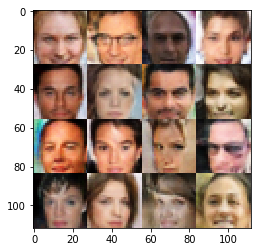

Epoch 10/10... Generator Loss: 0.5523 Discriminator Loss: 1.1521...
Epoch 10/10... Generator Loss: 0.4669 Discriminator Loss: 1.3070...
Epoch 10/10... Generator Loss: 0.9410 Discriminator Loss: 1.5586...
Epoch 10/10... Generator Loss: 0.2849 Discriminator Loss: 1.7296...
Epoch 10/10... Generator Loss: 0.6476 Discriminator Loss: 1.3746...
Epoch 10/10... Generator Loss: 0.4245 Discriminator Loss: 1.3743...
Epoch 10/10... Generator Loss: 0.3129 Discriminator Loss: 1.5721...
Epoch 10/10... Generator Loss: 0.6693 Discriminator Loss: 1.2155...
Epoch 10/10... Generator Loss: 0.3174 Discriminator Loss: 1.6203...
Epoch 10/10... Generator Loss: 0.2761 Discriminator Loss: 1.7404...


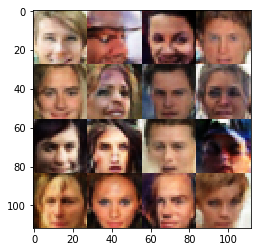

Epoch 10/10... Generator Loss: 0.2338 Discriminator Loss: 1.7560...
Epoch 10/10... Generator Loss: 0.3103 Discriminator Loss: 1.6930...
Epoch 10/10... Generator Loss: 0.5549 Discriminator Loss: 1.2288...
Epoch 10/10... Generator Loss: 0.5560 Discriminator Loss: 1.1332...
Epoch 10/10... Generator Loss: 0.2653 Discriminator Loss: 1.7196...
Epoch 10/10... Generator Loss: 0.4558 Discriminator Loss: 1.4493...
Epoch 10/10... Generator Loss: 0.4670 Discriminator Loss: 1.3595...
Epoch 10/10... Generator Loss: 0.3027 Discriminator Loss: 1.5749...
Epoch 10/10... Generator Loss: 0.4491 Discriminator Loss: 1.3313...
Epoch 10/10... Generator Loss: 0.5569 Discriminator Loss: 1.1634...


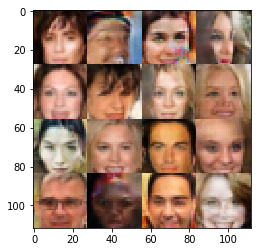

Epoch 10/10... Generator Loss: 0.8687 Discriminator Loss: 1.0163...
Epoch 10/10... Generator Loss: 0.3723 Discriminator Loss: 1.6022...
Epoch 10/10... Generator Loss: 0.5041 Discriminator Loss: 1.2949...
Epoch 10/10... Generator Loss: 0.2535 Discriminator Loss: 1.7552...
Epoch 10/10... Generator Loss: 0.2346 Discriminator Loss: 1.7987...
Epoch 10/10... Generator Loss: 0.5896 Discriminator Loss: 1.3387...
Epoch 10/10... Generator Loss: 0.5913 Discriminator Loss: 1.2082...
Epoch 10/10... Generator Loss: 0.7309 Discriminator Loss: 0.9726...
Epoch 10/10... Generator Loss: 0.5478 Discriminator Loss: 1.3677...
Epoch 10/10... Generator Loss: 0.3971 Discriminator Loss: 1.4629...


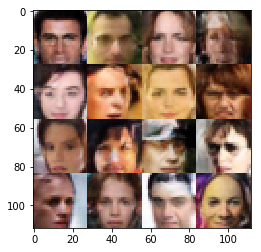

Epoch 10/10... Generator Loss: 0.2956 Discriminator Loss: 1.5984...
Epoch 10/10... Generator Loss: 0.2617 Discriminator Loss: 1.7275...
Epoch 10/10... Generator Loss: 0.4389 Discriminator Loss: 1.2560...
Epoch 10/10... Generator Loss: 0.3381 Discriminator Loss: 1.4677...
Epoch 10/10... Generator Loss: 0.2243 Discriminator Loss: 1.8138...
Epoch 10/10... Generator Loss: 0.2600 Discriminator Loss: 1.7281...
Epoch 10/10... Generator Loss: 0.9189 Discriminator Loss: 1.1468...
Epoch 10/10... Generator Loss: 0.3621 Discriminator Loss: 1.4399...
Epoch 10/10... Generator Loss: 0.7845 Discriminator Loss: 1.1661...
Epoch 10/10... Generator Loss: 0.2865 Discriminator Loss: 1.6520...


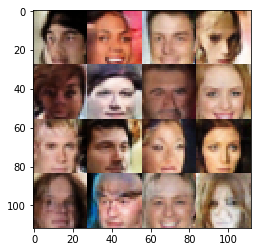

Epoch 10/10... Generator Loss: 0.6692 Discriminator Loss: 1.2794...
Epoch 10/10... Generator Loss: 0.5486 Discriminator Loss: 1.4133...
Epoch 10/10... Generator Loss: 0.3504 Discriminator Loss: 1.4733...
Epoch 10/10... Generator Loss: 0.4994 Discriminator Loss: 1.2230...
Epoch 10/10... Generator Loss: 0.3929 Discriminator Loss: 1.4703...
Epoch 10/10... Generator Loss: 0.3233 Discriminator Loss: 1.5029...
Epoch 10/10... Generator Loss: 0.6926 Discriminator Loss: 0.9929...
Epoch 10/10... Generator Loss: 0.2223 Discriminator Loss: 1.8124...
Epoch 10/10... Generator Loss: 0.6182 Discriminator Loss: 1.2460...
Epoch 10/10... Generator Loss: 0.5365 Discriminator Loss: 1.2977...


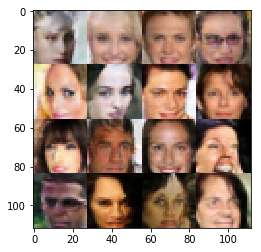

Epoch 10/10... Generator Loss: 0.3516 Discriminator Loss: 1.5091...
Epoch 10/10... Generator Loss: 0.3677 Discriminator Loss: 1.4969...
Epoch 10/10... Generator Loss: 0.8535 Discriminator Loss: 1.0445...
Epoch 10/10... Generator Loss: 0.4279 Discriminator Loss: 1.4761...
Epoch 10/10... Generator Loss: 0.5804 Discriminator Loss: 1.2718...
Epoch 10/10... Generator Loss: 0.4483 Discriminator Loss: 1.3357...
Epoch 10/10... Generator Loss: 0.3422 Discriminator Loss: 1.4550...
Epoch 10/10... Generator Loss: 0.3565 Discriminator Loss: 1.4373...
Epoch 10/10... Generator Loss: 0.6111 Discriminator Loss: 1.1144...
Epoch 10/10... Generator Loss: 0.5624 Discriminator Loss: 1.3934...


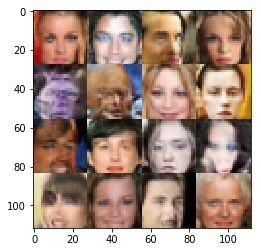

Epoch 10/10... Generator Loss: 0.2625 Discriminator Loss: 1.6914...
Epoch 10/10... Generator Loss: 0.4379 Discriminator Loss: 1.2827...
Epoch 10/10... Generator Loss: 0.6788 Discriminator Loss: 1.1087...
Epoch 10/10... Generator Loss: 0.6740 Discriminator Loss: 1.1714...
Epoch 10/10... Generator Loss: 0.6281 Discriminator Loss: 1.1545...
Epoch 10/10... Generator Loss: 0.5180 Discriminator Loss: 1.3216...
Epoch 10/10... Generator Loss: 1.0074 Discriminator Loss: 1.2800...
Epoch 10/10... Generator Loss: 0.4453 Discriminator Loss: 1.5515...
Epoch 10/10... Generator Loss: 0.9055 Discriminator Loss: 1.0912...
Epoch 10/10... Generator Loss: 0.3048 Discriminator Loss: 1.6495...


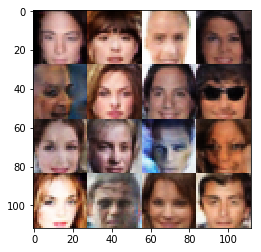

Epoch 10/10... Generator Loss: 0.6308 Discriminator Loss: 1.1144...
Epoch 10/10... Generator Loss: 0.9898 Discriminator Loss: 1.0519...
Epoch 10/10... Generator Loss: 0.5300 Discriminator Loss: 1.4472...
Epoch 10/10... Generator Loss: 0.4683 Discriminator Loss: 1.3507...
Epoch 10/10... Generator Loss: 0.7546 Discriminator Loss: 0.9825...
Epoch 10/10... Generator Loss: 1.3255 Discriminator Loss: 0.9099...
Epoch 10/10... Generator Loss: 0.2441 Discriminator Loss: 1.7465...
Epoch 10/10... Generator Loss: 0.3073 Discriminator Loss: 1.6409...
Epoch 10/10... Generator Loss: 0.3633 Discriminator Loss: 1.5601...
Epoch 10/10... Generator Loss: 0.5496 Discriminator Loss: 1.3199...


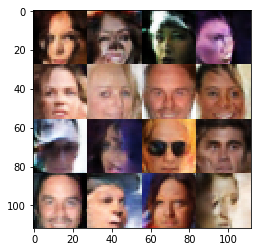

Epoch 10/10... Generator Loss: 1.8799 Discriminator Loss: 0.6331...
Epoch 10/10... Generator Loss: 1.4805 Discriminator Loss: 0.5083...
Epoch 10/10... Generator Loss: 0.4908 Discriminator Loss: 1.2789...
Epoch 10/10... Generator Loss: 0.1738 Discriminator Loss: 2.0440...
Epoch 10/10... Generator Loss: 0.4464 Discriminator Loss: 1.2520...
Epoch 10/10... Generator Loss: 0.5005 Discriminator Loss: 1.2388...
Epoch 10/10... Generator Loss: 0.2891 Discriminator Loss: 1.6448...
Epoch 10/10... Generator Loss: 0.6958 Discriminator Loss: 1.1745...
Epoch 10/10... Generator Loss: 0.9297 Discriminator Loss: 0.8519...
Epoch 10/10... Generator Loss: 0.7177 Discriminator Loss: 1.0004...


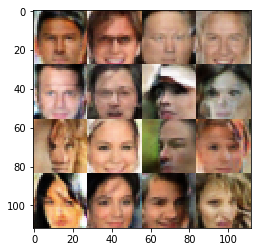

Epoch 10/10... Generator Loss: 0.2141 Discriminator Loss: 1.8069...
Epoch 10/10... Generator Loss: 0.5857 Discriminator Loss: 1.2007...
Epoch 10/10... Generator Loss: 0.9230 Discriminator Loss: 0.7878...
Epoch 10/10... Generator Loss: 1.4691 Discriminator Loss: 1.4676...
Epoch 10/10... Generator Loss: 1.1536 Discriminator Loss: 1.1581...
Epoch 10/10... Generator Loss: 0.9475 Discriminator Loss: 1.4646...
Epoch 10/10... Generator Loss: 0.7075 Discriminator Loss: 1.2168...
Epoch 10/10... Generator Loss: 0.2896 Discriminator Loss: 1.6451...
Epoch 10/10... Generator Loss: 0.5887 Discriminator Loss: 1.1874...
Epoch 10/10... Generator Loss: 0.8490 Discriminator Loss: 0.8839...


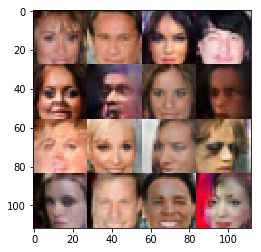

Epoch 10/10... Generator Loss: 0.5363 Discriminator Loss: 1.2589...
Epoch 10/10... Generator Loss: 0.5846 Discriminator Loss: 1.2564...
Epoch 10/10... Generator Loss: 0.6577 Discriminator Loss: 1.1357...
Epoch 10/10... Generator Loss: 0.4793 Discriminator Loss: 1.2321...
Epoch 10/10... Generator Loss: 1.1070 Discriminator Loss: 1.6820...
Epoch 10/10... Generator Loss: 0.2836 Discriminator Loss: 1.5948...
Epoch 10/10... Generator Loss: 0.4772 Discriminator Loss: 1.4090...
Epoch 10/10... Generator Loss: 0.8743 Discriminator Loss: 1.3770...
Epoch 10/10... Generator Loss: 0.7547 Discriminator Loss: 1.3144...
Epoch 10/10... Generator Loss: 0.6927 Discriminator Loss: 1.0995...


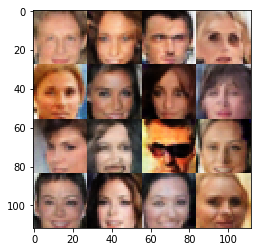

Epoch 10/10... Generator Loss: 0.4257 Discriminator Loss: 1.3811...
Epoch 10/10... Generator Loss: 0.4896 Discriminator Loss: 1.2150...
Epoch 10/10... Generator Loss: 1.5216 Discriminator Loss: 0.9924...
Epoch 10/10... Generator Loss: 0.6351 Discriminator Loss: 1.2712...
Epoch 10/10... Generator Loss: 0.3624 Discriminator Loss: 1.4687...
Epoch 10/10... Generator Loss: 0.4147 Discriminator Loss: 1.4340...
Epoch 10/10... Generator Loss: 0.4258 Discriminator Loss: 1.4135...
Epoch 10/10... Generator Loss: 0.9859 Discriminator Loss: 1.0913...
Epoch 10/10... Generator Loss: 0.9794 Discriminator Loss: 0.9514...
Epoch 10/10... Generator Loss: 0.3617 Discriminator Loss: 1.5811...


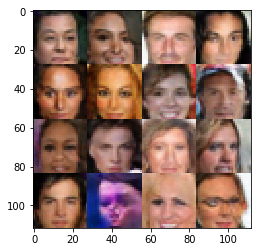

Epoch 10/10... Generator Loss: 0.4613 Discriminator Loss: 1.5331...
Epoch 10/10... Generator Loss: 0.4632 Discriminator Loss: 1.4085...
Epoch 10/10... Generator Loss: 0.3031 Discriminator Loss: 1.6040...
Epoch 10/10... Generator Loss: 0.2331 Discriminator Loss: 1.7549...
Epoch 10/10... Generator Loss: 0.3785 Discriminator Loss: 1.5003...
Epoch 10/10... Generator Loss: 0.5735 Discriminator Loss: 1.2853...
Epoch 10/10... Generator Loss: 0.7961 Discriminator Loss: 1.2742...
Epoch 10/10... Generator Loss: 0.3938 Discriminator Loss: 1.4085...
Epoch 10/10... Generator Loss: 0.4350 Discriminator Loss: 1.3089...
Epoch 10/10... Generator Loss: 0.4895 Discriminator Loss: 1.2209...


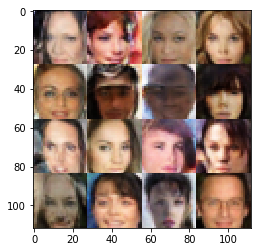

Epoch 10/10... Generator Loss: 0.6200 Discriminator Loss: 1.0759...
Epoch 10/10... Generator Loss: 0.4029 Discriminator Loss: 1.3829...
Epoch 10/10... Generator Loss: 0.8764 Discriminator Loss: 1.3787...
Epoch 10/10... Generator Loss: 0.3850 Discriminator Loss: 1.5205...
Epoch 10/10... Generator Loss: 0.3733 Discriminator Loss: 1.4598...
Epoch 10/10... Generator Loss: 0.5845 Discriminator Loss: 1.1717...
Epoch 10/10... Generator Loss: 0.2442 Discriminator Loss: 1.7801...
Epoch 10/10... Generator Loss: 0.3903 Discriminator Loss: 1.4363...
Epoch 10/10... Generator Loss: 0.4138 Discriminator Loss: 1.4317...
Epoch 10/10... Generator Loss: 0.7397 Discriminator Loss: 1.1528...


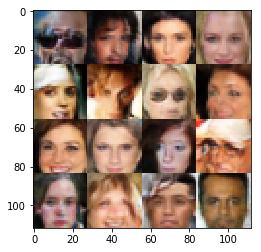

Epoch 10/10... Generator Loss: 0.5578 Discriminator Loss: 1.1762...
Epoch 10/10... Generator Loss: 0.4636 Discriminator Loss: 1.4200...
Epoch 10/10... Generator Loss: 1.1763 Discriminator Loss: 1.1807...
Epoch 10/10... Generator Loss: 0.3599 Discriminator Loss: 1.5379...
Epoch 10/10... Generator Loss: 0.5989 Discriminator Loss: 1.1535...
Epoch 10/10... Generator Loss: 0.7214 Discriminator Loss: 1.0692...
Epoch 10/10... Generator Loss: 0.3366 Discriminator Loss: 1.6151...
Epoch 10/10... Generator Loss: 0.1632 Discriminator Loss: 2.1524...
Epoch 10/10... Generator Loss: 0.2636 Discriminator Loss: 1.7042...
Epoch 10/10... Generator Loss: 0.3485 Discriminator Loss: 1.4635...


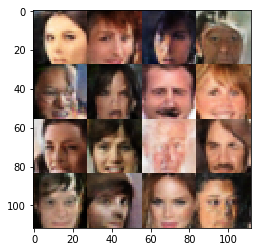

Epoch 10/10... Generator Loss: 1.0386 Discriminator Loss: 1.0109...
Epoch 10/10... Generator Loss: 0.5288 Discriminator Loss: 1.2784...
Epoch 10/10... Generator Loss: 0.4052 Discriminator Loss: 1.3786...
Epoch 10/10... Generator Loss: 0.5608 Discriminator Loss: 1.2116...
Epoch 10/10... Generator Loss: 0.3261 Discriminator Loss: 1.4788...
Epoch 10/10... Generator Loss: 0.2793 Discriminator Loss: 1.6929...
Epoch 10/10... Generator Loss: 0.6101 Discriminator Loss: 1.3098...
Epoch 10/10... Generator Loss: 0.7280 Discriminator Loss: 1.2741...
Epoch 10/10... Generator Loss: 0.4396 Discriminator Loss: 1.3125...
Epoch 10/10... Generator Loss: 0.5458 Discriminator Loss: 1.2171...


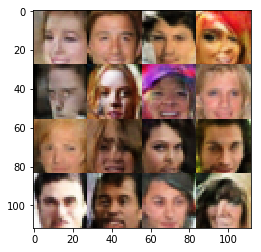

Epoch 10/10... Generator Loss: 0.4152 Discriminator Loss: 1.3589...
Epoch 10/10... Generator Loss: 0.2140 Discriminator Loss: 1.9101...
Epoch 10/10... Generator Loss: 0.3840 Discriminator Loss: 1.4413...
Epoch 10/10... Generator Loss: 0.2075 Discriminator Loss: 1.8250...
Epoch 10/10... Generator Loss: 0.2826 Discriminator Loss: 1.7344...
Epoch 10/10... Generator Loss: 0.2233 Discriminator Loss: 1.8621...
Epoch 10/10... Generator Loss: 0.8459 Discriminator Loss: 0.9929...
Epoch 10/10... Generator Loss: 0.3679 Discriminator Loss: 1.3978...
Epoch 10/10... Generator Loss: 0.3423 Discriminator Loss: 1.4339...
Epoch 10/10... Generator Loss: 0.3168 Discriminator Loss: 1.6180...


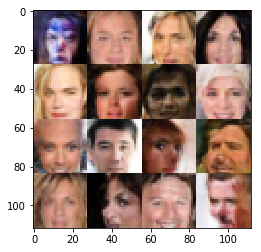

Epoch 10/10... Generator Loss: 0.7401 Discriminator Loss: 0.9740...
Epoch 10/10... Generator Loss: 0.4916 Discriminator Loss: 1.2289...
Epoch 10/10... Generator Loss: 0.5435 Discriminator Loss: 1.3865...
Epoch 10/10... Generator Loss: 1.1301 Discriminator Loss: 0.8672...
Epoch 10/10... Generator Loss: 0.3984 Discriminator Loss: 1.3504...
Epoch 10/10... Generator Loss: 1.0888 Discriminator Loss: 0.8649...
Epoch 10/10... Generator Loss: 0.4247 Discriminator Loss: 1.5381...
Epoch 10/10... Generator Loss: 0.7671 Discriminator Loss: 1.0363...
Epoch 10/10... Generator Loss: 0.5796 Discriminator Loss: 1.1218...
Epoch 10/10... Generator Loss: 0.3436 Discriminator Loss: 1.4920...


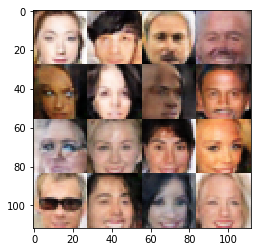

Epoch 10/10... Generator Loss: 0.7531 Discriminator Loss: 1.3490...
Epoch 10/10... Generator Loss: 0.7690 Discriminator Loss: 1.0880...
Epoch 10/10... Generator Loss: 0.6294 Discriminator Loss: 1.1541...
Epoch 10/10... Generator Loss: 0.2952 Discriminator Loss: 1.6655...
Epoch 10/10... Generator Loss: 0.4062 Discriminator Loss: 1.3653...
Epoch 10/10... Generator Loss: 0.4474 Discriminator Loss: 1.3964...
Epoch 10/10... Generator Loss: 0.8220 Discriminator Loss: 1.4294...
Epoch 10/10... Generator Loss: 1.0974 Discriminator Loss: 0.9715...
Epoch 10/10... Generator Loss: 0.3596 Discriminator Loss: 1.5384...
Epoch 10/10... Generator Loss: 0.3954 Discriminator Loss: 1.5114...


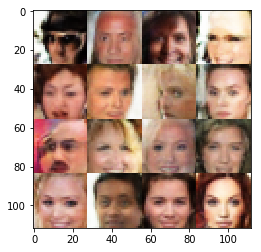

Epoch 10/10... Generator Loss: 0.9589 Discriminator Loss: 1.1020...
Epoch 10/10... Generator Loss: 0.8222 Discriminator Loss: 1.4129...
Epoch 10/10... Generator Loss: 0.2726 Discriminator Loss: 1.6245...
Epoch 10/10... Generator Loss: 0.3406 Discriminator Loss: 1.5165...
Epoch 10/10... Generator Loss: 0.4795 Discriminator Loss: 1.3262...
Epoch 10/10... Generator Loss: 0.3914 Discriminator Loss: 1.4350...
Epoch 10/10... Generator Loss: 0.3600 Discriminator Loss: 1.4648...
Epoch 10/10... Generator Loss: 0.9452 Discriminator Loss: 1.0721...
Epoch 10/10... Generator Loss: 0.3809 Discriminator Loss: 1.4354...
Epoch 10/10... Generator Loss: 0.4370 Discriminator Loss: 1.2953...


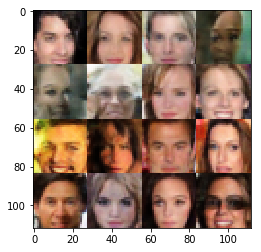

Epoch 10/10... Generator Loss: 0.4250 Discriminator Loss: 1.4131...
Epoch 10/10... Generator Loss: 0.2547 Discriminator Loss: 1.7821...
Epoch 10/10... Generator Loss: 0.4914 Discriminator Loss: 1.3053...
Epoch 10/10... Generator Loss: 0.3083 Discriminator Loss: 1.5602...
Epoch 10/10... Generator Loss: 0.7127 Discriminator Loss: 1.0339...
Epoch 10/10... Generator Loss: 0.3199 Discriminator Loss: 1.4471...
Epoch 10/10... Generator Loss: 0.2412 Discriminator Loss: 1.8436...
Epoch 10/10... Generator Loss: 0.9219 Discriminator Loss: 1.3620...
Epoch 10/10... Generator Loss: 0.8961 Discriminator Loss: 1.1850...
Epoch 10/10... Generator Loss: 0.3022 Discriminator Loss: 1.6080...


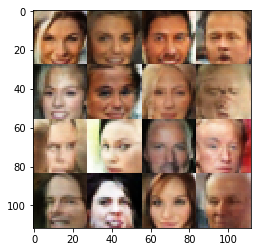

Epoch 10/10... Generator Loss: 0.5690 Discriminator Loss: 1.3056...
Epoch 10/10... Generator Loss: 0.3000 Discriminator Loss: 1.6106...
Epoch 10/10... Generator Loss: 0.4062 Discriminator Loss: 1.3905...
Epoch 10/10... Generator Loss: 0.2649 Discriminator Loss: 1.7089...
Epoch 10/10... Generator Loss: 0.7808 Discriminator Loss: 1.0796...
Epoch 10/10... Generator Loss: 0.4739 Discriminator Loss: 1.2379...
Epoch 10/10... Generator Loss: 0.2822 Discriminator Loss: 1.6254...
Epoch 10/10... Generator Loss: 0.2999 Discriminator Loss: 1.5500...
Epoch 10/10... Generator Loss: 0.2440 Discriminator Loss: 1.7543...
Epoch 10/10... Generator Loss: 0.2571 Discriminator Loss: 1.7497...


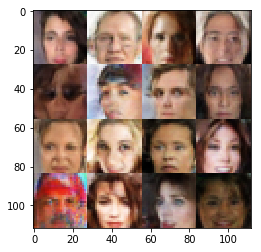

Epoch 10/10... Generator Loss: 0.3457 Discriminator Loss: 1.5269...
Epoch 10/10... Generator Loss: 0.1968 Discriminator Loss: 1.9369...
Epoch 10/10... Generator Loss: 0.2333 Discriminator Loss: 1.9058...
Epoch 10/10... Generator Loss: 0.2980 Discriminator Loss: 1.5781...
Epoch 10/10... Generator Loss: 0.2909 Discriminator Loss: 1.6159...
Epoch 10/10... Generator Loss: 0.6759 Discriminator Loss: 1.0954...
Epoch 10/10... Generator Loss: 0.5475 Discriminator Loss: 1.3023...
Epoch 10/10... Generator Loss: 0.6044 Discriminator Loss: 1.5534...
Epoch 10/10... Generator Loss: 0.3574 Discriminator Loss: 1.5371...
Epoch 10/10... Generator Loss: 0.3491 Discriminator Loss: 1.4783...


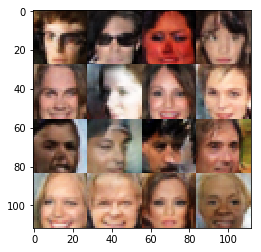

Epoch 10/10... Generator Loss: 0.5098 Discriminator Loss: 1.3080...
Epoch 10/10... Generator Loss: 0.6854 Discriminator Loss: 1.1176...
Epoch 10/10... Generator Loss: 0.9083 Discriminator Loss: 1.1823...
Epoch 10/10... Generator Loss: 0.5717 Discriminator Loss: 1.2291...
Epoch 10/10... Generator Loss: 0.2886 Discriminator Loss: 1.6345...
Epoch 10/10... Generator Loss: 0.3195 Discriminator Loss: 1.6305...
Epoch 10/10... Generator Loss: 0.4997 Discriminator Loss: 1.3638...
Epoch 10/10... Generator Loss: 0.4747 Discriminator Loss: 1.2818...
Epoch 10/10... Generator Loss: 0.2778 Discriminator Loss: 1.6925...
Epoch 10/10... Generator Loss: 0.8399 Discriminator Loss: 1.0741...


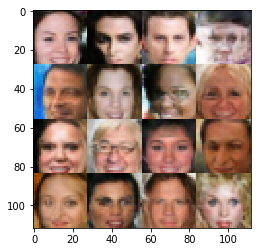

Epoch 10/10... Generator Loss: 0.5078 Discriminator Loss: 1.2394...
Epoch 10/10... Generator Loss: 0.2764 Discriminator Loss: 1.6133...
Epoch 10/10... Generator Loss: 0.6179 Discriminator Loss: 1.0777...
Epoch 10/10... Generator Loss: 0.6541 Discriminator Loss: 1.1512...
Epoch 10/10... Generator Loss: 0.8876 Discriminator Loss: 1.4016...


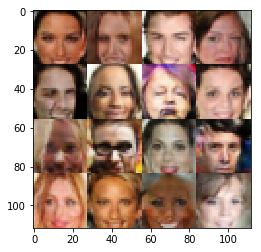

In [48]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.1


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 10

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.